# Aprendizaje Automático - Trabajo Práctico
## Profesores
* Joel Spak
* Augstín Almada
* Bruno Cocitto López
## Alumnos
* Ezequiel Arévalo
* Simón Revello

In [62]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sbn
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression, LogisticRegression
from sklearn.metrics import confusion_matrix, classification_report
from imblearn.over_sampling import SMOTE
import warnings

In [63]:
warnings.simplefilter(action='ignore', category=FutureWarning)

In [64]:
DATA_FILE = "weatherAUS.csv"
data = pd.read_csv(DATA_FILE)

## Análisis Descriptivo

Nos quedamos con las localidades que corresponden para el trabajo práctico e imprimimos los campos del dataset para entenderlo mejor.

In [65]:
data.query("Location in ('Sydney', 'SydneyAirport', 'Canberra', 'Melbourne', 'MelbourneAirport')", inplace=True)
data.drop("Unnamed: 0", axis=1, inplace=True)

In [66]:
print(data.info())
print("-----------------------------------")
print(data.describe())
print("-----------------------------------")
print(data.head())

<class 'pandas.core.frame.DataFrame'>
Index: 15986 entries, 30167 to 70370
Data columns (total 24 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Date              15986 non-null  object 
 1   Location          15986 non-null  object 
 2   MinTemp           15495 non-null  float64
 3   MaxTemp           15500 non-null  float64
 4   Rainfall          15199 non-null  float64
 5   Evaporation       14280 non-null  float64
 6   Sunshine          14038 non-null  float64
 7   WindGustDir       14529 non-null  object 
 8   WindGustSpeed     14531 non-null  float64
 9   WindDir9am        15291 non-null  object 
 10  WindDir3pm        15696 non-null  object 
 11  WindSpeed9am      15725 non-null  float64
 12  WindSpeed3pm      15737 non-null  float64
 13  Humidity9am       15416 non-null  float64
 14  Humidity3pm       15461 non-null  float64
 15  Pressure9am       15251 non-null  float64
 16  Pressure3pm       15260 non-null  float64

## Valores Nulos
Graficamos la dispersion de los valores nulos en un mapa de calor

<Axes: >

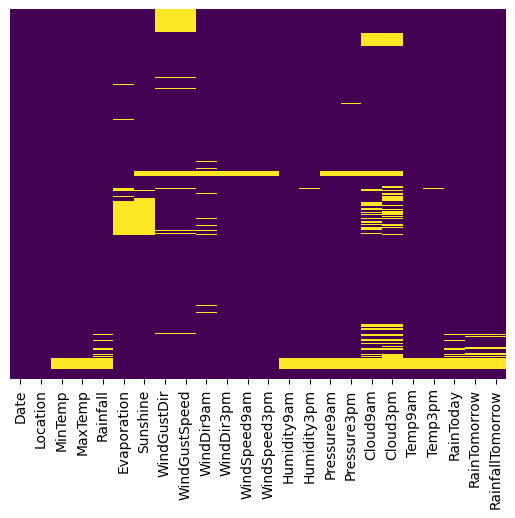

In [67]:
sbn.heatmap(data.isnull(), yticklabels=False, cmap="viridis", cbar=False)

# Tratamiento de los valores nulos
---
## RainTomorrow, RainToday y RainfallTomorrow

<p> Removeremos las filas que contengan valores nulos para RainToday, RainTomorrow y RainfallTomorrow y la almacenaremos en una variable para utilizarla para predecir sus valores como practica un vez que se tenga el modelo armado con la regresion lineal. </p>

In [68]:
null_rows_for_predictions = data.loc[ data['RainTomorrow'].isnull() | data['RainfallTomorrow'].isnull() | data['Rainfall'].isnull()  ]
data = data [ data['RainTomorrow'].notna() & data["RainfallTomorrow"].notna() & data["RainToday"].notna() ]

## Generar encodings para variable categoricas no numericas
### Encoding de la variable Date
<p> Se intentaron realizar 3 versiones de encoding para la variable date, por semanas, por meses y por estacion </p>
<p> Luego de probar concluimos que el modelo arrojaba valores muy simalares para las 3 formas de codificar la fecha.</p>
<p> Euristicamente concluimos que no hay un impacto significativo en elegir una de las 3 pero se elige la agrupacion por estacion porque al ser solo 4 variables ayuda a explicar el modelo.</p>
<p> Se deja comentado el codigo del encoding para semanas y meses, pero no se utiliza para un mejor entendimiento de los graficos </p>


In [69]:
from datetime import datetime

#data["Week"] = data["Date"].apply(lambda time: datetime.strptime(time, '%Y-%m-%d').date().isocalendar().week )
#data["Month"] = data["Date"].apply(lambda time: datetime.strptime(time, '%Y-%m-%d').month)
data["Season"] = data["Date"].apply(lambda time: ( datetime.strptime(time, '%Y-%m-%d').month ) %12 // 3 + 1 )

data.drop("Date", axis=1, inplace=True)

### Generar enconding para el resto de las variables

Para variables Yes/No como RainToday and RainTomorrow generamos encoding binarios asignando 1 y 0 respectivamente.
<p> Para variables que describen las direcciones del viento, las colapsamos en 4 valores N,S,W y E. Luego la transformamos a variables dummies al igual que Location. </p>

In [70]:
from sklearn.preprocessing import LabelEncoder

one_hot_encoding=pd.get_dummies(data.Location, dtype=int)
data.drop("Location", axis=1, inplace=True)
data = data.join(one_hot_encoding)

cardinal_points_map = {
    "N" : "^N.*$",
    "S" : "^S.*$",
    "W" : "^W.*$",
    "E" : "^E.*$"
}

for k,v in cardinal_points_map.items():
    data.WindGustDir.replace( to_replace=v, value=k, regex=True, inplace=True)
    data.WindDir3pm.replace( to_replace=v, value=k, regex=True, inplace=True)
    data.WindDir9am.replace( to_replace=v, value=k, regex=True, inplace=True)

one_hot_encoding=pd.get_dummies(data.WindGustDir, dtype=int, prefix="WindGustDir_")
data.drop("WindGustDir", axis=1, inplace=True)
data= data.join(one_hot_encoding)

one_hot_encoding=pd.get_dummies(data.WindDir9am, dtype=int,  prefix="WindDir9am_")
data.drop("WindDir9am", axis=1, inplace=True)
data = data.join(one_hot_encoding)

one_hot_encoding=pd.get_dummies(data.WindDir3pm, dtype=int,  prefix="WindDir3pm_")
data.drop("WindDir3pm", axis=1, inplace=True)
data = data.join(one_hot_encoding)

# one_hot_encoding=pd.get_dummies(data.Month, dtype=int, prefix="Month_")
# data.drop("Month", axis=1, inplace=True)
# data= data.join(one_hot_encoding)

one_hot_encoding=pd.get_dummies(data.Season, dtype=int, prefix="Season_")
data.drop("Season", axis=1, inplace=True)
data= data.join(one_hot_encoding)

# one_hot_encoding=pd.get_dummies(data.Week, dtype=int, prefix="Week_")
# data.drop("Week", axis=1, inplace=True)
# data= data.join(one_hot_encoding)

le = LabelEncoder()
data["RainToday"] = le.fit_transform(data.RainToday)
data["RainTomorrow"] = le.fit_transform(data.RainTomorrow)

full_data_encoded = data.copy() # esta variable se utilizara mas adelante para calcular una regresion sobre los datos sin interpolar

## Graficar y entendier la distribucion de las variables

Primero, trataremos de entender la distribucion del resto de las variables y cómo se ajustan los distintos métodos de interpolación a los datos.

### Interpolar utilizando method='linear'

Considerando que los datos están organizados de manera cronológica y representan valores recolectados cronologicamente para fechas consecutivas, estas no deberian variar demasiado, asi que aplicamos la función de interpolación utilizando el parámetro 'linear' para completar los valores faltantes con datos similares.

A continuación, se muestran como se reemplazan los valores nulos en el conjunto de datos, demostrando que la interpolación 'linear' es más efectiva que, por ejemplo, el uso del 'promedio' para rellenar valores nulos en todas las variables a excepción de Cloud9am, Cloud3pm, Evaporation y Sunshine.

In [71]:
def plot_interpolated_scatter(cols: list, pd_data: pd.DataFrame, method: str, order:any = None, sx :int = None, sy:int = None, fsize : tuple=(12,12)):

    sx = int(len(cols)/2) + int(len(cols)%2) if not sx else sx 
    sy = 2 if not sy else sy 

    f, axs = plt.subplots(sx,sy, figsize=fsize, squeeze=False)
    
    i = 0
    for x in range(0, sx):
        for y in range(0,sy):
            if i > len(cols)-1:
                break
            col = cols[i]
            data_to_plot = pd_data[[col]].copy()
            data_to_plot.loc[:, "is_nan"] = data_to_plot[col].isnull()
            data_to_plot.interpolate(method=method,order=order, inplace=True)
            sbn.scatterplot(data=data_to_plot, x=range(0, data_to_plot.shape[0] ), y=col, hue="is_nan", ax=axs[x][y])
            i+=1
    plt.show()    

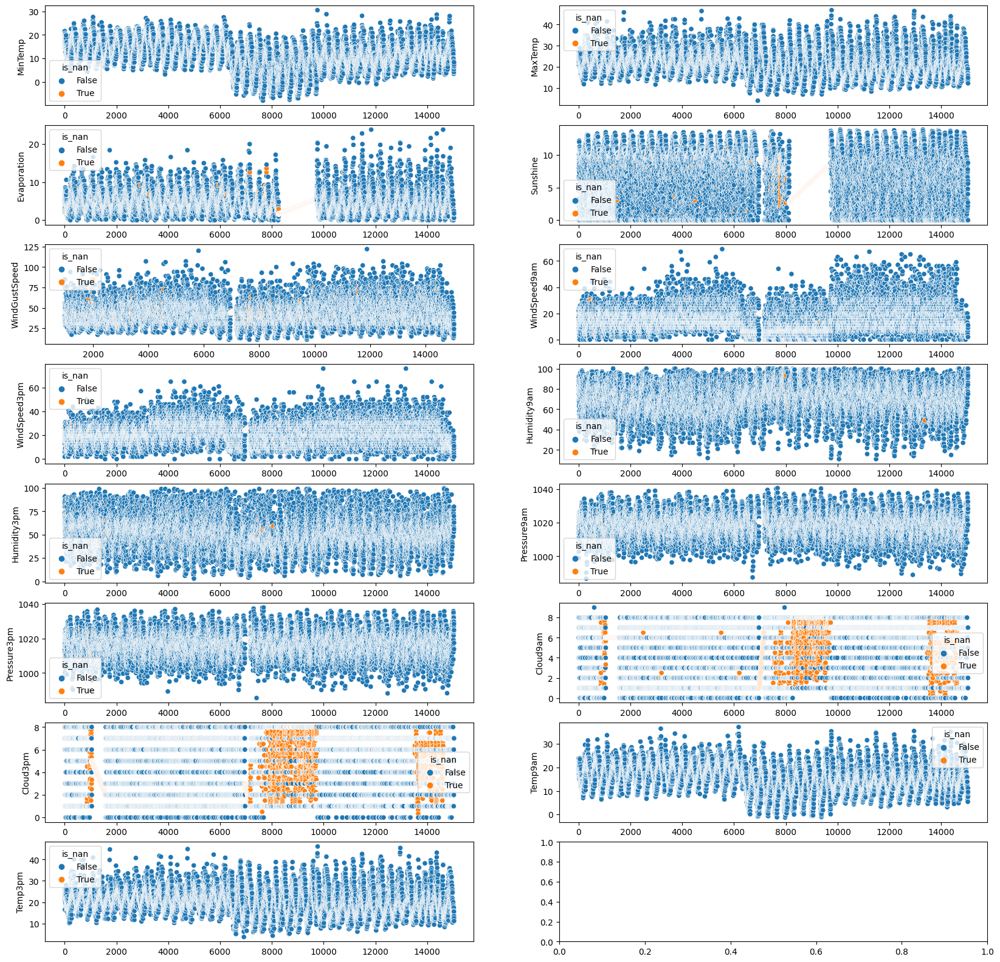

In [72]:
cols = ['MinTemp','MaxTemp','Evaporation', 'Sunshine',
       'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am',
       'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm',
       'Temp9am', 'Temp3pm' ]

plot_interpolated_scatter(cols, data, "linear", fsize=(20,20))

### Interpolar utilizando method='nearest'
<p> Al intentar interpolar el resto de las variables utilizando nearest vemos que el resultado no es bueno para Evaporation y Sunshine por la gran cantidad de datos consecutivos faltantes en ambas. </p>
<p> Se nota una mejora en el caso de Cloud9am y Cloud3pm el cual puede ser considerado posteriormente si no se encuentra una forma mas optima de interpolar los valores nulos de estas variables.</p>

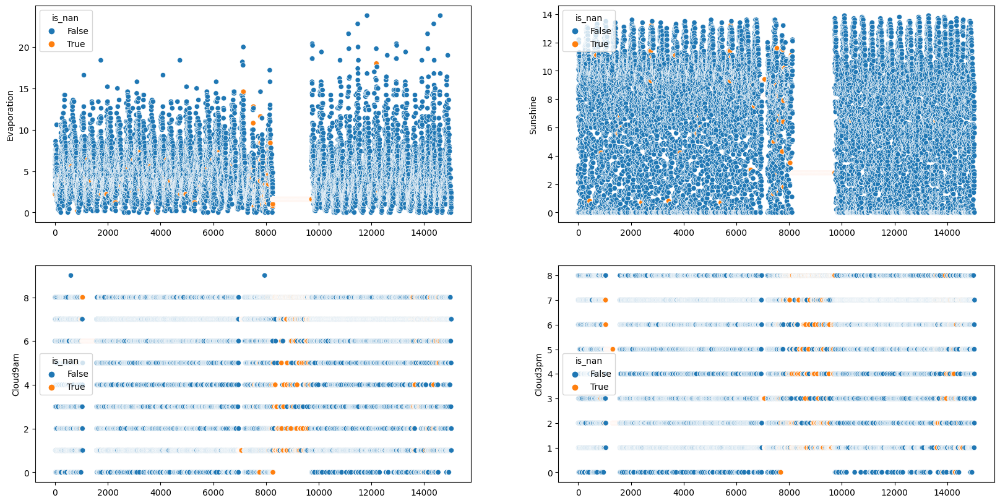

In [73]:
cols = [
    'Evaporation', 'Sunshine',
    'Cloud9am', 'Cloud3pm',
]

plot_interpolated_scatter(cols, data, "nearest", fsize=(20,10))

### Interpolar utilizando method='cubicspline'
Intentamos a continuación inteporlar utilizando distintos métodos polinómicos para intentar conseguir un mejor ajuste para la interpolacion, pero para grandes brechas entre datos los modelos polinómicos no se ajustan bien. 
<p> Por lo que interpolacion mediante metodos polinomicos es la peor opción de todas las analizadas hasta ahora, incluso intentando métodos de órden de diferente exponentes.</p>

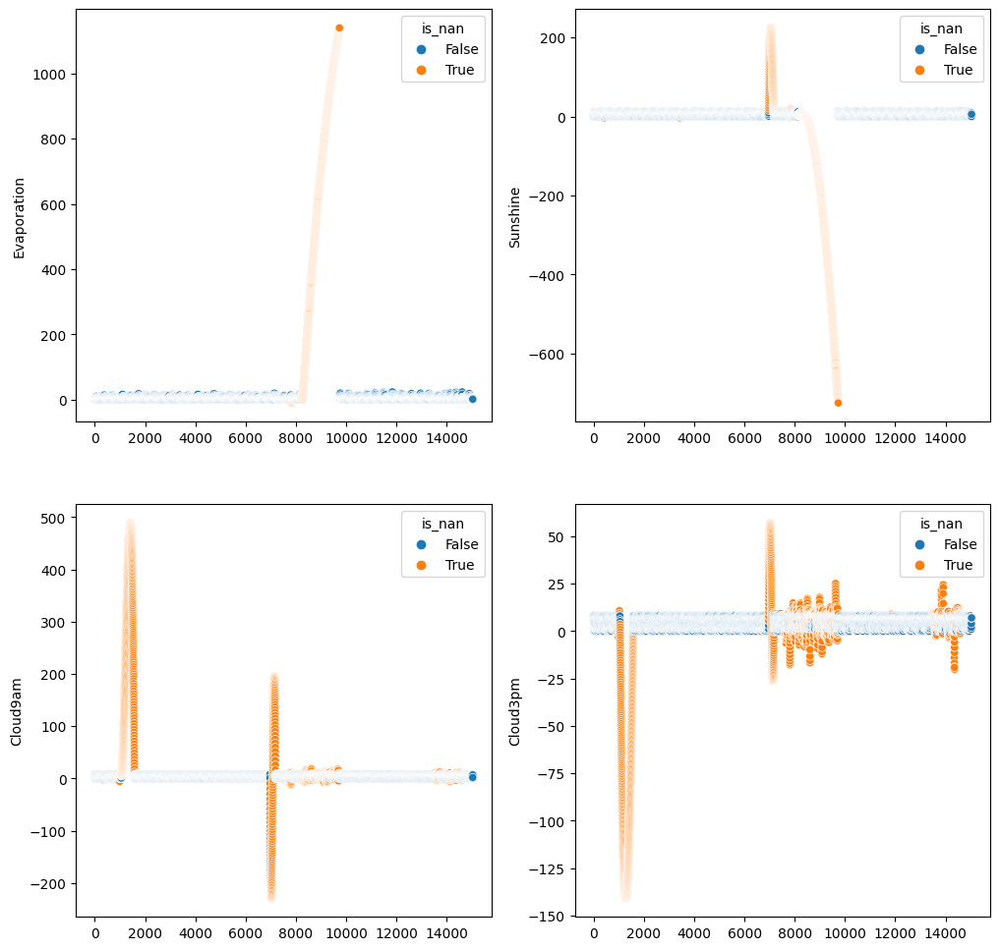

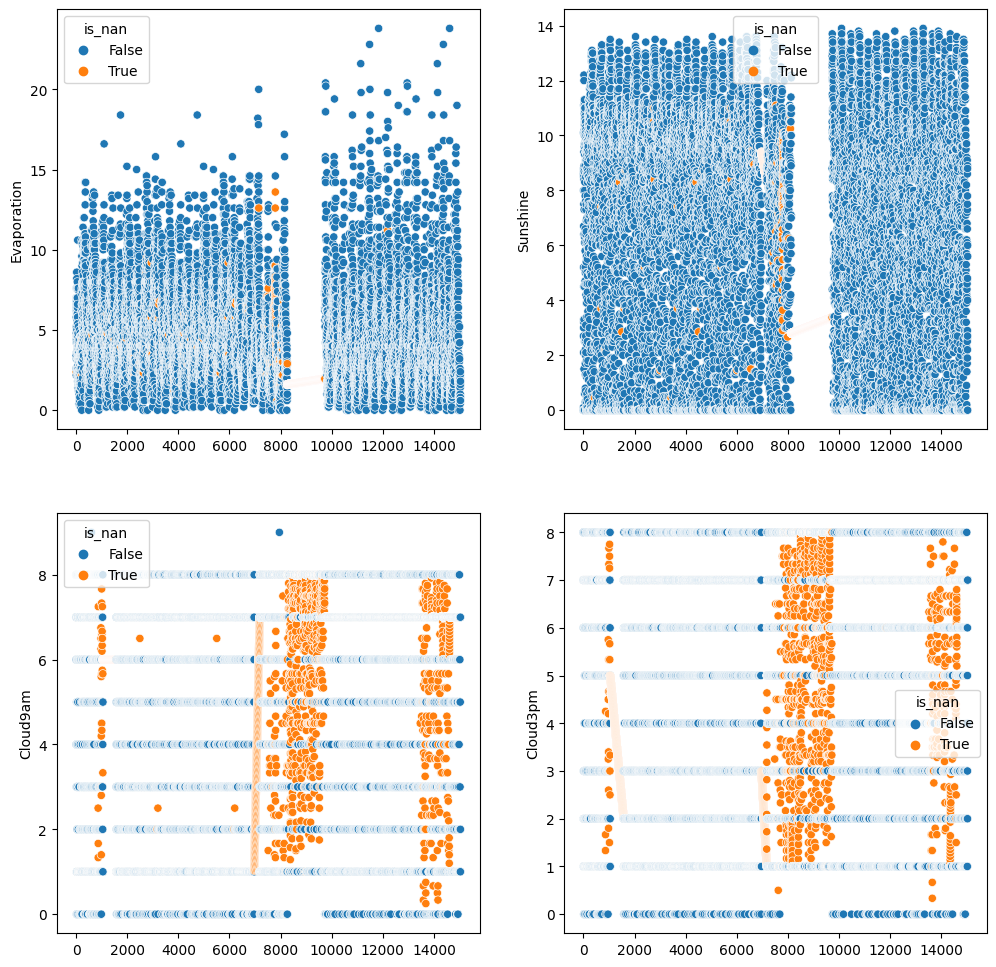

In [74]:
cols = [
    'Evaporation', 'Sunshine',
    'Cloud9am', 'Cloud3pm',
]
plot_interpolated_scatter(cols, data, method="cubicspline")
plot_interpolated_scatter(cols, data, method="polynomial", order=1)

### Conclusión de interpolaciones
Utilizaremos una interpolación lineal para las variables 'MinTemp','MaxTemp', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Temp9am' y 'Temp3pm'.

Borraremos las filas nulas para las variables 'Cloud9am' y 'Cloud3pm'.
       
Para Evaporation y Sunshine intentaremos posteriormente encontrar variables explicativas para estas para generar un modelo, e intentar predecir los valores nulos faltantes de la forma mas cercana posible.

In [75]:
linear_cols = ['MinTemp','MaxTemp', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Temp9am', 'Temp3pm']
nearest_cols = ['Cloud9am', 'Cloud3pm']

for col in linear_cols:
    data[col].interpolate(method="linear", inplace=True)
    print( f"{col} valores nulos : {data[col].isnull().sum()}")

for col in nearest_cols:
    data[col].interpolate(method="nearest", inplace=True)
    print( f"{col} valores nulos : {data[col].isnull().sum()}")


MinTemp valores nulos : 0
MaxTemp valores nulos : 0
WindSpeed9am valores nulos : 0
WindSpeed3pm valores nulos : 0
Humidity9am valores nulos : 0
Humidity3pm valores nulos : 0
Pressure9am valores nulos : 0
Pressure3pm valores nulos : 0
Temp9am valores nulos : 0
Temp3pm valores nulos : 0
Cloud9am valores nulos : 0
Cloud3pm valores nulos : 0


### Nota
Vemos que la interpolacion lineal no se completa exitosamente para "WindGustSpeed". Esto se debe a que la ultima row para esta columna está vacia, por lo que no puede crearse una relación entre el último dato registrado y la última row de esta columna.
<p>Graficamos nuevamente un heatmap para entender cómo quedó la distribución de valores nulos en el dataset después de la interpolación</p>

<Axes: >

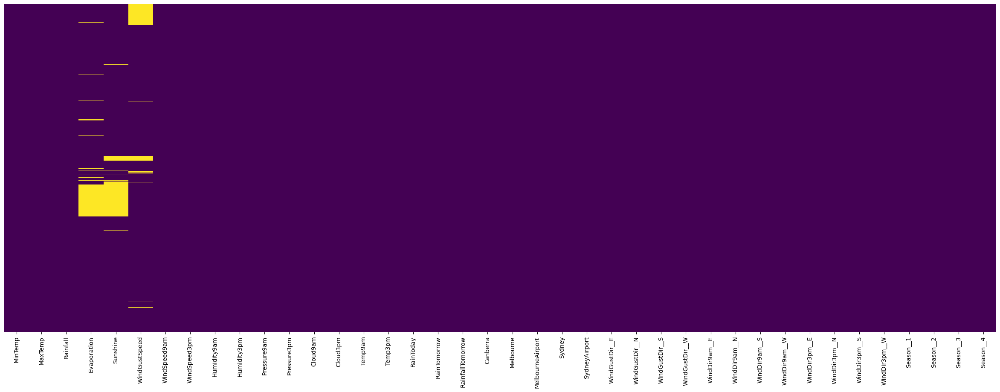

In [76]:
fig, ax = plt.subplots(figsize=(30, 10))
sbn.heatmap(data.isnull(), yticklabels=False, cmap="viridis", cbar=False,)

Normalizaremos los datos y crearemos una matriz de correlación para tratar de entender la importancia y el peso de las mismas.
Se puede asumir que todavia las variables que tienen valores nulos son variables explicativas importantes para el modelo.

Sunshine ( luminocidad ): probablemente muy relacionado a la evaporación, la temperatura, la nubosidad y la presión.
Evaporation ( Evaporacion): se asume que tiene las mismas relaciones fuertes al igual sunshine.
WindGustSpeed( Rafagas de viento ): Probablemente muy relacionada a la presión.

Graficaremos una matriz de correlación para ver si se puede crear un modelo de regresión para predecir la mayor cantidad de valores para estas variables.

## Normalizar variables numéricas
Normalizamos las variables numéricas ya que se encuentran todas en diferentes escalas

In [77]:
from sklearn.preprocessing import StandardScaler

categorical_vars = [ 'RainTomorrow', 'RainToday','Canberra', 'Melbourne', 'MelbourneAirport',
       'Sydney', 'SydneyAirport', 'WindGustDir__E', 'WindGustDir__N',
       'WindGustDir__S', 'WindGustDir__W', 'WindDir3pm__E', 'WindDir3pm__N',
       'WindDir3pm__S', 'WindDir3pm__W', 'WindDir9am__E', 'WindDir9am__N', 'WindDir9am__S', 'WindDir9am__W',
       'Month__1', 'Month__2', 'Month__3',
       'Month__4', 'Month__5', 'Month__6', 'Month__7', 'Month__8', 'Month__9',
       'Month__10', 'Month__11', 'Month__12', 'Season__1', 'Season__2',
       'Season__3', 'Season__4'
]

numerical_vars = [ col for col in data.columns if col not in categorical_vars ]

scale= StandardScaler() 
scaled_data = data.copy()

scaled_data[numerical_vars] = scale.fit_transform(data[numerical_vars])

## Matriz de correlación

<Axes: >

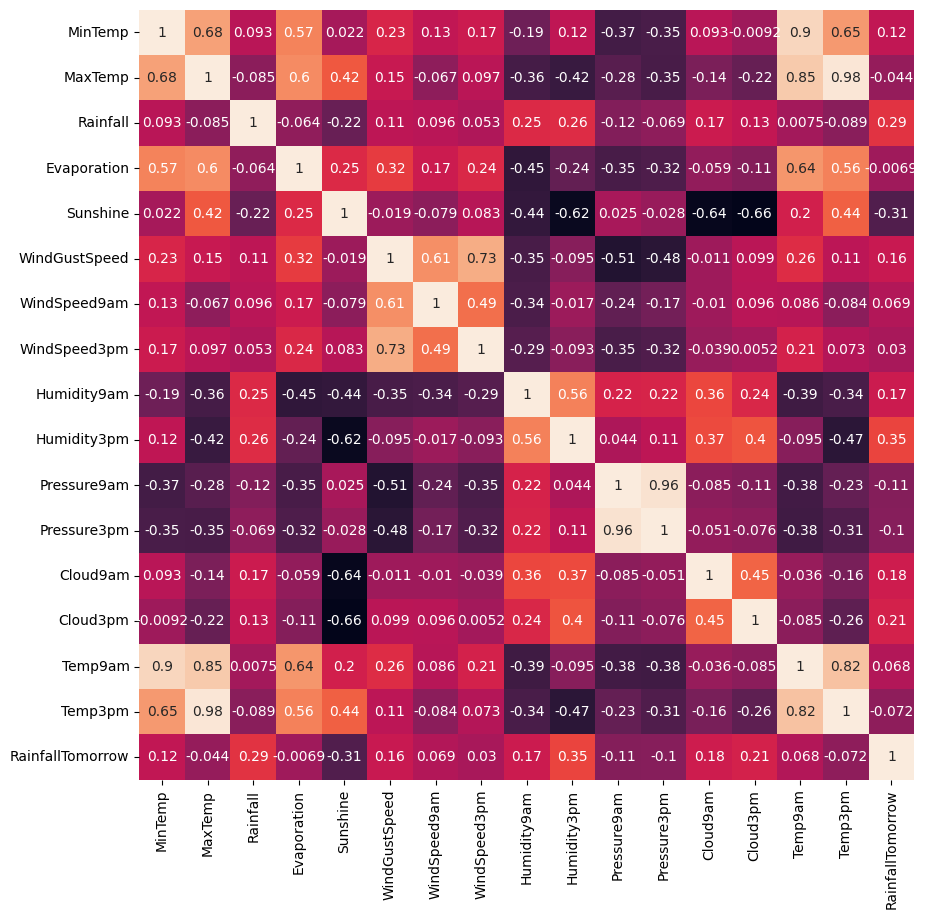

In [78]:
heatmap_data = scaled_data[numerical_vars]

plt.figure(figsize=(10, 10))
sbn.heatmap(heatmap_data.corr(numeric_only=True, method='pearson'), yticklabels=True, cbar=False, annot=True)

Concluimos que se cumple nuestra predicción anterior acerca de la correlaciones que se encuentran entre las distintas variables.
<p>Por ejemplo que Sunshine tiene una buena correlación con los dias nublados, la humedad y la temperatura.</p>
<p>Se intentera calcular los valores nulos para WindGustSpeed utilizando un modelo de regresion.</p>

<Axes: >

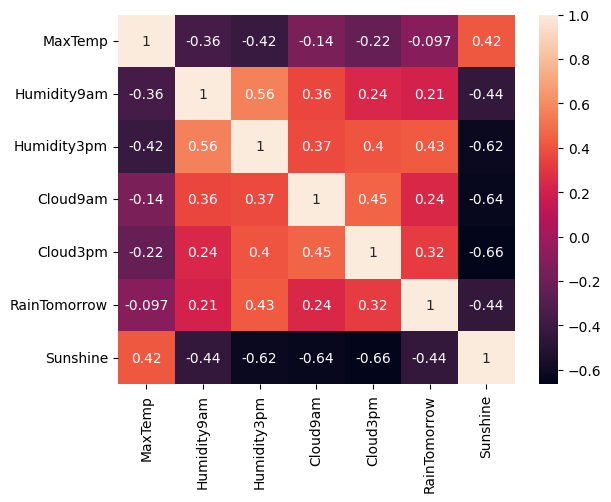

In [79]:
x_train_cols = ["MaxTemp", "Humidity9am", "Humidity3pm", "Cloud9am", "Cloud3pm","RainTomorrow"]

sunshine_data = data[ x_train_cols + ["Sunshine"] ] 
plt.figure()
sbn.heatmap(sunshine_data.corr(numeric_only=True, method='pearson'), yticklabels=True, annot=True)


Vemos que la correlación entre las variables y Sunshine siguen siendo buenas. Por lo que intentaremos predecir los valores nulos utilizando una regresión lineal.

0.6740654199993024 4.775541305751492
-0.7379403557912185 25.400850334432498


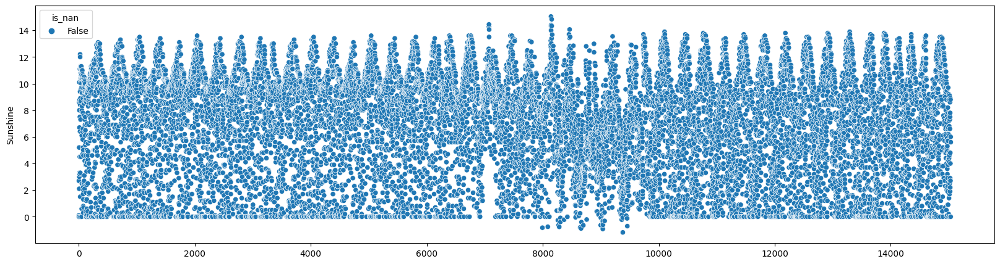

In [80]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score, mean_squared_error
from sklearn.metrics import confusion_matrix, classification_report

sunshine_data_null =  sunshine_data[sunshine_data["Sunshine"].isnull()]
sunshine_data_not_null = sunshine_data[sunshine_data["Sunshine"].notnull()] 

x_pred = sunshine_data_null[x_train_cols]
x_train, x_test, y_train, y_test = train_test_split(sunshine_data_not_null[x_train_cols], sunshine_data_not_null["Sunshine"], test_size=0.2)

lr = LinearRegression()

lr.fit(x_train,y_train)

y_pred = lr.predict(x_test)

print( 
    r2_score(y_test, y_pred),
    mean_squared_error( y_test, y_pred)
)

y_pred = lr.predict(x_pred)
y_pred_len = len(y_pred)
print( 
    r2_score(y_train[:y_pred_len], y_pred),
    mean_squared_error( y_train[:y_pred_len], y_pred)
)

x_pred["Sunshine"] = y_pred
data["Sunshine"].update(x_pred["Sunshine"])

plot_interpolated_scatter(["Sunshine"], data, method="linear",fsize=(20,5), sy=1)

### Interpolar Sunshine con regresion lineal
Como podemos ver ahora se ajustan mucho mejor los valores para esta variable. Ahora acotaremos los valores entre 0 y 12 para mejorar los datos.

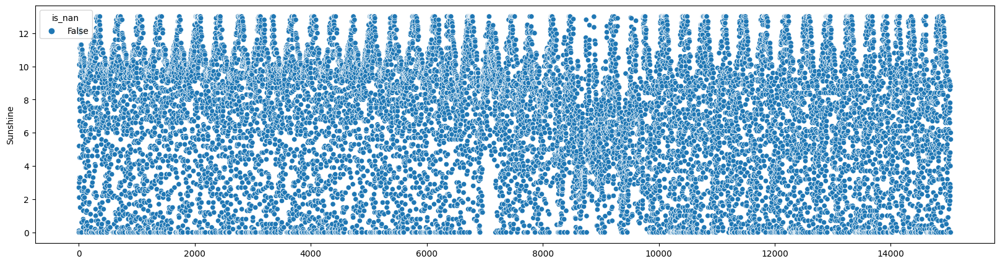

In [81]:
data["Sunshine"] = data["Sunshine"].apply(lambda value: value if value >0 else 0 )
data["Sunshine"] = data["Sunshine"].apply(lambda value: value if value <=13 else 13 )
plot_interpolated_scatter(["Sunshine"], data, method="linear",fsize=(20,5),sy=1)

### Regresión e Interpolar Evaporation
Realizamos la creacion de un modelo de regresion lineal para predecir los valores null de Evaporation

0.5959892765132128 3.8480116861322897
-0.9875429189141025 18.96945170585099


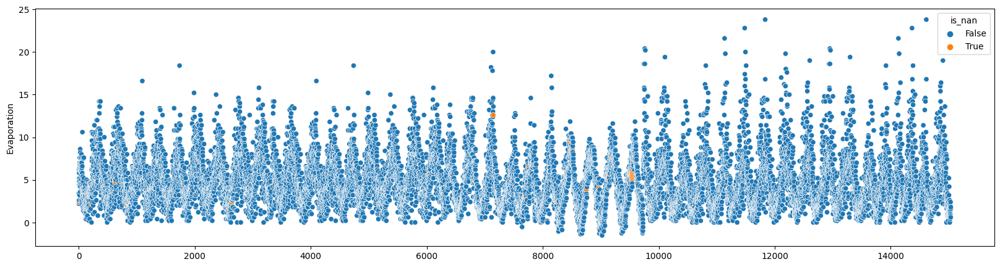

In [82]:
x_train_cols = [ c for c in data.columns if c != "Evaporation" ]

evaporation_data = data[ x_train_cols + ["Evaporation"] ] 
evaporation_data = evaporation_data[ 
    evaporation_data["WindGustSpeed"].notnull()
]

evaporation_data_null =  evaporation_data[evaporation_data["Evaporation"].isnull()]
evaporation_data_not_null = evaporation_data[evaporation_data["Evaporation"].notnull()] 

x_pred =evaporation_data_null[x_train_cols]
x_train, x_test, y_train, y_test = train_test_split(evaporation_data_not_null[x_train_cols], evaporation_data_not_null["Evaporation"], test_size=0.2)

lr = LinearRegression()

lr.fit(x_train,y_train)

y_pred = lr.predict(x_test)

print( 
    r2_score(y_test, y_pred),
    mean_squared_error( y_test, y_pred)
)

y_pred = lr.predict(x_pred)
y_pred_len = len(y_pred)
print( 
    r2_score(y_train[:y_pred_len], y_pred),
    mean_squared_error( y_train[:y_pred_len], y_pred)
)

x_pred["Evaporation"] = y_pred
data["Evaporation"].update(x_pred["Evaporation"])
plot_interpolated_scatter(["Evaporation"], data, method="linear",fsize=(20,5), sy=1)

### Interpolamos Evaporation
<p> Se probaron varias formas de generar un modelo que se ajuste lo mejor posible para predecir los valores faltantes para la evaporación.</p>
<p> Se concluye heurísticamente que la mejor aproximacion parece ser utilizando el dataset completo. </p>
<p> Quedan algunos valores nulos que no pudieron ser interpolados y agregados al dataset pero vemos que se ajustan bien aplicando una interpolación lineal con el resto de los datos.</p>
<p> Vemos en el grafico que los datos se interpolan de forma mas prolija que todas las estimaciones anteriores usando lo metodos de interpolacion estandar provisto por la libreia Pandas. </p>
<p> Para los valores menores a 0 se restarán la distancia del minimo valor, para moverlos sobre 0 y simular un comportamiento mas parecido a la realidad </p>

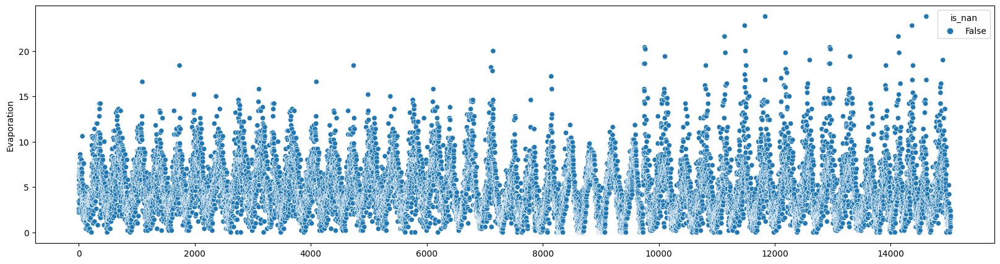

In [83]:
data["Evaporation"].interpolate(method="linear", inplace=True)
data["Evaporation"] = data["Evaporation"].apply(lambda value: 0 if value < 0 else value  )
plot_interpolated_scatter(["Evaporation"], data, method="linear",fsize=(20,5),sy=1)

# Interpolar WindGust
Se replica exactamente el mismo procedimiento que para la estimación de Evaporation y Sunshine.

0.7205241058379523 59.10477504730859
-0.7502029251557578 409.3477652416267


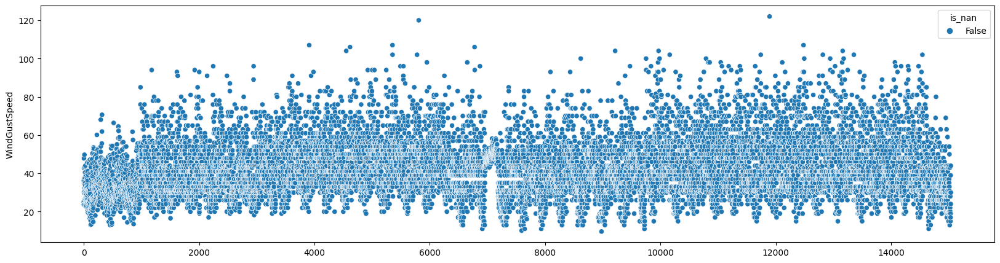

In [84]:
x_train_cols = [ c for c in data.columns if c != "WindGustSpeed" ]

windgust_data = data.copy()

windgust_data_null =  windgust_data[windgust_data["WindGustSpeed"].isnull()]
windgust_data_not_null = windgust_data[windgust_data["WindGustSpeed"].notnull()] 

x_pred = windgust_data_null[x_train_cols]
x_train, x_test, y_train, y_test = train_test_split(windgust_data_not_null[x_train_cols], windgust_data_not_null["WindGustSpeed"], test_size=0.2)

lr = LinearRegression()

lr.fit(x_train,y_train)

y_pred = lr.predict(x_test)

print( 
    r2_score(y_test, y_pred),
    mean_squared_error( y_test, y_pred)
)

y_pred = lr.predict(x_pred)
y_pred_len = len(y_pred)
print( 
    r2_score(y_train[:y_pred_len], y_pred),
    mean_squared_error( y_train[:y_pred_len], y_pred)
)

x_pred["WindGustSpeed"] = y_pred
data["WindGustSpeed"].update(x_pred["WindGustSpeed"])
plot_interpolated_scatter(["WindGustSpeed"], data, method="polynomial",fsize=(20,5), sy=1, order=1)

# Escalar nuevamente los datos del dataset para toda las variables numéricas
Volvemos a escalar con nuestros datos nulos ya completos.

In [85]:
scaled_data = data.copy()
scaled_data[numerical_vars] = scale.fit_transform(data[numerical_vars])

### Graficar la matriz de correlación final escalada sin valores nulos

<Axes: >

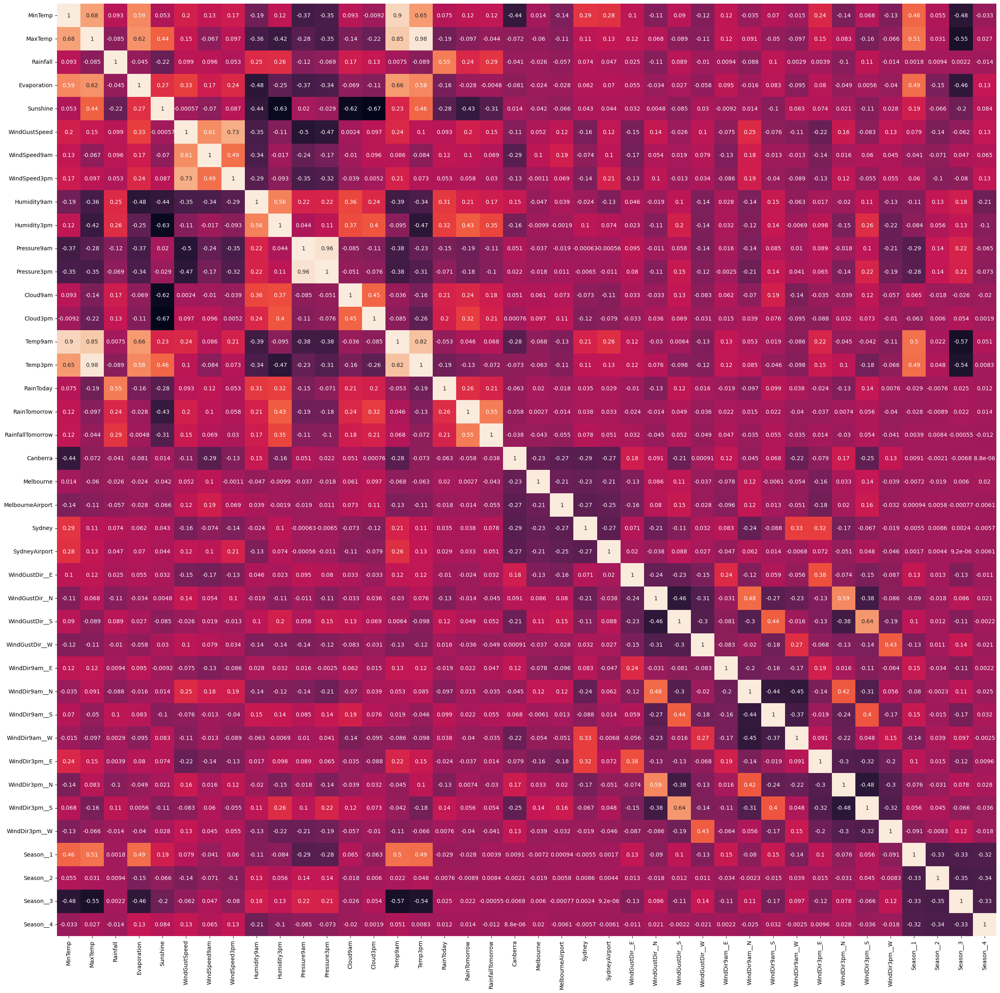

In [86]:
plt.figure(figsize=(30, 30))
sbn.heatmap(scaled_data.corr(numeric_only=True, method='pearson'), yticklabels=True, cbar=False, annot=True)

### Regresión Lineal Simple

In [87]:
x = scaled_data.copy()
y = x["RainfallTomorrow"].copy()
x.drop("RainfallTomorrow", axis=1, inplace=True)
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.3, random_state=42)

model = LinearRegression()
model.fit(x_train, y_train)
y_pred = model.predict(x_test)


r2 = r2_score( y_test, y_pred)
m_e2 = mean_squared_error( y_test, y_pred)
print (f"score R2: {round(r2, 4)}")
print (f"error MSE: {round(m_e2, 4)}") 


score R2: 0.3513
error MSE: 0.6997


# Regresión Lineal sin tratamientos de los datos
Aplicaremos una regresión lineal borrando todos los datos despues de realizar el encoding de las variables y sin interpolar ningun dato.

In [88]:
full_data_encoded.dropna(inplace=True)
full_data_encoded[numerical_vars] = scale.fit_transform(full_data_encoded[numerical_vars])

fx = full_data_encoded.copy()
fy = fx["RainfallTomorrow"].copy()
fx.drop("RainfallTomorrow", axis=1, inplace=True)
fx_train, fx_test, fy_train, fy_test = train_test_split(fx, fy, test_size=0.3, random_state=42)

model = LinearRegression()
model.fit(fx_train, fy_train)
fy_pred = model.predict(fx_test)

r2 = r2_score( fy_test, fy_pred)
m_e2 = mean_squared_error( fy_test, fy_pred)
print (f"score R2: {round(r2, 4)}")
print (f"error MSE: {round(m_e2, 4)}") 

score R2: 0.4012
error MSE: 0.4243


## Conclusión Regresion Lineal
<p>Se puede ver que a pesar del esfuerzo al completar y normalizar los datos, el modelo lineal no se ajusta bien para la predicción de RainfallTomorrow con un score de 0.35. </p>
<p>Tiene mejor score y un error mas bajo al realizar un drop directamente sobre los datos nulos, por lo que seguiremos usando este set de datos en vez del interpolado.</p>

# Regularización y Regresiones Lasso, Ridge y ElasticNet 

In [89]:
from sklearn.linear_model import LinearRegression, Ridge, Lasso, ElasticNet, RidgeCV, ElasticNetCV, LassoCV

lr = LinearRegression()
lr.fit(fx, fy)

print("Coeficientes del modelo de regresión lineal:")
#print(lr.coef_)
print(lr.score(fx,fy))

for alpha, ratio in [(0.9,0.2), (0.6,0.5), (0.3,0.5), (0.2,0.5), (0.1,0.3),
                     (0.01,0.9), (0.001,0.7), (0.0001,0.2), (0.00001,0.5), (0.000001,0.9)]:
    lasso = Lasso(alpha=0.1)
    ridge = Ridge(alpha=0.1) 
    elasticnet = ElasticNet(alpha=alpha, l1_ratio=ratio)

    lasso.fit(fx, fy)
    ridge.fit(fx, fy)
    elasticnet.fit(fx,fy)


    print(f"\nAlpha: {alpha} Ratio {ratio}")
    #print(lasso.coef_)
    print(f"Lasso Coef: {round(lasso.score(fx,fy), 4)}")

    #print(ridge.coef_)
    print(f"Ridge Coef: {round(ridge.score(fx,fy), 4)}")

    #print(elasticnet.coef_)
    print(f"ElasticNet : {round(elasticnet.score(fx,fy), 4)}")

Coeficientes del modelo de regresión lineal:
0.3461322188219069

Alpha: 0.9 Ratio 0.2
Lasso Coef: 0.2633
Ridge Coef: 0.3461
ElasticNet : 0.0815

Alpha: 0.6 Ratio 0.5
Lasso Coef: 0.2633
Ridge Coef: 0.3461
ElasticNet : 0.0163

Alpha: 0.3 Ratio 0.5
Lasso Coef: 0.2633
Ridge Coef: 0.3461
ElasticNet : 0.149

Alpha: 0.2 Ratio 0.5
Lasso Coef: 0.2633
Ridge Coef: 0.3461
ElasticNet : 0.2211

Alpha: 0.1 Ratio 0.3
Lasso Coef: 0.2633
Ridge Coef: 0.3461
ElasticNet : 0.2973

Alpha: 0.01 Ratio 0.9
Lasso Coef: 0.2633
Ridge Coef: 0.3461
ElasticNet : 0.3383

Alpha: 0.001 Ratio 0.7
Lasso Coef: 0.2633
Ridge Coef: 0.3461
ElasticNet : 0.3459


/home/simon/.local/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.440e+00, tolerance: 1.067e+00
  model = cd_fast.enet_coordinate_descent(



Alpha: 0.0001 Ratio 0.2
Lasso Coef: 0.2633
Ridge Coef: 0.3461
ElasticNet : 0.3461

Alpha: 1e-05 Ratio 0.5
Lasso Coef: 0.2633
Ridge Coef: 0.3461
ElasticNet : 0.3461

Alpha: 1e-06 Ratio 0.9
Lasso Coef: 0.2633
Ridge Coef: 0.3461
ElasticNet : 0.3461


/home/simon/.local/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.036e+03, tolerance: 1.067e+00
  model = cd_fast.enet_coordinate_descent(


# Regularizacion y Regresiones Lasso, Ridge y ElasticNet Cross Validation 

In [90]:
lassoCV = LassoCV() 
ridgeCV = RidgeCV() 
elasticnetCV = ElasticNetCV()

lassoCV.fit(fx, fy)
ridgeCV.fit(fx, fy)
elasticnetCV.fit(fx,fy)

print("lasso alpha:",lassoCV.alpha_)
print("ridge alpha:",ridgeCV.alpha_)
print("elastic net alpha:",elasticnetCV.alpha_ )

# Mostrar coeficientes
print("\nCoeficientes del modelo Lasso:")
#print(lassoCV.coef_)
print(round(lassoCV.score(fx,fy), 4))

print("\nCoeficientes del modelo Ridge:")
#print(ridgeCV.coef_)
print(round(ridgeCV.score(fx,fy), 4))


print("\nCoeficientes del modelo ElasticNet:")
#print(elasticnetCV.coef_)
print(round(elasticnetCV.score(fx,fy), 4))

lasso alpha: 0.0011696690144337191
ridge alpha: 10.0
elastic net alpha: 0.0007144000326480332

Coeficientes del modelo Lasso:
0.3456

Coeficientes del modelo Ridge:
0.3461

Coeficientes del modelo ElasticNet:
0.346


## Analizar variables para clasificación
El propósito es ver qué variables nos permiten diferenciar correctamente si llueve o no.
Dado que ya realizamos un análisis previo de las variables para la regresión lineal no hay mucho análisis para agregar ya que la variable RainfallTomorrow explica la columna RainTomorrow

In [91]:
dfclas = data.copy()

<Figure size 640x480 with 0 Axes>

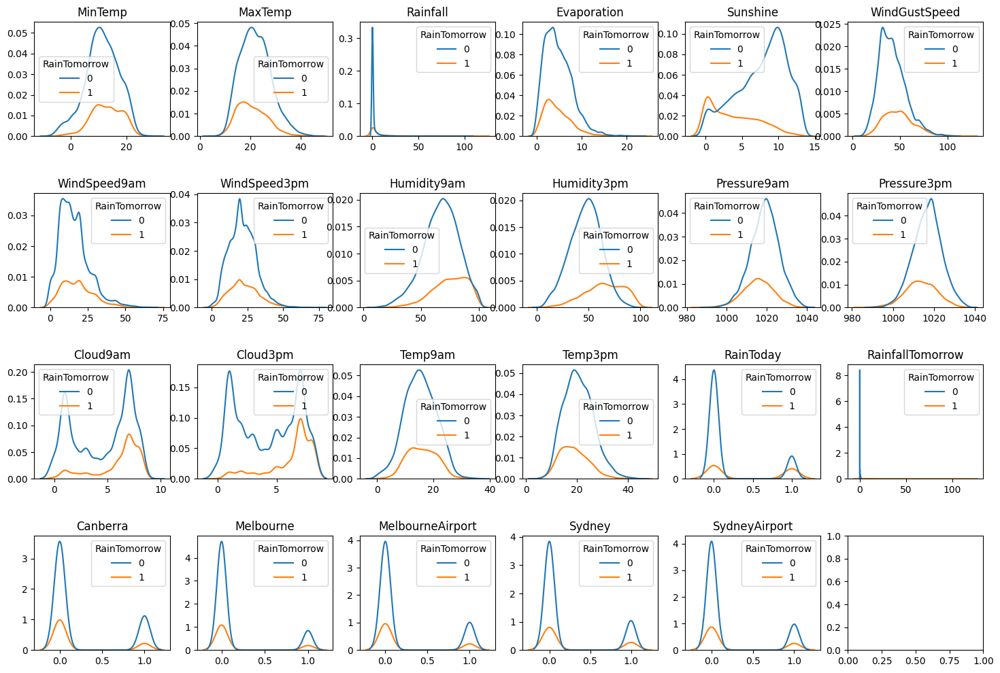

In [92]:
cols = ['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine',
       'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am',
       'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm',
       'Temp9am', 'Temp3pm', 'RainToday', 'RainfallTomorrow',
       'Canberra', 'Melbourne', 'MelbourneAirport', 'Sydney', 'SydneyAirport']
filas = 4
columnas = 6
plt.figure()
fig, axs = plt.subplots(filas, columnas, figsize=(18, 12))
fig.subplots_adjust(hspace=0.5)
for i, columna in enumerate(cols):
    f = i // columnas
    c = i % columnas
    sbn.kdeplot(dfclas, x=columna, hue="RainTomorrow", ax=axs[f, c])
    axs[f, c].set_title(columna)
    axs[f, c].set_xlabel('')
    axs[f, c].set_ylabel('')
plt.show()

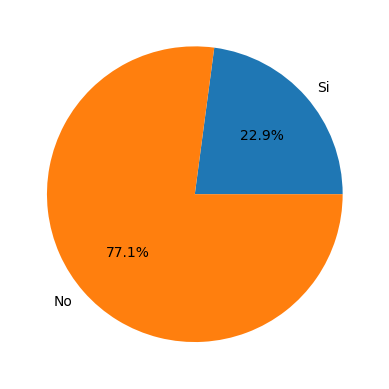

In [93]:
tot_no = data["RainTomorrow"].value_counts()[0]
tot_si = data["RainTomorrow"].value_counts()[1]
porcentaje_si = round(tot_si / (tot_no + tot_si) * 100, 2)
porcentaje_no = round(tot_no / (tot_no + tot_si) * 100, 2)
data_cantidad = pd.DataFrame(columns=["RainTomorrow", "%"], index=["Si", "No", "Total"], data=[
    [tot_si, porcentaje_si],
    [tot_no, porcentaje_no],
    [tot_si + tot_no, porcentaje_si + porcentaje_no]
])

plt.figure()
plt.pie([tot_si, tot_no], labels=["Si", "No"], autopct='%1.1f%%')
plt.show()

In [94]:
data_cantidad

,RainTomorrow,%
Si,3443,22.9
No,11593,77.1
Total,15036,100.0


Podemos ver que hay una desproporción en la cantidad de casos de lluvia con los de no lluvia. Si utilizamos el dataset como actualmente está obtendremos un modelo sesgado que tendrá preferencia por los dias de no lluvia. Para esto podemos utilizar diferentes técnicas para mantener el dataset proporcionado:
* Pesos de clase: A la clase LogisticRegression podemos setear el parámetro class_weight a "balanced" para dar más peso a los registros de lluvia
* Submuestreo: Eliminar registros de no lluvia hasta equiparar los de lluvia.
* Sobremuestreo: Generar información sintética para aumetar los registros de lluvia.

## Pesos de clase

In [95]:
logmodel = LogisticRegression(class_weight="balanced", random_state=42, max_iter=1000)

In [96]:
dflogx = full_data_encoded.copy()
dflogy = dflogx["RainTomorrow"].copy()
dflogx.drop("RainTomorrow", axis=1, inplace=True)
X_train, X_test, y_train, y_test = train_test_split(dflogx, dflogy, test_size=0.3, random_state=42)
logmodel.fit(X_train, y_train)

LogisticRegression(class_weight='balanced', max_iter=1000, random_state=42)

In [97]:
y_predict = logmodel.predict(X_test)
conf_matrix = pd.DataFrame(confusion_matrix(y_test, y_predict), columns=["Negativo Predicho", "Positivo Predicho"], index=["Real Negativo", "Real Positivo"])
print(confusion_matrix(y_test, y_predict))
print(classification_report(y_test, y_predict))

[[2410   22]
 [   9  760]]
              precision    recall  f1-score   support

           0       1.00      0.99      0.99      2432
           1       0.97      0.99      0.98       769

    accuracy                           0.99      3201
   macro avg       0.98      0.99      0.99      3201
weighted avg       0.99      0.99      0.99      3201



In [98]:
conf_matrix

,Negativo Predicho,Positivo Predicho
Real Negativo,2410,22
Real Positivo,9,760


## Submuestreo
Para el submuestreo vamos a crear una función que elimine aleatoriamente registros de una clase para así poder equilibrar el dataframe

In [99]:
def submuestreo(df: pd.DataFrame, columna: str):
    clases = df[columna].unique()
    clases_count = df[columna].value_counts()
    #Encontrar clase con menor frecuencia
    clase_menor = clases_count.idxmin()
    #Iterar y seleccionar aleatoriamente un nro igual de muestras de cada clase
    clase_menor_count = clases_count[clase_menor]
    data_generada = pd.DataFrame(columns=df.columns)
    dataframes = []
    for clase_target in clases:
        clase_data = df[df[columna] == clase_target]
        if clase_target != clase_menor:
            dataframes.append(clase_data.sample(clase_menor_count, replace=False))
        else:
            dataframes.append(clase_data)
    data_generada = pd.concat(dataframes)
    return data_generada

In [100]:
full_data_encoded["RainTomorrow"].value_counts()

RainTomorrow
0    8176
1    2494
Name: count, dtype: int64

([<matplotlib.patches.Wedge at 0x7fbd6c13cf10>,
 [Text(6.735557395310444e-17, 1.1, 'Si'),
  Text(-2.0206672185931328e-16, -1.1, 'No')],
 [Text(3.6739403974420595e-17, 0.6, '50.0%'),
  Text(-1.1021821192326178e-16, -0.6, '50.0%')])

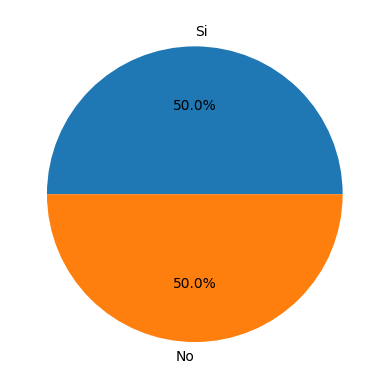

In [101]:
dfsub = submuestreo(full_data_encoded, "RainTomorrow")
plt.pie(dfsub["RainTomorrow"].value_counts(), labels=["Si", "No"], autopct='%1.1f%%')

In [102]:
logmodel = LogisticRegression(random_state=42)
dflogx = dfsub.copy()
dflogy = dflogx["RainTomorrow"].copy()
dflogx.drop("RainTomorrow", axis=1, inplace=True)
X_train, X_test, y_train, y_test = train_test_split(dflogx, dflogy, test_size=0.3, random_state=42)
logmodel.fit(X_train, y_train)

/home/simon/.local/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


LogisticRegression(random_state=42)

In [103]:
y_predict = logmodel.predict(X_test)
conf_matrix = pd.DataFrame(confusion_matrix(y_test, y_predict), columns=["Negativo Predicho", "Positivo Predicho"], index=["Real Negativo", "Real Positivo"])
print(confusion_matrix(y_test, y_predict))
print(classification_report(y_test, y_predict))

[[764   3]
 [ 17 713]]
              precision    recall  f1-score   support

           0       0.98      1.00      0.99       767
           1       1.00      0.98      0.99       730

    accuracy                           0.99      1497
   macro avg       0.99      0.99      0.99      1497
weighted avg       0.99      0.99      0.99      1497



In [104]:
conf_matrix

,Negativo Predicho,Positivo Predicho
Real Negativo,764,3
Real Positivo,17,713


## SMOTE
Esta librería realiza los siguientes pasos para equilibrar el dataset
1. Para cada fila de la clase minoritaria, se identifican sus k vecinos más cercanos
2. Se selecciona aleatoriamente uno de los vecinos cercanos y se lo etiqueta como *Vecino Cercano*
3. Se elige un valor aleatorio entre 0 y 1, luego multiplica la diferencia entre la instancia actual y el *Vecino Cercano* por el valor aleatorio. Este resultado se suma a la instancia actual para crear una nueva con diferentes datos

In [105]:
dfsx = dfsub.copy()
dfsy = dfsx["RainTomorrow"].copy()
dfsx.drop("RainTomorrow", axis=1, inplace=True)
smote = SMOTE(random_state=42)
xsmote, ysmote = smote.fit_resample(dfsx, dfsy)
X_train, X_test, y_train, y_test = train_test_split(xsmote, ysmote, test_size=0.3, random_state=42)

In [106]:
logmodel = LogisticRegression(random_state=42, max_iter=1000)
logmodel.fit(X_train, y_train)
logpredict = logmodel.predict(X_test)

In [107]:
print(confusion_matrix(y_test, logpredict))
print(classification_report(y_test, logpredict))

[[764   3]
 [ 17 713]]
              precision    recall  f1-score   support

           0       0.98      1.00      0.99       767
           1       1.00      0.98      0.99       730

    accuracy                           0.99      1497
   macro avg       0.99      0.99      0.99      1497
weighted avg       0.99      0.99      0.99      1497



In [108]:
confusion_matrix_smote = pd.DataFrame(confusion_matrix(y_test, logpredict), columns=["Negativo Predicho", "Positivo Predicho"], index=["Real Negativo", "Real Positivo"])
confusion_matrix_smote

,Negativo Predicho,Positivo Predicho
Real Negativo,764,3
Real Positivo,17,713


## Conclusión
Vemos que cualquiera de los tres métodos son útiles ya que en todos obtenemos *precision*, *recall* y *f1-score* de 0.99 y 0.98. Además, en todas las matrices de confusión podemos ver que hay muchos Negativos Positivos y Reales Positivos

## Redes neuronales con Tensorflow

In [109]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten, Input, Dropout
from tensorflow.keras.models import clone_model
import os
import optuna
tf.config.run_functions_eagerly(True)
tf.data.experimental.enable_debug_mode()

#### Crear modelo para clasificación (Llueve / No llueve)

In [110]:
def objetivo_clas(trial: optuna.trial.Trial):
    num_capas = trial.suggest_int("num_layers", 1, 4)
    model = Sequential()
    for i in range(num_capas):
        num_conexiones = trial.suggest_int(f"n_units_layer_{i}", 4, 200)
        model.add(Dense(num_conexiones, activation="relu"))
    model.add(Dense(1, activation="sigmoid"))
    model.compile(optimizer="adam", loss="binary_crossentropy", metrics=["accuracy"])
    model.fit(X_train, y_train, validation_data=(X_test, y_test), epochs=10, batch_size=32)
    score = model.evaluate(X_test, y_test, verbose=0)
    return score[1]

Se define una función objetivo para poder encontrar los mejores hiperparámetros para el modelo. Luego, se utiliza *optuna* para maximizar la función

In [111]:
estudio = optuna.create_study(direction="maximize")
estudio.optimize(objetivo_clas, n_trials=50)

[I 2023-11-21 21:34:44,279] A new study created in memory with name: no-name-04dd72ca-30e6-41bc-94a6-2bddab336974


Epoch 1/10
110/110 [==============================] - 2s 17ms/step - loss: 0.4714 - accuracy: 0.7622 - val_loss: 0.3628 - val_accuracy: 0.8457
Epoch 2/10
110/110 [==============================] - 2s 17ms/step - loss: 0.2904 - accuracy: 0.8765 - val_loss: 0.2424 - val_accuracy: 0.9025
Epoch 3/10
110/110 [==============================] - 2s 17ms/step - loss: 0.1899 - accuracy: 0.9270 - val_loss: 0.1694 - val_accuracy: 0.9332
Epoch 4/10
110/110 [==============================] - 2s 17ms/step - loss: 0.1194 - accuracy: 0.9567 - val_loss: 0.1085 - val_accuracy: 0.9626
Epoch 5/10
110/110 [==============================] - 2s 17ms/step - loss: 0.0746 - accuracy: 0.9811 - val_loss: 0.0730 - val_accuracy: 0.9793
Epoch 6/10
110/110 [==============================] - 2s 17ms/step - loss: 0.0611 - accuracy: 0.9814 - val_loss: 0.0588 - val_accuracy: 0.9820
Epoch 7/10
110/110 [==============================] - 2s 17ms/step - loss: 0.0370 - accuracy: 0.9908 - val_loss: 0.0475 - val_accuracy: 0.9786

[I 2023-11-21 21:35:03,158] Trial 0 finished with value: 0.9846359491348267 and parameters: {'num_layers': 2, 'n_units_layer_0': 89, 'n_units_layer_1': 51}. Best is trial 0 with value: 0.9846359491348267.


Epoch 1/10
110/110 [==============================] - 2s 17ms/step - loss: 0.4843 - accuracy: 0.7665 - val_loss: 0.3965 - val_accuracy: 0.8283
Epoch 2/10
110/110 [==============================] - 2s 16ms/step - loss: 0.3289 - accuracy: 0.8510 - val_loss: 0.2914 - val_accuracy: 0.8798
Epoch 3/10
110/110 [==============================] - 2s 17ms/step - loss: 0.2394 - accuracy: 0.9063 - val_loss: 0.2296 - val_accuracy: 0.9078
Epoch 4/10
110/110 [==============================] - 2s 17ms/step - loss: 0.1718 - accuracy: 0.9338 - val_loss: 0.1685 - val_accuracy: 0.9332
Epoch 5/10
110/110 [==============================] - 2s 17ms/step - loss: 0.1221 - accuracy: 0.9556 - val_loss: 0.1267 - val_accuracy: 0.9552
Epoch 6/10
110/110 [==============================] - 2s 17ms/step - loss: 0.0900 - accuracy: 0.9688 - val_loss: 0.0959 - val_accuracy: 0.9593
Epoch 7/10
110/110 [==============================] - 2s 17ms/step - loss: 0.0656 - accuracy: 0.9782 - val_loss: 0.0737 - val_accuracy: 0.9699

[I 2023-11-21 21:35:21,829] Trial 1 finished with value: 0.9772878885269165 and parameters: {'num_layers': 2, 'n_units_layer_0': 18, 'n_units_layer_1': 170}. Best is trial 0 with value: 0.9846359491348267.


Epoch 1/10
110/110 [==============================] - 2s 22ms/step - loss: 0.4294 - accuracy: 0.8029 - val_loss: 0.2886 - val_accuracy: 0.8798
Epoch 2/10
110/110 [==============================] - 2s 22ms/step - loss: 0.2264 - accuracy: 0.9092 - val_loss: 0.1660 - val_accuracy: 0.9299
Epoch 3/10
110/110 [==============================] - 2s 22ms/step - loss: 0.1308 - accuracy: 0.9504 - val_loss: 0.1217 - val_accuracy: 0.9519
Epoch 4/10
110/110 [==============================] - 2s 22ms/step - loss: 0.0927 - accuracy: 0.9662 - val_loss: 0.0872 - val_accuracy: 0.9706
Epoch 5/10
110/110 [==============================] - 2s 22ms/step - loss: 0.0465 - accuracy: 0.9825 - val_loss: 0.0906 - val_accuracy: 0.9639
Epoch 6/10
110/110 [==============================] - 2s 22ms/step - loss: 0.0428 - accuracy: 0.9854 - val_loss: 0.0944 - val_accuracy: 0.9699
Epoch 7/10
110/110 [==============================] - 2s 22ms/step - loss: 0.0452 - accuracy: 0.9799 - val_loss: 0.1028 - val_accuracy: 0.9626

[I 2023-11-21 21:35:46,531] Trial 2 finished with value: 0.9692718982696533 and parameters: {'num_layers': 4, 'n_units_layer_0': 39, 'n_units_layer_1': 191, 'n_units_layer_2': 106, 'n_units_layer_3': 66}. Best is trial 0 with value: 0.9846359491348267.


Epoch 1/10
110/110 [==============================] - 3s 23ms/step - loss: 0.3483 - accuracy: 0.8384 - val_loss: 0.1774 - val_accuracy: 0.9305
Epoch 2/10
110/110 [==============================] - 2s 22ms/step - loss: 0.1507 - accuracy: 0.9398 - val_loss: 0.0880 - val_accuracy: 0.9713
Epoch 3/10
110/110 [==============================] - 2s 22ms/step - loss: 0.0604 - accuracy: 0.9759 - val_loss: 0.0986 - val_accuracy: 0.9646
Epoch 4/10
110/110 [==============================] - 2s 22ms/step - loss: 0.0463 - accuracy: 0.9811 - val_loss: 0.0613 - val_accuracy: 0.9766
Epoch 5/10
110/110 [==============================] - 2s 22ms/step - loss: 0.0434 - accuracy: 0.9820 - val_loss: 0.0716 - val_accuracy: 0.9733
Epoch 6/10
110/110 [==============================] - 2s 22ms/step - loss: 0.0349 - accuracy: 0.9877 - val_loss: 0.0368 - val_accuracy: 0.9840
Epoch 7/10
110/110 [==============================] - 2s 23ms/step - loss: 0.0106 - accuracy: 0.9954 - val_loss: 0.0575 - val_accuracy: 0.9786

[I 2023-11-21 21:36:11,607] Trial 3 finished with value: 0.9853039383888245 and parameters: {'num_layers': 4, 'n_units_layer_0': 182, 'n_units_layer_1': 130, 'n_units_layer_2': 94, 'n_units_layer_3': 54}. Best is trial 3 with value: 0.9853039383888245.


Epoch 1/10
110/110 [==============================] - 2s 14ms/step - loss: 0.4328 - accuracy: 0.8003 - val_loss: 0.3593 - val_accuracy: 0.8424
Epoch 2/10
110/110 [==============================] - 1s 14ms/step - loss: 0.3134 - accuracy: 0.8697 - val_loss: 0.2837 - val_accuracy: 0.8884
Epoch 3/10
110/110 [==============================] - 2s 14ms/step - loss: 0.2413 - accuracy: 0.9112 - val_loss: 0.2219 - val_accuracy: 0.9185
Epoch 4/10
110/110 [==============================] - 2s 14ms/step - loss: 0.1844 - accuracy: 0.9378 - val_loss: 0.1739 - val_accuracy: 0.9399
Epoch 5/10
110/110 [==============================] - 2s 14ms/step - loss: 0.1437 - accuracy: 0.9522 - val_loss: 0.1360 - val_accuracy: 0.9526
Epoch 6/10
110/110 [==============================] - 2s 14ms/step - loss: 0.1149 - accuracy: 0.9636 - val_loss: 0.1097 - val_accuracy: 0.9679
Epoch 7/10
110/110 [==============================] - 2s 14ms/step - loss: 0.0902 - accuracy: 0.9771 - val_loss: 0.0891 - val_accuracy: 0.9746

[I 2023-11-21 21:36:27,151] Trial 4 finished with value: 0.9906479716300964 and parameters: {'num_layers': 1, 'n_units_layer_0': 188}. Best is trial 4 with value: 0.9906479716300964.


Epoch 1/10
110/110 [==============================] - 2s 14ms/step - loss: 0.5257 - accuracy: 0.7241 - val_loss: 0.4179 - val_accuracy: 0.8277
Epoch 2/10
110/110 [==============================] - 1s 13ms/step - loss: 0.3801 - accuracy: 0.8298 - val_loss: 0.3483 - val_accuracy: 0.8584
Epoch 3/10
110/110 [==============================] - 1s 14ms/step - loss: 0.3161 - accuracy: 0.8694 - val_loss: 0.2963 - val_accuracy: 0.8824
Epoch 4/10
110/110 [==============================] - 1s 13ms/step - loss: 0.2671 - accuracy: 0.8989 - val_loss: 0.2554 - val_accuracy: 0.9078
Epoch 5/10
110/110 [==============================] - 1s 13ms/step - loss: 0.2273 - accuracy: 0.9198 - val_loss: 0.2218 - val_accuracy: 0.9138
Epoch 6/10
110/110 [==============================] - 1s 13ms/step - loss: 0.1933 - accuracy: 0.9358 - val_loss: 0.1918 - val_accuracy: 0.9359
Epoch 7/10
110/110 [==============================] - 1s 13ms/step - loss: 0.1669 - accuracy: 0.9450 - val_loss: 0.1641 - val_accuracy: 0.9466

[I 2023-11-21 21:36:42,430] Trial 5 finished with value: 0.9726119041442871 and parameters: {'num_layers': 1, 'n_units_layer_0': 61}. Best is trial 4 with value: 0.9906479716300964.


Epoch 1/10
110/110 [==============================] - 3s 23ms/step - loss: 0.3670 - accuracy: 0.8442 - val_loss: 0.2108 - val_accuracy: 0.9071
Epoch 2/10
110/110 [==============================] - 2s 22ms/step - loss: 0.1315 - accuracy: 0.9467 - val_loss: 0.0892 - val_accuracy: 0.9686
Epoch 3/10
110/110 [==============================] - 2s 22ms/step - loss: 0.0695 - accuracy: 0.9722 - val_loss: 0.0721 - val_accuracy: 0.9713
Epoch 4/10
110/110 [==============================] - 2s 22ms/step - loss: 0.0347 - accuracy: 0.9865 - val_loss: 0.0453 - val_accuracy: 0.9826
Epoch 5/10
110/110 [==============================] - 2s 22ms/step - loss: 0.0389 - accuracy: 0.9831 - val_loss: 0.0419 - val_accuracy: 0.9826
Epoch 6/10
110/110 [==============================] - 3s 23ms/step - loss: 0.0230 - accuracy: 0.9928 - val_loss: 0.0902 - val_accuracy: 0.9659
Epoch 7/10
110/110 [==============================] - 3s 23ms/step - loss: 0.0595 - accuracy: 0.9805 - val_loss: 0.0482 - val_accuracy: 0.9806

[I 2023-11-21 21:37:07,479] Trial 6 finished with value: 0.9879759550094604 and parameters: {'num_layers': 4, 'n_units_layer_0': 186, 'n_units_layer_1': 161, 'n_units_layer_2': 5, 'n_units_layer_3': 109}. Best is trial 4 with value: 0.9906479716300964.


Epoch 1/10
110/110 [==============================] - 2s 20ms/step - loss: 0.3518 - accuracy: 0.8384 - val_loss: 0.2013 - val_accuracy: 0.9185
Epoch 2/10
110/110 [==============================] - 2s 20ms/step - loss: 0.1498 - accuracy: 0.9413 - val_loss: 0.1046 - val_accuracy: 0.9593
Epoch 3/10
110/110 [==============================] - 2s 20ms/step - loss: 0.0818 - accuracy: 0.9696 - val_loss: 0.0641 - val_accuracy: 0.9753
Epoch 4/10
110/110 [==============================] - 2s 20ms/step - loss: 0.0423 - accuracy: 0.9851 - val_loss: 0.0674 - val_accuracy: 0.9719
Epoch 5/10
110/110 [==============================] - 2s 20ms/step - loss: 0.0242 - accuracy: 0.9914 - val_loss: 0.0711 - val_accuracy: 0.9739
Epoch 6/10
110/110 [==============================] - 2s 20ms/step - loss: 0.0207 - accuracy: 0.9940 - val_loss: 0.0878 - val_accuracy: 0.9646
Epoch 7/10
110/110 [==============================] - 2s 20ms/step - loss: 0.0262 - accuracy: 0.9923 - val_loss: 0.0557 - val_accuracy: 0.9760

[I 2023-11-21 21:37:29,742] Trial 7 finished with value: 0.9812959432601929 and parameters: {'num_layers': 3, 'n_units_layer_0': 183, 'n_units_layer_1': 138, 'n_units_layer_2': 175}. Best is trial 4 with value: 0.9906479716300964.


Epoch 1/10
110/110 [==============================] - 3s 23ms/step - loss: 0.4338 - accuracy: 0.7926 - val_loss: 0.3241 - val_accuracy: 0.8550
Epoch 2/10
110/110 [==============================] - 2s 22ms/step - loss: 0.2509 - accuracy: 0.8954 - val_loss: 0.2290 - val_accuracy: 0.9051
Epoch 3/10
110/110 [==============================] - 2s 23ms/step - loss: 0.1670 - accuracy: 0.9324 - val_loss: 0.2054 - val_accuracy: 0.9218
Epoch 4/10
110/110 [==============================] - 3s 23ms/step - loss: 0.1148 - accuracy: 0.9545 - val_loss: 0.1486 - val_accuracy: 0.9405
Epoch 5/10
110/110 [==============================] - 2s 22ms/step - loss: 0.0715 - accuracy: 0.9728 - val_loss: 0.1046 - val_accuracy: 0.9559
Epoch 6/10
110/110 [==============================] - 3s 23ms/step - loss: 0.0466 - accuracy: 0.9837 - val_loss: 0.1145 - val_accuracy: 0.9593
Epoch 7/10
110/110 [==============================] - 3s 23ms/step - loss: 0.0407 - accuracy: 0.9840 - val_loss: 0.0816 - val_accuracy: 0.9673

[I 2023-11-21 21:37:55,010] Trial 8 finished with value: 0.9672678709030151 and parameters: {'num_layers': 4, 'n_units_layer_0': 34, 'n_units_layer_1': 93, 'n_units_layer_2': 104, 'n_units_layer_3': 173}. Best is trial 4 with value: 0.9906479716300964.


Epoch 1/10
110/110 [==============================] - 2s 14ms/step - loss: 0.4875 - accuracy: 0.7634 - val_loss: 0.3898 - val_accuracy: 0.8357
Epoch 2/10
110/110 [==============================] - 1s 13ms/step - loss: 0.3545 - accuracy: 0.8396 - val_loss: 0.3220 - val_accuracy: 0.8617
Epoch 3/10
110/110 [==============================] - 1s 13ms/step - loss: 0.2878 - accuracy: 0.8843 - val_loss: 0.2719 - val_accuracy: 0.8931
Epoch 4/10
110/110 [==============================] - 1s 13ms/step - loss: 0.2357 - accuracy: 0.9118 - val_loss: 0.2313 - val_accuracy: 0.9025
Epoch 5/10
110/110 [==============================] - 2s 14ms/step - loss: 0.1962 - accuracy: 0.9267 - val_loss: 0.1842 - val_accuracy: 0.9379
Epoch 6/10
110/110 [==============================] - 1s 13ms/step - loss: 0.1591 - accuracy: 0.9490 - val_loss: 0.1533 - val_accuracy: 0.9479
Epoch 7/10
110/110 [==============================] - 1s 13ms/step - loss: 0.1319 - accuracy: 0.9593 - val_loss: 0.1296 - val_accuracy: 0.9659

[I 2023-11-21 21:38:10,108] Trial 9 finished with value: 0.9812959432601929 and parameters: {'num_layers': 1, 'n_units_layer_0': 101}. Best is trial 4 with value: 0.9906479716300964.


Epoch 1/10
110/110 [==============================] - 2s 14ms/step - loss: 0.4704 - accuracy: 0.7797 - val_loss: 0.3784 - val_accuracy: 0.8383
Epoch 2/10
110/110 [==============================] - 1s 13ms/step - loss: 0.3359 - accuracy: 0.8582 - val_loss: 0.3091 - val_accuracy: 0.8724
Epoch 3/10
110/110 [==============================] - 1s 13ms/step - loss: 0.2675 - accuracy: 0.8940 - val_loss: 0.2467 - val_accuracy: 0.9031
Epoch 4/10
110/110 [==============================] - 1s 13ms/step - loss: 0.2141 - accuracy: 0.9227 - val_loss: 0.2029 - val_accuracy: 0.9252
Epoch 5/10
110/110 [==============================] - 1s 13ms/step - loss: 0.1708 - accuracy: 0.9393 - val_loss: 0.1681 - val_accuracy: 0.9506
Epoch 6/10
110/110 [==============================] - 1s 13ms/step - loss: 0.1396 - accuracy: 0.9588 - val_loss: 0.1365 - val_accuracy: 0.9572
Epoch 7/10
110/110 [==============================] - 1s 13ms/step - loss: 0.1137 - accuracy: 0.9653 - val_loss: 0.1155 - val_accuracy: 0.9699

[I 2023-11-21 21:38:25,099] Trial 10 finished with value: 0.9812959432601929 and parameters: {'num_layers': 1, 'n_units_layer_0': 140}. Best is trial 4 with value: 0.9906479716300964.


Epoch 1/10
110/110 [==============================] - 2s 20ms/step - loss: 0.5594 - accuracy: 0.7264 - val_loss: 0.4998 - val_accuracy: 0.8297
Epoch 2/10
110/110 [==============================] - 2s 19ms/step - loss: 0.4415 - accuracy: 0.8805 - val_loss: 0.4176 - val_accuracy: 0.9178
Epoch 3/10
110/110 [==============================] - 2s 20ms/step - loss: 0.3660 - accuracy: 0.9367 - val_loss: 0.3441 - val_accuracy: 0.9653
Epoch 4/10
110/110 [==============================] - 2s 20ms/step - loss: 0.3094 - accuracy: 0.9685 - val_loss: 0.3145 - val_accuracy: 0.9372
Epoch 5/10
110/110 [==============================] - 2s 19ms/step - loss: 0.2759 - accuracy: 0.9725 - val_loss: 0.2813 - val_accuracy: 0.9646
Epoch 6/10
110/110 [==============================] - 2s 19ms/step - loss: 0.2478 - accuracy: 0.9825 - val_loss: 0.2488 - val_accuracy: 0.9780
Epoch 7/10
110/110 [==============================] - 2s 20ms/step - loss: 0.2203 - accuracy: 0.9897 - val_loss: 0.2401 - val_accuracy: 0.9733

[I 2023-11-21 21:38:46,746] Trial 11 finished with value: 0.9859719276428223 and parameters: {'num_layers': 3, 'n_units_layer_0': 146, 'n_units_layer_1': 16, 'n_units_layer_2': 5}. Best is trial 4 with value: 0.9906479716300964.


Epoch 1/10
110/110 [==============================] - 2s 19ms/step - loss: 0.3832 - accuracy: 0.8304 - val_loss: 0.2431 - val_accuracy: 0.9011
Epoch 2/10
110/110 [==============================] - 2s 19ms/step - loss: 0.1703 - accuracy: 0.9361 - val_loss: 0.1148 - val_accuracy: 0.9599
Epoch 3/10
110/110 [==============================] - 2s 19ms/step - loss: 0.0766 - accuracy: 0.9731 - val_loss: 0.0734 - val_accuracy: 0.9786
Epoch 4/10
110/110 [==============================] - 2s 19ms/step - loss: 0.0459 - accuracy: 0.9814 - val_loss: 0.0568 - val_accuracy: 0.9773
Epoch 5/10
110/110 [==============================] - 2s 19ms/step - loss: 0.0265 - accuracy: 0.9914 - val_loss: 0.0503 - val_accuracy: 0.9793
Epoch 6/10
110/110 [==============================] - 2s 19ms/step - loss: 0.0304 - accuracy: 0.9885 - val_loss: 0.0598 - val_accuracy: 0.9713
Epoch 7/10
110/110 [==============================] - 2s 19ms/step - loss: 0.0159 - accuracy: 0.9948 - val_loss: 0.0405 - val_accuracy: 0.9833

[I 2023-11-21 21:39:08,003] Trial 12 finished with value: 0.9846359491348267 and parameters: {'num_layers': 3, 'n_units_layer_0': 197, 'n_units_layer_1': 88, 'n_units_layer_2': 10}. Best is trial 4 with value: 0.9906479716300964.


Epoch 1/10
110/110 [==============================] - 2s 17ms/step - loss: 0.3770 - accuracy: 0.8304 - val_loss: 0.2561 - val_accuracy: 0.8985
Epoch 2/10
110/110 [==============================] - 2s 17ms/step - loss: 0.1863 - accuracy: 0.9287 - val_loss: 0.1396 - val_accuracy: 0.9479
Epoch 3/10
110/110 [==============================] - 2s 17ms/step - loss: 0.0934 - accuracy: 0.9734 - val_loss: 0.0781 - val_accuracy: 0.9733
Epoch 4/10
110/110 [==============================] - 2s 17ms/step - loss: 0.0610 - accuracy: 0.9785 - val_loss: 0.0693 - val_accuracy: 0.9686
Epoch 5/10
110/110 [==============================] - 2s 17ms/step - loss: 0.0357 - accuracy: 0.9891 - val_loss: 0.1031 - val_accuracy: 0.9546
Epoch 6/10
110/110 [==============================] - 2s 17ms/step - loss: 0.0279 - accuracy: 0.9920 - val_loss: 0.0380 - val_accuracy: 0.9840
Epoch 7/10
110/110 [==============================] - 2s 17ms/step - loss: 0.0158 - accuracy: 0.9963 - val_loss: 0.0374 - val_accuracy: 0.9840

[I 2023-11-21 21:39:26,965] Trial 13 finished with value: 0.9839679598808289 and parameters: {'num_layers': 2, 'n_units_layer_0': 148, 'n_units_layer_1': 150}. Best is trial 4 with value: 0.9906479716300964.


Epoch 1/10
110/110 [==============================] - 2s 20ms/step - loss: 0.3621 - accuracy: 0.8390 - val_loss: 0.2552 - val_accuracy: 0.8945
Epoch 2/10
110/110 [==============================] - 2s 19ms/step - loss: 0.1437 - accuracy: 0.9461 - val_loss: 0.1275 - val_accuracy: 0.9566
Epoch 3/10
110/110 [==============================] - 2s 19ms/step - loss: 0.0799 - accuracy: 0.9696 - val_loss: 0.0704 - val_accuracy: 0.9706
Epoch 4/10
110/110 [==============================] - 2s 19ms/step - loss: 0.0432 - accuracy: 0.9820 - val_loss: 0.0502 - val_accuracy: 0.9786
Epoch 5/10
110/110 [==============================] - 2s 19ms/step - loss: 0.0324 - accuracy: 0.9891 - val_loss: 0.0559 - val_accuracy: 0.9746
Epoch 6/10
110/110 [==============================] - 2s 19ms/step - loss: 0.0443 - accuracy: 0.9845 - val_loss: 0.0945 - val_accuracy: 0.9706
Epoch 7/10
110/110 [==============================] - 2s 19ms/step - loss: 0.0241 - accuracy: 0.9905 - val_loss: 0.0608 - val_accuracy: 0.9806

[I 2023-11-21 21:39:48,477] Trial 14 finished with value: 0.9886439442634583 and parameters: {'num_layers': 3, 'n_units_layer_0': 164, 'n_units_layer_1': 198, 'n_units_layer_2': 45}. Best is trial 4 with value: 0.9906479716300964.


Epoch 1/10
110/110 [==============================] - 2s 17ms/step - loss: 0.3800 - accuracy: 0.8276 - val_loss: 0.2708 - val_accuracy: 0.8871
Epoch 2/10
110/110 [==============================] - 2s 16ms/step - loss: 0.1912 - accuracy: 0.9249 - val_loss: 0.1569 - val_accuracy: 0.9539
Epoch 3/10
110/110 [==============================] - 2s 16ms/step - loss: 0.0944 - accuracy: 0.9668 - val_loss: 0.0882 - val_accuracy: 0.9639
Epoch 4/10
110/110 [==============================] - 2s 16ms/step - loss: 0.0640 - accuracy: 0.9788 - val_loss: 0.0620 - val_accuracy: 0.9766
Epoch 5/10
110/110 [==============================] - 2s 16ms/step - loss: 0.0333 - accuracy: 0.9911 - val_loss: 0.0510 - val_accuracy: 0.9766
Epoch 6/10
110/110 [==============================] - 2s 16ms/step - loss: 0.0243 - accuracy: 0.9948 - val_loss: 0.0475 - val_accuracy: 0.9786
Epoch 7/10
110/110 [==============================] - 2s 17ms/step - loss: 0.0204 - accuracy: 0.9951 - val_loss: 0.0397 - val_accuracy: 0.9866

[I 2023-11-21 21:40:07,061] Trial 15 finished with value: 0.9859719276428223 and parameters: {'num_layers': 2, 'n_units_layer_0': 125, 'n_units_layer_1': 197}. Best is trial 4 with value: 0.9906479716300964.


Epoch 1/10
110/110 [==============================] - 2s 20ms/step - loss: 0.4153 - accuracy: 0.7975 - val_loss: 0.2701 - val_accuracy: 0.8864
Epoch 2/10
110/110 [==============================] - 2s 20ms/step - loss: 0.1880 - accuracy: 0.9261 - val_loss: 0.1219 - val_accuracy: 0.9586
Epoch 3/10
110/110 [==============================] - 2s 20ms/step - loss: 0.0923 - accuracy: 0.9659 - val_loss: 0.1549 - val_accuracy: 0.9379
Epoch 4/10
110/110 [==============================] - 2s 20ms/step - loss: 0.0572 - accuracy: 0.9788 - val_loss: 0.0437 - val_accuracy: 0.9833
Epoch 5/10
110/110 [==============================] - 2s 20ms/step - loss: 0.0347 - accuracy: 0.9868 - val_loss: 0.0489 - val_accuracy: 0.9840
Epoch 6/10
110/110 [==============================] - 2s 20ms/step - loss: 0.0255 - accuracy: 0.9917 - val_loss: 0.0525 - val_accuracy: 0.9813
Epoch 7/10
110/110 [==============================] - 2s 19ms/step - loss: 0.0282 - accuracy: 0.9888 - val_loss: 0.0553 - val_accuracy: 0.9780

[I 2023-11-21 21:40:29,218] Trial 16 finished with value: 0.9879759550094604 and parameters: {'num_layers': 3, 'n_units_layer_0': 163, 'n_units_layer_1': 57, 'n_units_layer_2': 63}. Best is trial 4 with value: 0.9906479716300964.


Epoch 1/10
110/110 [==============================] - 2s 14ms/step - loss: 0.4651 - accuracy: 0.7789 - val_loss: 0.3761 - val_accuracy: 0.8323
Epoch 2/10
110/110 [==============================] - 1s 13ms/step - loss: 0.3369 - accuracy: 0.8571 - val_loss: 0.3141 - val_accuracy: 0.8597
Epoch 3/10
110/110 [==============================] - 2s 14ms/step - loss: 0.2690 - accuracy: 0.8917 - val_loss: 0.2550 - val_accuracy: 0.8958
Epoch 4/10
110/110 [==============================] - 2s 14ms/step - loss: 0.2144 - accuracy: 0.9195 - val_loss: 0.2091 - val_accuracy: 0.9252
Epoch 5/10
110/110 [==============================] - 2s 14ms/step - loss: 0.1709 - accuracy: 0.9453 - val_loss: 0.1695 - val_accuracy: 0.9486
Epoch 6/10
110/110 [==============================] - 2s 14ms/step - loss: 0.1384 - accuracy: 0.9593 - val_loss: 0.1351 - val_accuracy: 0.9459
Epoch 7/10
110/110 [==============================] - 2s 14ms/step - loss: 0.1128 - accuracy: 0.9693 - val_loss: 0.1131 - val_accuracy: 0.9673

[I 2023-11-21 21:40:44,798] Trial 17 finished with value: 0.9826319217681885 and parameters: {'num_layers': 1, 'n_units_layer_0': 125}. Best is trial 4 with value: 0.9906479716300964.


Epoch 1/10
110/110 [==============================] - 2s 17ms/step - loss: 0.3917 - accuracy: 0.8187 - val_loss: 0.2723 - val_accuracy: 0.8945
Epoch 2/10
110/110 [==============================] - 2s 17ms/step - loss: 0.1846 - accuracy: 0.9341 - val_loss: 0.1379 - val_accuracy: 0.9599
Epoch 3/10
110/110 [==============================] - 2s 17ms/step - loss: 0.0952 - accuracy: 0.9679 - val_loss: 0.0843 - val_accuracy: 0.9659
Epoch 4/10
110/110 [==============================] - 2s 17ms/step - loss: 0.0570 - accuracy: 0.9802 - val_loss: 0.0585 - val_accuracy: 0.9833
Epoch 5/10
110/110 [==============================] - 2s 17ms/step - loss: 0.0403 - accuracy: 0.9863 - val_loss: 0.0448 - val_accuracy: 0.9860
Epoch 6/10
110/110 [==============================] - 2s 17ms/step - loss: 0.0231 - accuracy: 0.9963 - val_loss: 0.0423 - val_accuracy: 0.9806
Epoch 7/10
110/110 [==============================] - 2s 17ms/step - loss: 0.0192 - accuracy: 0.9948 - val_loss: 0.0460 - val_accuracy: 0.9820

[I 2023-11-21 21:41:03,832] Trial 18 finished with value: 0.9699398875236511 and parameters: {'num_layers': 2, 'n_units_layer_0': 166, 'n_units_layer_1': 110}. Best is trial 4 with value: 0.9906479716300964.


Epoch 1/10
110/110 [==============================] - 2s 20ms/step - loss: 0.4877 - accuracy: 0.7631 - val_loss: 0.3344 - val_accuracy: 0.8530
Epoch 2/10
110/110 [==============================] - 2s 19ms/step - loss: 0.2583 - accuracy: 0.8900 - val_loss: 0.1860 - val_accuracy: 0.9238
Epoch 3/10
110/110 [==============================] - 2s 19ms/step - loss: 0.1383 - accuracy: 0.9493 - val_loss: 0.1113 - val_accuracy: 0.9593
Epoch 4/10
110/110 [==============================] - 2s 19ms/step - loss: 0.0948 - accuracy: 0.9651 - val_loss: 0.0693 - val_accuracy: 0.9746
Epoch 5/10
110/110 [==============================] - 2s 19ms/step - loss: 0.0514 - accuracy: 0.9854 - val_loss: 0.0482 - val_accuracy: 0.9826
Epoch 6/10
110/110 [==============================] - 2s 19ms/step - loss: 0.0361 - accuracy: 0.9883 - val_loss: 0.0668 - val_accuracy: 0.9739
Epoch 7/10
110/110 [==============================] - 2s 19ms/step - loss: 0.0313 - accuracy: 0.9888 - val_loss: 0.0378 - val_accuracy: 0.9833

[I 2023-11-21 21:41:25,289] Trial 19 finished with value: 0.9913159608840942 and parameters: {'num_layers': 3, 'n_units_layer_0': 71, 'n_units_layer_1': 16, 'n_units_layer_2': 56}. Best is trial 19 with value: 0.9913159608840942.


Epoch 1/10
110/110 [==============================] - 2s 14ms/step - loss: 0.4626 - accuracy: 0.7837 - val_loss: 0.3904 - val_accuracy: 0.8277
Epoch 2/10
110/110 [==============================] - 1s 13ms/step - loss: 0.3601 - accuracy: 0.8436 - val_loss: 0.3347 - val_accuracy: 0.8604
Epoch 3/10
110/110 [==============================] - 1s 13ms/step - loss: 0.3050 - accuracy: 0.8720 - val_loss: 0.2899 - val_accuracy: 0.8858
Epoch 4/10
110/110 [==============================] - 1s 13ms/step - loss: 0.2594 - accuracy: 0.9012 - val_loss: 0.2477 - val_accuracy: 0.9085
Epoch 5/10
110/110 [==============================] - 1s 13ms/step - loss: 0.2187 - accuracy: 0.9224 - val_loss: 0.2126 - val_accuracy: 0.9205
Epoch 6/10
110/110 [==============================] - 1s 13ms/step - loss: 0.1845 - accuracy: 0.9384 - val_loss: 0.1790 - val_accuracy: 0.9412
Epoch 7/10
110/110 [==============================] - 1s 13ms/step - loss: 0.1565 - accuracy: 0.9507 - val_loss: 0.1572 - val_accuracy: 0.9466

[I 2023-11-21 21:41:40,336] Trial 20 finished with value: 0.9692718982696533 and parameters: {'num_layers': 1, 'n_units_layer_0': 75}. Best is trial 19 with value: 0.9913159608840942.


Epoch 1/10
110/110 [==============================] - 2s 19ms/step - loss: 0.5401 - accuracy: 0.7640 - val_loss: 0.3855 - val_accuracy: 0.8363
Epoch 2/10
110/110 [==============================] - 2s 19ms/step - loss: 0.3121 - accuracy: 0.8697 - val_loss: 0.2590 - val_accuracy: 0.9005
Epoch 3/10
110/110 [==============================] - 2s 19ms/step - loss: 0.1961 - accuracy: 0.9290 - val_loss: 0.1757 - val_accuracy: 0.9265
Epoch 4/10
110/110 [==============================] - 2s 19ms/step - loss: 0.1223 - accuracy: 0.9570 - val_loss: 0.1102 - val_accuracy: 0.9619
Epoch 5/10
110/110 [==============================] - 2s 19ms/step - loss: 0.0813 - accuracy: 0.9739 - val_loss: 0.0949 - val_accuracy: 0.9713
Epoch 6/10
110/110 [==============================] - 2s 19ms/step - loss: 0.0539 - accuracy: 0.9842 - val_loss: 0.0579 - val_accuracy: 0.9766
Epoch 7/10
110/110 [==============================] - 2s 20ms/step - loss: 0.0371 - accuracy: 0.9891 - val_loss: 0.0488 - val_accuracy: 0.9833

[I 2023-11-21 21:42:01,628] Trial 21 finished with value: 0.9846359491348267 and parameters: {'num_layers': 3, 'n_units_layer_0': 63, 'n_units_layer_1': 4, 'n_units_layer_2': 55}. Best is trial 19 with value: 0.9913159608840942.


Epoch 1/10
110/110 [==============================] - 2s 20ms/step - loss: 0.4106 - accuracy: 0.8187 - val_loss: 0.2743 - val_accuracy: 0.8831
Epoch 2/10
110/110 [==============================] - 2s 19ms/step - loss: 0.1943 - accuracy: 0.9278 - val_loss: 0.1399 - val_accuracy: 0.9499
Epoch 3/10
110/110 [==============================] - 2s 19ms/step - loss: 0.0982 - accuracy: 0.9665 - val_loss: 0.0930 - val_accuracy: 0.9659
Epoch 4/10
110/110 [==============================] - 2s 19ms/step - loss: 0.0658 - accuracy: 0.9779 - val_loss: 0.0705 - val_accuracy: 0.9733
Epoch 5/10
110/110 [==============================] - 2s 19ms/step - loss: 0.0482 - accuracy: 0.9814 - val_loss: 0.0529 - val_accuracy: 0.9760
Epoch 6/10
110/110 [==============================] - 2s 19ms/step - loss: 0.0245 - accuracy: 0.9934 - val_loss: 0.0462 - val_accuracy: 0.9786
Epoch 7/10
110/110 [==============================] - 2s 19ms/step - loss: 0.0170 - accuracy: 0.9951 - val_loss: 0.0544 - val_accuracy: 0.9760

[I 2023-11-21 21:42:23,228] Trial 22 finished with value: 0.9866399168968201 and parameters: {'num_layers': 3, 'n_units_layer_0': 117, 'n_units_layer_1': 49, 'n_units_layer_2': 48}. Best is trial 19 with value: 0.9913159608840942.


Epoch 1/10
110/110 [==============================] - 2s 20ms/step - loss: 0.4019 - accuracy: 0.8215 - val_loss: 0.2626 - val_accuracy: 0.9051
Epoch 2/10
110/110 [==============================] - 2s 20ms/step - loss: 0.1646 - accuracy: 0.9376 - val_loss: 0.1720 - val_accuracy: 0.9205
Epoch 3/10
110/110 [==============================] - 2s 19ms/step - loss: 0.0818 - accuracy: 0.9671 - val_loss: 0.0601 - val_accuracy: 0.9813
Epoch 4/10
110/110 [==============================] - 2s 19ms/step - loss: 0.0358 - accuracy: 0.9885 - val_loss: 0.0919 - val_accuracy: 0.9619
Epoch 5/10
110/110 [==============================] - 2s 20ms/step - loss: 0.0320 - accuracy: 0.9865 - val_loss: 0.0684 - val_accuracy: 0.9726
Epoch 6/10
110/110 [==============================] - 2s 20ms/step - loss: 0.0324 - accuracy: 0.9868 - val_loss: 0.0514 - val_accuracy: 0.9753
Epoch 7/10
110/110 [==============================] - 2s 20ms/step - loss: 0.0176 - accuracy: 0.9943 - val_loss: 0.0436 - val_accuracy: 0.9813

[I 2023-11-21 21:42:45,198] Trial 23 finished with value: 0.9826319217681885 and parameters: {'num_layers': 3, 'n_units_layer_0': 165, 'n_units_layer_1': 28, 'n_units_layer_2': 147}. Best is trial 19 with value: 0.9913159608840942.


Epoch 1/10
110/110 [==============================] - 2s 16ms/step - loss: 0.3910 - accuracy: 0.8132 - val_loss: 0.2732 - val_accuracy: 0.8851
Epoch 2/10
110/110 [==============================] - 2s 16ms/step - loss: 0.1885 - accuracy: 0.9292 - val_loss: 0.1569 - val_accuracy: 0.9399
Epoch 3/10
110/110 [==============================] - 2s 16ms/step - loss: 0.1016 - accuracy: 0.9656 - val_loss: 0.0794 - val_accuracy: 0.9699
Epoch 4/10
110/110 [==============================] - 2s 17ms/step - loss: 0.0531 - accuracy: 0.9848 - val_loss: 0.0497 - val_accuracy: 0.9860
Epoch 5/10
110/110 [==============================] - 2s 16ms/step - loss: 0.0363 - accuracy: 0.9888 - val_loss: 0.0392 - val_accuracy: 0.9846
Epoch 6/10
110/110 [==============================] - 2s 17ms/step - loss: 0.0245 - accuracy: 0.9948 - val_loss: 0.0394 - val_accuracy: 0.9846
Epoch 7/10
110/110 [==============================] - 2s 16ms/step - loss: 0.0264 - accuracy: 0.9905 - val_loss: 0.0396 - val_accuracy: 0.9820

[I 2023-11-21 21:43:03,629] Trial 24 finished with value: 0.9886439442634583 and parameters: {'num_layers': 2, 'n_units_layer_0': 199, 'n_units_layer_1': 73}. Best is trial 19 with value: 0.9913159608840942.


Epoch 1/10
110/110 [==============================] - 2s 19ms/step - loss: 0.4023 - accuracy: 0.8155 - val_loss: 0.2791 - val_accuracy: 0.8798
Epoch 2/10
110/110 [==============================] - 2s 19ms/step - loss: 0.2007 - accuracy: 0.9212 - val_loss: 0.1442 - val_accuracy: 0.9359
Epoch 3/10
110/110 [==============================] - 2s 19ms/step - loss: 0.1023 - accuracy: 0.9628 - val_loss: 0.1030 - val_accuracy: 0.9552
Epoch 4/10
110/110 [==============================] - 2s 19ms/step - loss: 0.0679 - accuracy: 0.9711 - val_loss: 0.0581 - val_accuracy: 0.9766
Epoch 5/10
110/110 [==============================] - 2s 19ms/step - loss: 0.0348 - accuracy: 0.9885 - val_loss: 0.1101 - val_accuracy: 0.9532
Epoch 6/10
110/110 [==============================] - 2s 19ms/step - loss: 0.0345 - accuracy: 0.9883 - val_loss: 0.0443 - val_accuracy: 0.9806
Epoch 7/10
110/110 [==============================] - 2s 19ms/step - loss: 0.0250 - accuracy: 0.9900 - val_loss: 0.0631 - val_accuracy: 0.9746

[I 2023-11-21 21:43:24,804] Trial 25 finished with value: 0.9826319217681885 and parameters: {'num_layers': 3, 'n_units_layer_0': 88, 'n_units_layer_1': 109, 'n_units_layer_2': 38}. Best is trial 19 with value: 0.9913159608840942.


Epoch 1/10
110/110 [==============================] - 2s 22ms/step - loss: 0.4247 - accuracy: 0.7840 - val_loss: 0.2617 - val_accuracy: 0.8958
Epoch 2/10
110/110 [==============================] - 2s 22ms/step - loss: 0.1879 - accuracy: 0.9272 - val_loss: 0.1252 - val_accuracy: 0.9492
Epoch 3/10
110/110 [==============================] - 2s 21ms/step - loss: 0.0861 - accuracy: 0.9691 - val_loss: 0.0675 - val_accuracy: 0.9719
Epoch 4/10
110/110 [==============================] - 2s 22ms/step - loss: 0.0460 - accuracy: 0.9811 - val_loss: 0.0578 - val_accuracy: 0.9766
Epoch 5/10
110/110 [==============================] - 2s 22ms/step - loss: 0.0355 - accuracy: 0.9868 - val_loss: 0.0543 - val_accuracy: 0.9773
Epoch 6/10
110/110 [==============================] - 2s 22ms/step - loss: 0.0355 - accuracy: 0.9851 - val_loss: 0.0704 - val_accuracy: 0.9719
Epoch 7/10
110/110 [==============================] - 2s 22ms/step - loss: 0.0275 - accuracy: 0.9903 - val_loss: 0.0642 - val_accuracy: 0.9806

[I 2023-11-21 21:43:49,600] Trial 26 finished with value: 0.9692718982696533 and parameters: {'num_layers': 4, 'n_units_layer_0': 110, 'n_units_layer_1': 125, 'n_units_layer_2': 84, 'n_units_layer_3': 4}. Best is trial 19 with value: 0.9913159608840942.


Epoch 1/10
110/110 [==============================] - 2s 17ms/step - loss: 0.4336 - accuracy: 0.7872 - val_loss: 0.3164 - val_accuracy: 0.8684
Epoch 2/10
110/110 [==============================] - 2s 17ms/step - loss: 0.2429 - accuracy: 0.9058 - val_loss: 0.1927 - val_accuracy: 0.9225
Epoch 3/10
110/110 [==============================] - 2s 17ms/step - loss: 0.1446 - accuracy: 0.9470 - val_loss: 0.1475 - val_accuracy: 0.9546
Epoch 4/10
110/110 [==============================] - 2s 17ms/step - loss: 0.0888 - accuracy: 0.9719 - val_loss: 0.0812 - val_accuracy: 0.9780
Epoch 5/10
110/110 [==============================] - 2s 17ms/step - loss: 0.0532 - accuracy: 0.9883 - val_loss: 0.0664 - val_accuracy: 0.9713
Epoch 6/10
110/110 [==============================] - 2s 16ms/step - loss: 0.0452 - accuracy: 0.9874 - val_loss: 0.0435 - val_accuracy: 0.9833
Epoch 7/10
110/110 [==============================] - 2s 16ms/step - loss: 0.0422 - accuracy: 0.9860 - val_loss: 0.0373 - val_accuracy: 0.9900

[I 2023-11-21 21:44:08,100] Trial 27 finished with value: 0.9873079657554626 and parameters: {'num_layers': 2, 'n_units_layer_0': 157, 'n_units_layer_1': 29}. Best is trial 19 with value: 0.9913159608840942.


Epoch 1/10
110/110 [==============================] - 2s 20ms/step - loss: 0.4021 - accuracy: 0.8127 - val_loss: 0.2968 - val_accuracy: 0.8724
Epoch 2/10
110/110 [==============================] - 2s 19ms/step - loss: 0.2296 - accuracy: 0.9032 - val_loss: 0.1860 - val_accuracy: 0.9279
Epoch 3/10
110/110 [==============================] - 2s 19ms/step - loss: 0.1373 - accuracy: 0.9467 - val_loss: 0.1340 - val_accuracy: 0.9452
Epoch 4/10
110/110 [==============================] - 2s 19ms/step - loss: 0.0795 - accuracy: 0.9716 - val_loss: 0.0900 - val_accuracy: 0.9639
Epoch 5/10
110/110 [==============================] - 2s 19ms/step - loss: 0.0541 - accuracy: 0.9779 - val_loss: 0.1158 - val_accuracy: 0.9559
Epoch 6/10
110/110 [==============================] - 2s 20ms/step - loss: 0.0352 - accuracy: 0.9888 - val_loss: 0.0585 - val_accuracy: 0.9773
Epoch 7/10
110/110 [==============================] - 2s 20ms/step - loss: 0.0251 - accuracy: 0.9923 - val_loss: 0.0694 - val_accuracy: 0.9766

[I 2023-11-21 21:44:30,225] Trial 28 finished with value: 0.9759519100189209 and parameters: {'num_layers': 3, 'n_units_layer_0': 55, 'n_units_layer_1': 181, 'n_units_layer_2': 32}. Best is trial 19 with value: 0.9913159608840942.


Epoch 1/10
110/110 [==============================] - 2s 17ms/step - loss: 0.4338 - accuracy: 0.7966 - val_loss: 0.3156 - val_accuracy: 0.8631
Epoch 2/10
110/110 [==============================] - 2s 17ms/step - loss: 0.2428 - accuracy: 0.8980 - val_loss: 0.2030 - val_accuracy: 0.9118
Epoch 3/10
110/110 [==============================] - 2s 17ms/step - loss: 0.1449 - accuracy: 0.9476 - val_loss: 0.1286 - val_accuracy: 0.9506
Epoch 4/10
110/110 [==============================] - 2s 17ms/step - loss: 0.0883 - accuracy: 0.9719 - val_loss: 0.0832 - val_accuracy: 0.9699
Epoch 5/10
110/110 [==============================] - 2s 16ms/step - loss: 0.0606 - accuracy: 0.9788 - val_loss: 0.0716 - val_accuracy: 0.9719
Epoch 6/10
110/110 [==============================] - 2s 16ms/step - loss: 0.0430 - accuracy: 0.9883 - val_loss: 0.0485 - val_accuracy: 0.9833
Epoch 7/10
110/110 [==============================] - 2s 16ms/step - loss: 0.0292 - accuracy: 0.9940 - val_loss: 0.0428 - val_accuracy: 0.9826

[I 2023-11-21 21:44:48,713] Trial 29 finished with value: 0.9839679598808289 and parameters: {'num_layers': 2, 'n_units_layer_0': 94, 'n_units_layer_1': 70}. Best is trial 19 with value: 0.9913159608840942.


Epoch 1/10
110/110 [==============================] - 2s 20ms/step - loss: 0.5298 - accuracy: 0.7250 - val_loss: 0.4501 - val_accuracy: 0.7842
Epoch 2/10
110/110 [==============================] - 2s 20ms/step - loss: 0.4202 - accuracy: 0.8021 - val_loss: 0.3792 - val_accuracy: 0.8230
Epoch 3/10
110/110 [==============================] - 2s 20ms/step - loss: 0.3512 - accuracy: 0.8430 - val_loss: 0.3366 - val_accuracy: 0.8530
Epoch 4/10
110/110 [==============================] - 2s 20ms/step - loss: 0.2885 - accuracy: 0.8797 - val_loss: 0.2688 - val_accuracy: 0.8844
Epoch 5/10
110/110 [==============================] - 2s 19ms/step - loss: 0.2173 - accuracy: 0.9118 - val_loss: 0.2105 - val_accuracy: 0.9098
Epoch 6/10
110/110 [==============================] - 2s 19ms/step - loss: 0.1544 - accuracy: 0.9373 - val_loss: 0.1363 - val_accuracy: 0.9479
Epoch 7/10
110/110 [==============================] - 2s 19ms/step - loss: 0.0978 - accuracy: 0.9633 - val_loss: 0.1055 - val_accuracy: 0.9552

[I 2023-11-21 21:45:10,559] Trial 30 finished with value: 0.9786239266395569 and parameters: {'num_layers': 3, 'n_units_layer_0': 6, 'n_units_layer_1': 148, 'n_units_layer_2': 129}. Best is trial 19 with value: 0.9913159608840942.


Epoch 1/10
110/110 [==============================] - 2s 14ms/step - loss: 0.4415 - accuracy: 0.7834 - val_loss: 0.3624 - val_accuracy: 0.8450
Epoch 2/10
110/110 [==============================] - 1s 13ms/step - loss: 0.3102 - accuracy: 0.8682 - val_loss: 0.2766 - val_accuracy: 0.8864
Epoch 3/10
110/110 [==============================] - 1s 13ms/step - loss: 0.2340 - accuracy: 0.9112 - val_loss: 0.2186 - val_accuracy: 0.9265
Epoch 4/10
110/110 [==============================] - 1s 14ms/step - loss: 0.1800 - accuracy: 0.9419 - val_loss: 0.1652 - val_accuracy: 0.9486
Epoch 5/10
110/110 [==============================] - 1s 13ms/step - loss: 0.1401 - accuracy: 0.9562 - val_loss: 0.1319 - val_accuracy: 0.9646
Epoch 6/10
110/110 [==============================] - 1s 13ms/step - loss: 0.1094 - accuracy: 0.9696 - val_loss: 0.1070 - val_accuracy: 0.9633
Epoch 7/10
110/110 [==============================] - 2s 14ms/step - loss: 0.0909 - accuracy: 0.9762 - val_loss: 0.0882 - val_accuracy: 0.9760

[I 2023-11-21 21:45:25,892] Trial 31 finished with value: 0.9839679598808289 and parameters: {'num_layers': 1, 'n_units_layer_0': 197}. Best is trial 19 with value: 0.9913159608840942.


Epoch 1/10
110/110 [==============================] - 2s 17ms/step - loss: 0.3941 - accuracy: 0.8201 - val_loss: 0.2710 - val_accuracy: 0.8864
Epoch 2/10
110/110 [==============================] - 2s 16ms/step - loss: 0.2067 - accuracy: 0.9215 - val_loss: 0.1486 - val_accuracy: 0.9572
Epoch 3/10
110/110 [==============================] - 2s 16ms/step - loss: 0.1090 - accuracy: 0.9616 - val_loss: 0.0839 - val_accuracy: 0.9813
Epoch 4/10
110/110 [==============================] - 2s 16ms/step - loss: 0.0597 - accuracy: 0.9820 - val_loss: 0.0543 - val_accuracy: 0.9826
Epoch 5/10
110/110 [==============================] - 2s 16ms/step - loss: 0.0379 - accuracy: 0.9883 - val_loss: 0.0462 - val_accuracy: 0.9813
Epoch 6/10
110/110 [==============================] - 2s 16ms/step - loss: 0.0275 - accuracy: 0.9934 - val_loss: 0.0458 - val_accuracy: 0.9840
Epoch 7/10
110/110 [==============================] - 2s 16ms/step - loss: 0.0253 - accuracy: 0.9928 - val_loss: 0.0364 - val_accuracy: 0.9866

[I 2023-11-21 21:45:44,169] Trial 32 finished with value: 0.9866399168968201 and parameters: {'num_layers': 2, 'n_units_layer_0': 178, 'n_units_layer_1': 74}. Best is trial 19 with value: 0.9913159608840942.


Epoch 1/10
110/110 [==============================] - 2s 17ms/step - loss: 0.4054 - accuracy: 0.8104 - val_loss: 0.3012 - val_accuracy: 0.8764
Epoch 2/10
110/110 [==============================] - 2s 17ms/step - loss: 0.2176 - accuracy: 0.9138 - val_loss: 0.1641 - val_accuracy: 0.9405
Epoch 3/10
110/110 [==============================] - 2s 17ms/step - loss: 0.1201 - accuracy: 0.9573 - val_loss: 0.1056 - val_accuracy: 0.9646
Epoch 4/10
110/110 [==============================] - 2s 17ms/step - loss: 0.0674 - accuracy: 0.9791 - val_loss: 0.0642 - val_accuracy: 0.9773
Epoch 5/10
110/110 [==============================] - 2s 17ms/step - loss: 0.0465 - accuracy: 0.9877 - val_loss: 0.0518 - val_accuracy: 0.9846
Epoch 6/10
110/110 [==============================] - 2s 17ms/step - loss: 0.0316 - accuracy: 0.9928 - val_loss: 0.0423 - val_accuracy: 0.9873
Epoch 7/10
110/110 [==============================] - 2s 17ms/step - loss: 0.0267 - accuracy: 0.9937 - val_loss: 0.0414 - val_accuracy: 0.9846

[I 2023-11-21 21:46:02,903] Trial 33 finished with value: 0.9859719276428223 and parameters: {'num_layers': 2, 'n_units_layer_0': 200, 'n_units_layer_1': 31}. Best is trial 19 with value: 0.9913159608840942.


Epoch 1/10
110/110 [==============================] - 2s 17ms/step - loss: 0.3825 - accuracy: 0.8276 - val_loss: 0.2635 - val_accuracy: 0.8931
Epoch 2/10
110/110 [==============================] - 2s 16ms/step - loss: 0.1878 - accuracy: 0.9270 - val_loss: 0.1417 - val_accuracy: 0.9479
Epoch 3/10
110/110 [==============================] - 2s 17ms/step - loss: 0.1044 - accuracy: 0.9659 - val_loss: 0.0885 - val_accuracy: 0.9653
Epoch 4/10
110/110 [==============================] - 2s 17ms/step - loss: 0.0621 - accuracy: 0.9799 - val_loss: 0.0649 - val_accuracy: 0.9760
Epoch 5/10
110/110 [==============================] - 2s 17ms/step - loss: 0.0416 - accuracy: 0.9880 - val_loss: 0.0460 - val_accuracy: 0.9826
Epoch 6/10
110/110 [==============================] - 2s 17ms/step - loss: 0.0261 - accuracy: 0.9943 - val_loss: 0.0556 - val_accuracy: 0.9746
Epoch 7/10
110/110 [==============================] - 2s 17ms/step - loss: 0.0247 - accuracy: 0.9920 - val_loss: 0.0387 - val_accuracy: 0.9846

[I 2023-11-21 21:46:21,636] Trial 34 finished with value: 0.9846359491348267 and parameters: {'num_layers': 2, 'n_units_layer_0': 174, 'n_units_layer_1': 69}. Best is trial 19 with value: 0.9913159608840942.


Epoch 1/10
110/110 [==============================] - 2s 14ms/step - loss: 0.4707 - accuracy: 0.7789 - val_loss: 0.3871 - val_accuracy: 0.8270
Epoch 2/10
110/110 [==============================] - 2s 14ms/step - loss: 0.3585 - accuracy: 0.8419 - val_loss: 0.3255 - val_accuracy: 0.8631
Epoch 3/10
110/110 [==============================] - 2s 14ms/step - loss: 0.2960 - accuracy: 0.8811 - val_loss: 0.2772 - val_accuracy: 0.8858
Epoch 4/10
110/110 [==============================] - 2s 14ms/step - loss: 0.2453 - accuracy: 0.9063 - val_loss: 0.2339 - val_accuracy: 0.9132
Epoch 5/10
110/110 [==============================] - 2s 14ms/step - loss: 0.2041 - accuracy: 0.9313 - val_loss: 0.1970 - val_accuracy: 0.9319
Epoch 6/10
110/110 [==============================] - 2s 14ms/step - loss: 0.1704 - accuracy: 0.9404 - val_loss: 0.1679 - val_accuracy: 0.9459
Epoch 7/10
110/110 [==============================] - 1s 14ms/step - loss: 0.1449 - accuracy: 0.9565 - val_loss: 0.1443 - val_accuracy: 0.9446

[I 2023-11-21 21:46:37,181] Trial 35 finished with value: 0.9779559373855591 and parameters: {'num_layers': 1, 'n_units_layer_0': 77}. Best is trial 19 with value: 0.9913159608840942.


Epoch 1/10
110/110 [==============================] - 3s 23ms/step - loss: 0.3534 - accuracy: 0.8344 - val_loss: 0.1926 - val_accuracy: 0.9178
Epoch 2/10
110/110 [==============================] - 2s 22ms/step - loss: 0.1367 - accuracy: 0.9447 - val_loss: 0.1322 - val_accuracy: 0.9566
Epoch 3/10
110/110 [==============================] - 2s 22ms/step - loss: 0.0687 - accuracy: 0.9762 - val_loss: 0.0683 - val_accuracy: 0.9753
Epoch 4/10
110/110 [==============================] - 2s 22ms/step - loss: 0.0501 - accuracy: 0.9822 - val_loss: 0.0744 - val_accuracy: 0.9679
Epoch 5/10
110/110 [==============================] - 2s 22ms/step - loss: 0.0337 - accuracy: 0.9868 - val_loss: 0.0495 - val_accuracy: 0.9786
Epoch 6/10
110/110 [==============================] - 2s 22ms/step - loss: 0.0317 - accuracy: 0.9871 - val_loss: 0.1044 - val_accuracy: 0.9686
Epoch 7/10
110/110 [==============================] - 2s 22ms/step - loss: 0.0280 - accuracy: 0.9897 - val_loss: 0.0486 - val_accuracy: 0.9813

[I 2023-11-21 21:47:02,164] Trial 36 finished with value: 0.9779559373855591 and parameters: {'num_layers': 4, 'n_units_layer_0': 191, 'n_units_layer_1': 84, 'n_units_layer_2': 76, 'n_units_layer_3': 198}. Best is trial 19 with value: 0.9913159608840942.


Epoch 1/10
110/110 [==============================] - 2s 20ms/step - loss: 0.3968 - accuracy: 0.8230 - val_loss: 0.2636 - val_accuracy: 0.8824
Epoch 2/10
110/110 [==============================] - 2s 19ms/step - loss: 0.1831 - accuracy: 0.9264 - val_loss: 0.1503 - val_accuracy: 0.9519
Epoch 3/10
110/110 [==============================] - 2s 22ms/step - loss: 0.0891 - accuracy: 0.9673 - val_loss: 0.0726 - val_accuracy: 0.9733
Epoch 4/10
110/110 [==============================] - 2s 20ms/step - loss: 0.0446 - accuracy: 0.9865 - val_loss: 0.0530 - val_accuracy: 0.9780
Epoch 5/10
110/110 [==============================] - 2s 20ms/step - loss: 0.0301 - accuracy: 0.9900 - val_loss: 0.0409 - val_accuracy: 0.9846
Epoch 6/10
110/110 [==============================] - 2s 20ms/step - loss: 0.0195 - accuracy: 0.9954 - val_loss: 0.0684 - val_accuracy: 0.9733
Epoch 7/10
110/110 [==============================] - 2s 20ms/step - loss: 0.0407 - accuracy: 0.9842 - val_loss: 0.0629 - val_accuracy: 0.9760

[I 2023-11-21 21:47:24,504] Trial 37 finished with value: 0.9819639325141907 and parameters: {'num_layers': 3, 'n_units_layer_0': 172, 'n_units_layer_1': 46, 'n_units_layer_2': 24}. Best is trial 19 with value: 0.9913159608840942.


Epoch 1/10
110/110 [==============================] - 2s 17ms/step - loss: 0.5384 - accuracy: 0.7313 - val_loss: 0.4470 - val_accuracy: 0.7996
Epoch 2/10
110/110 [==============================] - 2s 17ms/step - loss: 0.4130 - accuracy: 0.8038 - val_loss: 0.3803 - val_accuracy: 0.8297
Epoch 3/10
110/110 [==============================] - 2s 17ms/step - loss: 0.3476 - accuracy: 0.8465 - val_loss: 0.3223 - val_accuracy: 0.8624
Epoch 4/10
110/110 [==============================] - 2s 17ms/step - loss: 0.2861 - accuracy: 0.8840 - val_loss: 0.2657 - val_accuracy: 0.8945
Epoch 5/10
110/110 [==============================] - 2s 17ms/step - loss: 0.2288 - accuracy: 0.9086 - val_loss: 0.2121 - val_accuracy: 0.9198
Epoch 6/10
110/110 [==============================] - 2s 17ms/step - loss: 0.1825 - accuracy: 0.9324 - val_loss: 0.1682 - val_accuracy: 0.9432
Epoch 7/10
110/110 [==============================] - 2s 17ms/step - loss: 0.1436 - accuracy: 0.9476 - val_loss: 0.1369 - val_accuracy: 0.9519

[I 2023-11-21 21:47:43,234] Trial 38 finished with value: 0.9819639325141907 and parameters: {'num_layers': 2, 'n_units_layer_0': 36, 'n_units_layer_1': 6}. Best is trial 19 with value: 0.9913159608840942.


Epoch 1/10
110/110 [==============================] - 3s 23ms/step - loss: 0.3515 - accuracy: 0.8373 - val_loss: 0.2857 - val_accuracy: 0.8651
Epoch 2/10
110/110 [==============================] - 3s 23ms/step - loss: 0.1550 - accuracy: 0.9384 - val_loss: 0.1001 - val_accuracy: 0.9613
Epoch 3/10
110/110 [==============================] - 3s 23ms/step - loss: 0.0860 - accuracy: 0.9648 - val_loss: 0.0881 - val_accuracy: 0.9646
Epoch 4/10
110/110 [==============================] - 2s 22ms/step - loss: 0.0502 - accuracy: 0.9814 - val_loss: 0.0567 - val_accuracy: 0.9766
Epoch 5/10
110/110 [==============================] - 2s 22ms/step - loss: 0.0270 - accuracy: 0.9905 - val_loss: 0.0863 - val_accuracy: 0.9699
Epoch 6/10
110/110 [==============================] - 3s 23ms/step - loss: 0.0234 - accuracy: 0.9917 - val_loss: 0.1054 - val_accuracy: 0.9633
Epoch 7/10
110/110 [==============================] - 3s 23ms/step - loss: 0.0255 - accuracy: 0.9914 - val_loss: 0.0527 - val_accuracy: 0.9746

[I 2023-11-21 21:48:08,629] Trial 39 finished with value: 0.9832999110221863 and parameters: {'num_layers': 4, 'n_units_layer_0': 138, 'n_units_layer_1': 117, 'n_units_layer_2': 66, 'n_units_layer_3': 135}. Best is trial 19 with value: 0.9913159608840942.


Epoch 1/10
110/110 [==============================] - 2s 14ms/step - loss: 0.4476 - accuracy: 0.7889 - val_loss: 0.3671 - val_accuracy: 0.8403
Epoch 2/10
110/110 [==============================] - 2s 14ms/step - loss: 0.3169 - accuracy: 0.8654 - val_loss: 0.2948 - val_accuracy: 0.8838
Epoch 3/10
110/110 [==============================] - 1s 14ms/step - loss: 0.2452 - accuracy: 0.9049 - val_loss: 0.2235 - val_accuracy: 0.9245
Epoch 4/10
110/110 [==============================] - 1s 13ms/step - loss: 0.1860 - accuracy: 0.9378 - val_loss: 0.1770 - val_accuracy: 0.9339
Epoch 5/10
110/110 [==============================] - 1s 13ms/step - loss: 0.1446 - accuracy: 0.9573 - val_loss: 0.1372 - val_accuracy: 0.9499
Epoch 6/10
110/110 [==============================] - 1s 13ms/step - loss: 0.1141 - accuracy: 0.9653 - val_loss: 0.1191 - val_accuracy: 0.9686
Epoch 7/10
110/110 [==============================] - 1s 14ms/step - loss: 0.0918 - accuracy: 0.9759 - val_loss: 0.0934 - val_accuracy: 0.9686

[I 2023-11-21 21:48:23,941] Trial 40 finished with value: 0.9832999110221863 and parameters: {'num_layers': 1, 'n_units_layer_0': 189}. Best is trial 19 with value: 0.9913159608840942.


Epoch 1/10
110/110 [==============================] - 3s 23ms/step - loss: 0.3579 - accuracy: 0.8439 - val_loss: 0.1933 - val_accuracy: 0.9238
Epoch 2/10
110/110 [==============================] - 2s 22ms/step - loss: 0.1374 - accuracy: 0.9441 - val_loss: 0.0872 - val_accuracy: 0.9719
Epoch 3/10
110/110 [==============================] - 2s 22ms/step - loss: 0.0592 - accuracy: 0.9794 - val_loss: 0.0905 - val_accuracy: 0.9686
Epoch 4/10
110/110 [==============================] - 3s 23ms/step - loss: 0.0372 - accuracy: 0.9854 - val_loss: 0.0575 - val_accuracy: 0.9766
Epoch 5/10
110/110 [==============================] - 3s 23ms/step - loss: 0.0318 - accuracy: 0.9894 - val_loss: 0.0962 - val_accuracy: 0.9713
Epoch 6/10
110/110 [==============================] - 3s 23ms/step - loss: 0.0253 - accuracy: 0.9900 - val_loss: 0.0712 - val_accuracy: 0.9746
Epoch 7/10
110/110 [==============================] - 3s 23ms/step - loss: 0.0317 - accuracy: 0.9897 - val_loss: 0.0640 - val_accuracy: 0.9739

[I 2023-11-21 21:48:49,418] Trial 41 finished with value: 0.9819639325141907 and parameters: {'num_layers': 4, 'n_units_layer_0': 184, 'n_units_layer_1': 166, 'n_units_layer_2': 21, 'n_units_layer_3': 113}. Best is trial 19 with value: 0.9913159608840942.


Epoch 1/10
110/110 [==============================] - 3s 23ms/step - loss: 0.3395 - accuracy: 0.8422 - val_loss: 0.1900 - val_accuracy: 0.9319
Epoch 2/10
110/110 [==============================] - 3s 23ms/step - loss: 0.1349 - accuracy: 0.9467 - val_loss: 0.0832 - val_accuracy: 0.9659
Epoch 3/10
110/110 [==============================] - 2s 22ms/step - loss: 0.0843 - accuracy: 0.9668 - val_loss: 0.0580 - val_accuracy: 0.9773
Epoch 4/10
110/110 [==============================] - 3s 23ms/step - loss: 0.0322 - accuracy: 0.9888 - val_loss: 0.0481 - val_accuracy: 0.9826
Epoch 5/10
110/110 [==============================] - 3s 23ms/step - loss: 0.0340 - accuracy: 0.9865 - val_loss: 0.0706 - val_accuracy: 0.9746
Epoch 6/10
110/110 [==============================] - 3s 23ms/step - loss: 0.0662 - accuracy: 0.9782 - val_loss: 0.0491 - val_accuracy: 0.9806
Epoch 7/10
110/110 [==============================] - 3s 23ms/step - loss: 0.0089 - accuracy: 0.9980 - val_loss: 0.0729 - val_accuracy: 0.9746

[I 2023-11-21 21:49:14,827] Trial 42 finished with value: 0.9779559373855591 and parameters: {'num_layers': 4, 'n_units_layer_0': 184, 'n_units_layer_1': 167, 'n_units_layer_2': 49, 'n_units_layer_3': 75}. Best is trial 19 with value: 0.9913159608840942.


Epoch 1/10
110/110 [==============================] - 3s 22ms/step - loss: 0.3487 - accuracy: 0.8462 - val_loss: 0.1989 - val_accuracy: 0.9272
Epoch 2/10
110/110 [==============================] - 2s 22ms/step - loss: 0.1518 - accuracy: 0.9387 - val_loss: 0.1478 - val_accuracy: 0.9439
Epoch 3/10
110/110 [==============================] - 2s 22ms/step - loss: 0.0685 - accuracy: 0.9736 - val_loss: 0.0883 - val_accuracy: 0.9606
Epoch 4/10
110/110 [==============================] - 2s 22ms/step - loss: 0.0411 - accuracy: 0.9857 - val_loss: 0.0928 - val_accuracy: 0.9619
Epoch 5/10
110/110 [==============================] - 2s 22ms/step - loss: 0.0255 - accuracy: 0.9908 - val_loss: 0.1354 - val_accuracy: 0.9552
Epoch 6/10
110/110 [==============================] - 2s 22ms/step - loss: 0.0584 - accuracy: 0.9782 - val_loss: 0.0600 - val_accuracy: 0.9733
Epoch 7/10
110/110 [==============================] - 2s 22ms/step - loss: 0.0194 - accuracy: 0.9940 - val_loss: 0.0836 - val_accuracy: 0.9746

[I 2023-11-21 21:49:39,495] Trial 43 finished with value: 0.9786239266395569 and parameters: {'num_layers': 4, 'n_units_layer_0': 151, 'n_units_layer_1': 181, 'n_units_layer_2': 33, 'n_units_layer_3': 139}. Best is trial 19 with value: 0.9913159608840942.


Epoch 1/10
110/110 [==============================] - 2s 20ms/step - loss: 0.3583 - accuracy: 0.8293 - val_loss: 0.2389 - val_accuracy: 0.8911
Epoch 2/10
110/110 [==============================] - 2s 19ms/step - loss: 0.1455 - accuracy: 0.9424 - val_loss: 0.1894 - val_accuracy: 0.9319
Epoch 3/10
110/110 [==============================] - 2s 19ms/step - loss: 0.0767 - accuracy: 0.9722 - val_loss: 0.0696 - val_accuracy: 0.9706
Epoch 4/10
110/110 [==============================] - 2s 19ms/step - loss: 0.0441 - accuracy: 0.9837 - val_loss: 0.0914 - val_accuracy: 0.9619
Epoch 5/10
110/110 [==============================] - 2s 19ms/step - loss: 0.0261 - accuracy: 0.9905 - val_loss: 0.0585 - val_accuracy: 0.9739
Epoch 6/10
110/110 [==============================] - 2s 19ms/step - loss: 0.0179 - accuracy: 0.9948 - val_loss: 0.0482 - val_accuracy: 0.9780
Epoch 7/10
110/110 [==============================] - 2s 19ms/step - loss: 0.0315 - accuracy: 0.9891 - val_loss: 0.0529 - val_accuracy: 0.9773

[I 2023-11-21 21:50:01,183] Trial 44 finished with value: 0.9779559373855591 and parameters: {'num_layers': 3, 'n_units_layer_0': 191, 'n_units_layer_1': 199, 'n_units_layer_2': 6}. Best is trial 19 with value: 0.9913159608840942.


Epoch 1/10
110/110 [==============================] - 2s 20ms/step - loss: 0.3533 - accuracy: 0.8410 - val_loss: 0.2112 - val_accuracy: 0.9218
Epoch 2/10
110/110 [==============================] - 2s 20ms/step - loss: 0.1387 - accuracy: 0.9467 - val_loss: 0.0994 - val_accuracy: 0.9666
Epoch 3/10
110/110 [==============================] - 2s 20ms/step - loss: 0.0731 - accuracy: 0.9719 - val_loss: 0.0606 - val_accuracy: 0.9739
Epoch 4/10
110/110 [==============================] - 2s 20ms/step - loss: 0.0437 - accuracy: 0.9820 - val_loss: 0.0598 - val_accuracy: 0.9739
Epoch 5/10
110/110 [==============================] - 2s 20ms/step - loss: 0.0267 - accuracy: 0.9900 - val_loss: 0.2101 - val_accuracy: 0.9372
Epoch 6/10
110/110 [==============================] - 2s 20ms/step - loss: 0.0425 - accuracy: 0.9854 - val_loss: 0.0864 - val_accuracy: 0.9686
Epoch 7/10
110/110 [==============================] - 2s 20ms/step - loss: 0.0618 - accuracy: 0.9794 - val_loss: 0.0480 - val_accuracy: 0.9806

[I 2023-11-21 21:50:23,465] Trial 45 finished with value: 0.9853039383888245 and parameters: {'num_layers': 3, 'n_units_layer_0': 177, 'n_units_layer_1': 181, 'n_units_layer_2': 45}. Best is trial 19 with value: 0.9913159608840942.


Epoch 1/10
110/110 [==============================] - 3s 22ms/step - loss: 0.4329 - accuracy: 0.7995 - val_loss: 0.3219 - val_accuracy: 0.8691
Epoch 2/10
110/110 [==============================] - 2s 22ms/step - loss: 0.2499 - accuracy: 0.8957 - val_loss: 0.1914 - val_accuracy: 0.9272
Epoch 3/10
110/110 [==============================] - 2s 22ms/step - loss: 0.1484 - accuracy: 0.9387 - val_loss: 0.1199 - val_accuracy: 0.9526
Epoch 4/10
110/110 [==============================] - 2s 22ms/step - loss: 0.0863 - accuracy: 0.9671 - val_loss: 0.0870 - val_accuracy: 0.9646
Epoch 5/10
110/110 [==============================] - 2s 22ms/step - loss: 0.0576 - accuracy: 0.9794 - val_loss: 0.0811 - val_accuracy: 0.9706
Epoch 6/10
110/110 [==============================] - 2s 22ms/step - loss: 0.0423 - accuracy: 0.9851 - val_loss: 0.0924 - val_accuracy: 0.9639
Epoch 7/10
110/110 [==============================] - 2s 22ms/step - loss: 0.0328 - accuracy: 0.9888 - val_loss: 0.0710 - val_accuracy: 0.9746

[I 2023-11-21 21:50:47,932] Trial 46 finished with value: 0.9739478826522827 and parameters: {'num_layers': 4, 'n_units_layer_0': 47, 'n_units_layer_1': 40, 'n_units_layer_2': 72, 'n_units_layer_3': 15}. Best is trial 19 with value: 0.9913159608840942.


Epoch 1/10
110/110 [==============================] - 2s 14ms/step - loss: 0.4473 - accuracy: 0.7915 - val_loss: 0.3668 - val_accuracy: 0.8437
Epoch 2/10
110/110 [==============================] - 2s 14ms/step - loss: 0.3260 - accuracy: 0.8625 - val_loss: 0.2939 - val_accuracy: 0.8784
Epoch 3/10
110/110 [==============================] - 2s 14ms/step - loss: 0.2560 - accuracy: 0.9046 - val_loss: 0.2382 - val_accuracy: 0.9105
Epoch 4/10
110/110 [==============================] - 2s 14ms/step - loss: 0.2034 - accuracy: 0.9270 - val_loss: 0.1889 - val_accuracy: 0.9379
Epoch 5/10
110/110 [==============================] - 2s 14ms/step - loss: 0.1611 - accuracy: 0.9461 - val_loss: 0.1560 - val_accuracy: 0.9519
Epoch 6/10
110/110 [==============================] - 2s 14ms/step - loss: 0.1324 - accuracy: 0.9625 - val_loss: 0.1286 - val_accuracy: 0.9619
Epoch 7/10
110/110 [==============================] - 2s 14ms/step - loss: 0.1065 - accuracy: 0.9711 - val_loss: 0.1128 - val_accuracy: 0.9693

[I 2023-11-21 21:51:03,602] Trial 47 finished with value: 0.9859719276428223 and parameters: {'num_layers': 1, 'n_units_layer_0': 135}. Best is trial 19 with value: 0.9913159608840942.


Epoch 1/10
110/110 [==============================] - 2s 17ms/step - loss: 0.3572 - accuracy: 0.8402 - val_loss: 0.2504 - val_accuracy: 0.8985
Epoch 2/10
110/110 [==============================] - 2s 16ms/step - loss: 0.1740 - accuracy: 0.9358 - val_loss: 0.1331 - val_accuracy: 0.9539
Epoch 3/10
110/110 [==============================] - 2s 17ms/step - loss: 0.0814 - accuracy: 0.9757 - val_loss: 0.0693 - val_accuracy: 0.9719
Epoch 4/10
110/110 [==============================] - 2s 17ms/step - loss: 0.0479 - accuracy: 0.9851 - val_loss: 0.0553 - val_accuracy: 0.9780
Epoch 5/10
110/110 [==============================] - 2s 17ms/step - loss: 0.0297 - accuracy: 0.9937 - val_loss: 0.0555 - val_accuracy: 0.9813
Epoch 6/10
110/110 [==============================] - 2s 17ms/step - loss: 0.0283 - accuracy: 0.9900 - val_loss: 0.0497 - val_accuracy: 0.9820
Epoch 7/10
110/110 [==============================] - 2s 17ms/step - loss: 0.0155 - accuracy: 0.9957 - val_loss: 0.0449 - val_accuracy: 0.9826

[I 2023-11-21 21:51:22,600] Trial 48 finished with value: 0.9832999110221863 and parameters: {'num_layers': 2, 'n_units_layer_0': 170, 'n_units_layer_1': 146}. Best is trial 19 with value: 0.9913159608840942.


Epoch 1/10
110/110 [==============================] - 2s 21ms/step - loss: 0.3612 - accuracy: 0.8301 - val_loss: 0.2142 - val_accuracy: 0.9092
Epoch 2/10
110/110 [==============================] - 2s 20ms/step - loss: 0.1558 - accuracy: 0.9398 - val_loss: 0.1002 - val_accuracy: 0.9639
Epoch 3/10
110/110 [==============================] - 2s 20ms/step - loss: 0.0737 - accuracy: 0.9731 - val_loss: 0.1541 - val_accuracy: 0.9399
Epoch 4/10
110/110 [==============================] - 2s 19ms/step - loss: 0.0366 - accuracy: 0.9883 - val_loss: 0.1118 - val_accuracy: 0.9593
Epoch 5/10
110/110 [==============================] - 2s 21ms/step - loss: 0.0473 - accuracy: 0.9825 - val_loss: 0.0424 - val_accuracy: 0.9820
Epoch 6/10
110/110 [==============================] - 2s 19ms/step - loss: 0.0198 - accuracy: 0.9934 - val_loss: 0.0467 - val_accuracy: 0.9800
Epoch 7/10
110/110 [==============================] - 2s 19ms/step - loss: 0.0100 - accuracy: 0.9980 - val_loss: 0.0465 - val_accuracy: 0.9806

[I 2023-11-21 21:51:44,748] Trial 49 finished with value: 0.9819639325141907 and parameters: {'num_layers': 3, 'n_units_layer_0': 155, 'n_units_layer_1': 160, 'n_units_layer_2': 129}. Best is trial 19 with value: 0.9913159608840942.


In [112]:
estudio.best_params

{'num_layers': 3,
 'n_units_layer_0': 71,
 'n_units_layer_1': 16,
 'n_units_layer_2': 56}

In [113]:
estudio.best_value

0.9913159608840942

Los mejores parámetros:
* num_layers: 3
* Neuronas en capa 1: 71
* Neuronas en capa 2: 16
* Neuronas en capa 3: 56
<br>
Score: 0.99

## Creación del modelo

In [124]:
model = Sequential()
model.add(Input(shape=[dfsx.shape[1], ]))
model.add(Dense(71, activation="relu"))
model.add(Dense(16, activation="relu"))
model.add(Dense(56, activation="relu"))
model.add(Dense(1, activation="sigmoid"))
model.compile(optimizer="adam", loss="binary_crossentropy", metrics=["accuracy"])
history = model.fit(X_train, y_train, validation_data=(X_test, y_test), epochs=10, batch_size=32)

Epoch 1/10
110/110 [==============================] - 2s 20ms/step - loss: 0.4730 - accuracy: 0.7892 - val_loss: 0.3580 - val_accuracy: 0.8337
Epoch 2/10
110/110 [==============================] - 2s 19ms/step - loss: 0.2825 - accuracy: 0.8831 - val_loss: 0.2208 - val_accuracy: 0.9138
Epoch 3/10
110/110 [==============================] - 2s 19ms/step - loss: 0.1614 - accuracy: 0.9390 - val_loss: 0.1390 - val_accuracy: 0.9432
Epoch 4/10
110/110 [==============================] - 2s 19ms/step - loss: 0.0912 - accuracy: 0.9682 - val_loss: 0.0903 - val_accuracy: 0.9753
Epoch 5/10
110/110 [==============================] - 2s 19ms/step - loss: 0.0665 - accuracy: 0.9754 - val_loss: 0.0666 - val_accuracy: 0.9773
Epoch 6/10
110/110 [==============================] - 2s 19ms/step - loss: 0.0374 - accuracy: 0.9888 - val_loss: 0.0564 - val_accuracy: 0.9760
Epoch 7/10
110/110 [==============================] - 2s 19ms/step - loss: 0.0290 - accuracy: 0.9911 - val_loss: 0.0459 - val_accuracy: 0.9833

In [115]:
model.evaluate(X_test, y_test)

47/47 [==============================] - 0s 5ms/step - loss: 0.0345 - accuracy: 0.9873


[0.03451370820403099, 0.9873079657554626]

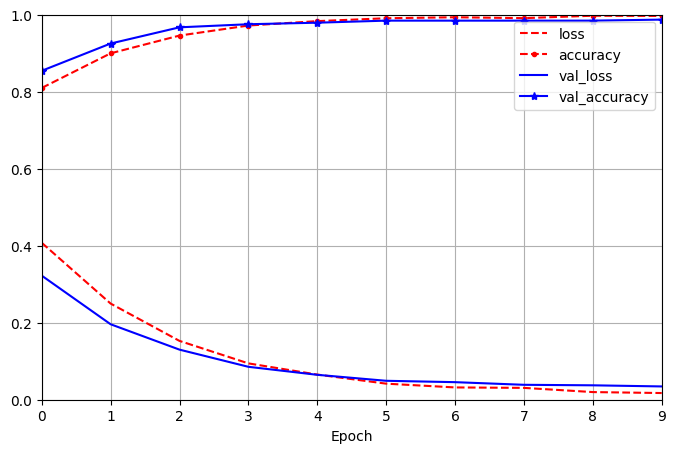

In [116]:
pd.DataFrame(history.history).plot(figsize=(8, 5), xlim=[0, 9], ylim=[0, 1], grid=True, xlabel="Epoch", style=["r--", "r--.", "b-", "b-*"])
plt.show()

Se puede ver en el gráfico que, en las épocas finales, *accuracy* y *val_accuracy* están casi encima de la otra lo que indicaría que no hay un overfitting. Viendo el gráfico se puede decir que la precisión converge a uno y la pérdida a cero.

#### Creación de modelo para regresión

In [117]:
def objetivo_reg(trial: optuna.trial.Trial):
    num_capas = trial.suggest_int("num_layers", 1, 4)
    model = Sequential()
    for i in range(num_capas):
        num_conexiones = trial.suggest_int(f"n_units_layer{i}", 4, 200)
        model.add(Dense(num_conexiones, activation="relu"))
    model.add(Dense(1))
    model.compile(optimizer="adam", loss="mean_squared_error", metrics=[tf.keras.metrics.RootMeanSquaredError(name="rmse")])
    model.fit(fx_train, fy_train, validation_data=(fx_test, fy_test), epochs=10, batch_size=32)
    score = model.evaluate(fx_test, fy_test, verbose=0)
    return score[1]

In [118]:
estudio_reg = optuna.create_study(direction="maximize")
estudio_reg.optimize(objetivo_reg, n_trials=50)

[I 2023-11-21 21:52:03,873] A new study created in memory with name: no-name-b7ff7aee-901c-48fa-9fc3-60c9db3168d4


Epoch 1/10
234/234 [==============================] - 5s 21ms/step - loss: 0.8074 - rmse: 0.8986 - val_loss: 0.3629 - val_rmse: 0.6024
Epoch 2/10
234/234 [==============================] - 5s 21ms/step - loss: 0.6804 - rmse: 0.8249 - val_loss: 0.3551 - val_rmse: 0.5959
Epoch 3/10
234/234 [==============================] - 5s 21ms/step - loss: 0.6347 - rmse: 0.7967 - val_loss: 0.3726 - val_rmse: 0.6104
Epoch 4/10
234/234 [==============================] - 5s 22ms/step - loss: 0.5934 - rmse: 0.7704 - val_loss: 0.4098 - val_rmse: 0.6402
Epoch 5/10
234/234 [==============================] - 5s 21ms/step - loss: 0.5518 - rmse: 0.7428 - val_loss: 0.3948 - val_rmse: 0.6283
Epoch 6/10
234/234 [==============================] - 5s 21ms/step - loss: 0.4940 - rmse: 0.7028 - val_loss: 0.4004 - val_rmse: 0.6328
Epoch 7/10
234/234 [==============================] - 5s 22ms/step - loss: 0.4855 - rmse: 0.6968 - val_loss: 0.4126 - val_rmse: 0.6424
Epoch 8/10
234/234 [==============================] - 5

[I 2023-11-21 21:52:54,451] Trial 0 finished with value: 0.680486261844635 and parameters: {'num_layers': 4, 'n_units_layer0': 133, 'n_units_layer1': 14, 'n_units_layer2': 162, 'n_units_layer3': 178}. Best is trial 0 with value: 0.680486261844635.


Epoch 1/10
234/234 [==============================] - 4s 16ms/step - loss: 0.8030 - rmse: 0.8961 - val_loss: 0.4653 - val_rmse: 0.6821
Epoch 2/10
234/234 [==============================] - 4s 16ms/step - loss: 0.6870 - rmse: 0.8289 - val_loss: 0.3593 - val_rmse: 0.5994
Epoch 3/10
234/234 [==============================] - 4s 16ms/step - loss: 0.6423 - rmse: 0.8014 - val_loss: 0.3473 - val_rmse: 0.5893
Epoch 4/10
234/234 [==============================] - 4s 16ms/step - loss: 0.5967 - rmse: 0.7724 - val_loss: 0.3763 - val_rmse: 0.6135
Epoch 5/10
234/234 [==============================] - 4s 15ms/step - loss: 0.5553 - rmse: 0.7452 - val_loss: 0.3519 - val_rmse: 0.5932
Epoch 6/10
234/234 [==============================] - 4s 15ms/step - loss: 0.5374 - rmse: 0.7331 - val_loss: 0.3826 - val_rmse: 0.6185
Epoch 7/10
234/234 [==============================] - 4s 16ms/step - loss: 0.4782 - rmse: 0.6915 - val_loss: 0.3861 - val_rmse: 0.6214
Epoch 8/10
234/234 [==============================] - 4

[I 2023-11-21 21:53:31,261] Trial 1 finished with value: 0.6705995202064514 and parameters: {'num_layers': 2, 'n_units_layer0': 112, 'n_units_layer1': 176}. Best is trial 0 with value: 0.680486261844635.


Epoch 1/10
234/234 [==============================] - 4s 18ms/step - loss: 0.8025 - rmse: 0.8958 - val_loss: 0.3764 - val_rmse: 0.6135
Epoch 2/10
234/234 [==============================] - 4s 18ms/step - loss: 0.6925 - rmse: 0.8322 - val_loss: 0.3684 - val_rmse: 0.6070
Epoch 3/10
234/234 [==============================] - 4s 18ms/step - loss: 0.6459 - rmse: 0.8037 - val_loss: 0.3505 - val_rmse: 0.5920
Epoch 4/10
234/234 [==============================] - 4s 18ms/step - loss: 0.5914 - rmse: 0.7690 - val_loss: 0.3925 - val_rmse: 0.6265
Epoch 5/10
234/234 [==============================] - 4s 18ms/step - loss: 0.5414 - rmse: 0.7358 - val_loss: 0.3893 - val_rmse: 0.6240
Epoch 6/10
234/234 [==============================] - 4s 18ms/step - loss: 0.4899 - rmse: 0.7000 - val_loss: 0.4705 - val_rmse: 0.6859
Epoch 7/10
234/234 [==============================] - 4s 18ms/step - loss: 0.4450 - rmse: 0.6671 - val_loss: 0.4123 - val_rmse: 0.6421
Epoch 8/10
234/234 [==============================] - 4

[I 2023-11-21 21:54:13,949] Trial 2 finished with value: 0.6536580920219421 and parameters: {'num_layers': 3, 'n_units_layer0': 138, 'n_units_layer1': 124, 'n_units_layer2': 43}. Best is trial 0 with value: 0.680486261844635.


Epoch 1/10
234/234 [==============================] - 3s 12ms/step - loss: 0.8118 - rmse: 0.9010 - val_loss: 0.3998 - val_rmse: 0.6323
Epoch 2/10
234/234 [==============================] - 3s 12ms/step - loss: 0.7105 - rmse: 0.8429 - val_loss: 0.3843 - val_rmse: 0.6199
Epoch 3/10
234/234 [==============================] - 3s 12ms/step - loss: 0.6789 - rmse: 0.8239 - val_loss: 0.3741 - val_rmse: 0.6116
Epoch 4/10
234/234 [==============================] - 3s 12ms/step - loss: 0.6545 - rmse: 0.8090 - val_loss: 0.3752 - val_rmse: 0.6125
Epoch 5/10
234/234 [==============================] - 3s 12ms/step - loss: 0.6416 - rmse: 0.8010 - val_loss: 0.3759 - val_rmse: 0.6131
Epoch 6/10
234/234 [==============================] - 3s 12ms/step - loss: 0.6271 - rmse: 0.7919 - val_loss: 0.3838 - val_rmse: 0.6195
Epoch 7/10
234/234 [==============================] - 3s 12ms/step - loss: 0.6125 - rmse: 0.7826 - val_loss: 0.3782 - val_rmse: 0.6149
Epoch 8/10
234/234 [==============================] - 3

[I 2023-11-21 21:54:43,226] Trial 3 finished with value: 0.6244174242019653 and parameters: {'num_layers': 1, 'n_units_layer0': 152}. Best is trial 0 with value: 0.680486261844635.


Epoch 1/10
234/234 [==============================] - 5s 21ms/step - loss: 0.8059 - rmse: 0.8977 - val_loss: 0.3718 - val_rmse: 0.6098
Epoch 2/10
234/234 [==============================] - 5s 21ms/step - loss: 0.6798 - rmse: 0.8245 - val_loss: 0.4005 - val_rmse: 0.6329
Epoch 3/10
234/234 [==============================] - 5s 21ms/step - loss: 0.6239 - rmse: 0.7898 - val_loss: 0.4195 - val_rmse: 0.6477
Epoch 4/10
234/234 [==============================] - 5s 21ms/step - loss: 0.5993 - rmse: 0.7741 - val_loss: 0.3710 - val_rmse: 0.6091
Epoch 5/10
234/234 [==============================] - 5s 21ms/step - loss: 0.5378 - rmse: 0.7333 - val_loss: 0.4030 - val_rmse: 0.6348
Epoch 6/10
234/234 [==============================] - 5s 21ms/step - loss: 0.4909 - rmse: 0.7006 - val_loss: 0.4046 - val_rmse: 0.6361
Epoch 7/10
234/234 [==============================] - 5s 21ms/step - loss: 0.4830 - rmse: 0.6950 - val_loss: 0.4544 - val_rmse: 0.6741
Epoch 8/10
234/234 [==============================] - 5

[I 2023-11-21 21:55:32,907] Trial 4 finished with value: 0.6402567028999329 and parameters: {'num_layers': 4, 'n_units_layer0': 64, 'n_units_layer1': 161, 'n_units_layer2': 31, 'n_units_layer3': 96}. Best is trial 0 with value: 0.680486261844635.


Epoch 1/10
234/234 [==============================] - 3s 12ms/step - loss: 0.8143 - rmse: 0.9024 - val_loss: 0.3964 - val_rmse: 0.6296
Epoch 2/10
234/234 [==============================] - 3s 12ms/step - loss: 0.7095 - rmse: 0.8423 - val_loss: 0.3795 - val_rmse: 0.6161
Epoch 3/10
234/234 [==============================] - 3s 13ms/step - loss: 0.6792 - rmse: 0.8241 - val_loss: 0.3834 - val_rmse: 0.6192
Epoch 4/10
234/234 [==============================] - 3s 12ms/step - loss: 0.6635 - rmse: 0.8146 - val_loss: 0.3733 - val_rmse: 0.6110
Epoch 5/10
234/234 [==============================] - 3s 12ms/step - loss: 0.6455 - rmse: 0.8034 - val_loss: 0.3683 - val_rmse: 0.6068
Epoch 6/10
234/234 [==============================] - 3s 12ms/step - loss: 0.6305 - rmse: 0.7940 - val_loss: 0.3656 - val_rmse: 0.6046
Epoch 7/10
234/234 [==============================] - 3s 13ms/step - loss: 0.6192 - rmse: 0.7869 - val_loss: 0.3740 - val_rmse: 0.6115
Epoch 8/10
234/234 [==============================] - 3

[I 2023-11-21 21:56:02,348] Trial 5 finished with value: 0.6314153075218201 and parameters: {'num_layers': 1, 'n_units_layer0': 188}. Best is trial 0 with value: 0.680486261844635.


Epoch 1/10
234/234 [==============================] - 4s 16ms/step - loss: 0.8614 - rmse: 0.9281 - val_loss: 0.3931 - val_rmse: 0.6269
Epoch 2/10
234/234 [==============================] - 3s 15ms/step - loss: 0.7089 - rmse: 0.8420 - val_loss: 0.3722 - val_rmse: 0.6100
Epoch 3/10
234/234 [==============================] - 4s 16ms/step - loss: 0.6546 - rmse: 0.8091 - val_loss: 0.3604 - val_rmse: 0.6003
Epoch 4/10
234/234 [==============================] - 3s 15ms/step - loss: 0.6277 - rmse: 0.7923 - val_loss: 0.3888 - val_rmse: 0.6236
Epoch 5/10
234/234 [==============================] - 3s 15ms/step - loss: 0.5975 - rmse: 0.7730 - val_loss: 0.3709 - val_rmse: 0.6090
Epoch 6/10
234/234 [==============================] - 3s 15ms/step - loss: 0.5720 - rmse: 0.7563 - val_loss: 0.3752 - val_rmse: 0.6126
Epoch 7/10
234/234 [==============================] - 4s 15ms/step - loss: 0.5450 - rmse: 0.7382 - val_loss: 0.3702 - val_rmse: 0.6084
Epoch 8/10
234/234 [==============================] - 4

[I 2023-11-21 21:56:38,220] Trial 6 finished with value: 0.6300424337387085 and parameters: {'num_layers': 2, 'n_units_layer0': 79, 'n_units_layer1': 42}. Best is trial 0 with value: 0.680486261844635.


Epoch 1/10
234/234 [==============================] - 3s 12ms/step - loss: 0.8039 - rmse: 0.8966 - val_loss: 0.3920 - val_rmse: 0.6261
Epoch 2/10
234/234 [==============================] - 3s 12ms/step - loss: 0.7115 - rmse: 0.8435 - val_loss: 0.3849 - val_rmse: 0.6204
Epoch 3/10
234/234 [==============================] - 3s 12ms/step - loss: 0.6854 - rmse: 0.8279 - val_loss: 0.3776 - val_rmse: 0.6145
Epoch 4/10
234/234 [==============================] - 3s 12ms/step - loss: 0.6639 - rmse: 0.8148 - val_loss: 0.3736 - val_rmse: 0.6112
Epoch 5/10
234/234 [==============================] - 3s 12ms/step - loss: 0.6461 - rmse: 0.8038 - val_loss: 0.3635 - val_rmse: 0.6029
Epoch 6/10
234/234 [==============================] - 3s 12ms/step - loss: 0.6324 - rmse: 0.7952 - val_loss: 0.3693 - val_rmse: 0.6077
Epoch 7/10
234/234 [==============================] - 3s 12ms/step - loss: 0.6164 - rmse: 0.7851 - val_loss: 0.3723 - val_rmse: 0.6102
Epoch 8/10
234/234 [==============================] - 3

[I 2023-11-21 21:57:07,548] Trial 7 finished with value: 0.6110192537307739 and parameters: {'num_layers': 1, 'n_units_layer0': 153}. Best is trial 0 with value: 0.680486261844635.


Epoch 1/10
234/234 [==============================] - 5s 21ms/step - loss: 0.8432 - rmse: 0.9183 - val_loss: 0.3890 - val_rmse: 0.6237
Epoch 2/10
234/234 [==============================] - 5s 20ms/step - loss: 0.6823 - rmse: 0.8260 - val_loss: 0.3546 - val_rmse: 0.5955
Epoch 3/10
234/234 [==============================] - 5s 21ms/step - loss: 0.6158 - rmse: 0.7847 - val_loss: 0.3603 - val_rmse: 0.6003
Epoch 4/10
234/234 [==============================] - 5s 21ms/step - loss: 0.5913 - rmse: 0.7690 - val_loss: 0.4679 - val_rmse: 0.6840
Epoch 5/10
234/234 [==============================] - 5s 21ms/step - loss: 0.5470 - rmse: 0.7396 - val_loss: 0.3782 - val_rmse: 0.6150
Epoch 6/10
234/234 [==============================] - 5s 21ms/step - loss: 0.5289 - rmse: 0.7272 - val_loss: 0.4302 - val_rmse: 0.6559
Epoch 7/10
234/234 [==============================] - 5s 21ms/step - loss: 0.4403 - rmse: 0.6635 - val_loss: 0.3747 - val_rmse: 0.6121
Epoch 8/10
234/234 [==============================] - 5

[I 2023-11-21 21:57:56,663] Trial 8 finished with value: 0.7026256322860718 and parameters: {'num_layers': 4, 'n_units_layer0': 123, 'n_units_layer1': 10, 'n_units_layer2': 114, 'n_units_layer3': 159}. Best is trial 8 with value: 0.7026256322860718.


Epoch 1/10
234/234 [==============================] - 4s 16ms/step - loss: 0.7943 - rmse: 0.8912 - val_loss: 0.4551 - val_rmse: 0.6746
Epoch 2/10
234/234 [==============================] - 4s 16ms/step - loss: 0.6932 - rmse: 0.8326 - val_loss: 0.3571 - val_rmse: 0.5975
Epoch 3/10
234/234 [==============================] - 4s 15ms/step - loss: 0.6351 - rmse: 0.7969 - val_loss: 0.3914 - val_rmse: 0.6256
Epoch 4/10
234/234 [==============================] - 4s 15ms/step - loss: 0.5847 - rmse: 0.7646 - val_loss: 0.3572 - val_rmse: 0.5976
Epoch 5/10
234/234 [==============================] - 4s 16ms/step - loss: 0.5240 - rmse: 0.7239 - val_loss: 0.4287 - val_rmse: 0.6547
Epoch 6/10
234/234 [==============================] - 4s 15ms/step - loss: 0.4976 - rmse: 0.7054 - val_loss: 0.4144 - val_rmse: 0.6437
Epoch 7/10
234/234 [==============================] - 4s 15ms/step - loss: 0.4602 - rmse: 0.6784 - val_loss: 0.3868 - val_rmse: 0.6219
Epoch 8/10
234/234 [==============================] - 4

[I 2023-11-21 21:58:33,601] Trial 9 finished with value: 0.665225625038147 and parameters: {'num_layers': 2, 'n_units_layer0': 190, 'n_units_layer1': 123}. Best is trial 8 with value: 0.7026256322860718.


Epoch 1/10
234/234 [==============================] - 4s 18ms/step - loss: 0.8232 - rmse: 0.9073 - val_loss: 0.3788 - val_rmse: 0.6155
Epoch 2/10
234/234 [==============================] - 4s 18ms/step - loss: 0.6864 - rmse: 0.8285 - val_loss: 0.3565 - val_rmse: 0.5971
Epoch 3/10
234/234 [==============================] - 4s 18ms/step - loss: 0.6440 - rmse: 0.8025 - val_loss: 0.3723 - val_rmse: 0.6101
Epoch 4/10
234/234 [==============================] - 4s 18ms/step - loss: 0.5992 - rmse: 0.7741 - val_loss: 0.3797 - val_rmse: 0.6162
Epoch 5/10
234/234 [==============================] - 4s 18ms/step - loss: 0.5760 - rmse: 0.7590 - val_loss: 0.3790 - val_rmse: 0.6156
Epoch 6/10
234/234 [==============================] - 4s 18ms/step - loss: 0.5369 - rmse: 0.7327 - val_loss: 0.4090 - val_rmse: 0.6395
Epoch 7/10
234/234 [==============================] - 4s 18ms/step - loss: 0.4825 - rmse: 0.6946 - val_loss: 0.3899 - val_rmse: 0.6244
Epoch 8/10
234/234 [==============================] - 4

[I 2023-11-21 21:59:15,632] Trial 10 finished with value: 0.6802588105201721 and parameters: {'num_layers': 3, 'n_units_layer0': 55, 'n_units_layer1': 53, 'n_units_layer2': 137}. Best is trial 8 with value: 0.7026256322860718.


Epoch 1/10
234/234 [==============================] - 5s 21ms/step - loss: 0.9912 - rmse: 0.9956 - val_loss: 0.5237 - val_rmse: 0.7237
Epoch 2/10
234/234 [==============================] - 5s 21ms/step - loss: 0.8834 - rmse: 0.9399 - val_loss: 0.4758 - val_rmse: 0.6898
Epoch 3/10
234/234 [==============================] - 5s 21ms/step - loss: 0.8233 - rmse: 0.9074 - val_loss: 0.4174 - val_rmse: 0.6460
Epoch 4/10
234/234 [==============================] - 5s 21ms/step - loss: 0.7660 - rmse: 0.8752 - val_loss: 0.4379 - val_rmse: 0.6617
Epoch 5/10
234/234 [==============================] - 5s 21ms/step - loss: 0.7293 - rmse: 0.8540 - val_loss: 0.4046 - val_rmse: 0.6361
Epoch 6/10
234/234 [==============================] - 5s 21ms/step - loss: 0.7124 - rmse: 0.8441 - val_loss: 0.3966 - val_rmse: 0.6298
Epoch 7/10
234/234 [==============================] - 5s 21ms/step - loss: 0.6981 - rmse: 0.8355 - val_loss: 0.4242 - val_rmse: 0.6513
Epoch 8/10
234/234 [==============================] - 5

[I 2023-11-21 22:00:05,155] Trial 11 finished with value: 0.6433959007263184 and parameters: {'num_layers': 4, 'n_units_layer0': 4, 'n_units_layer1': 12, 'n_units_layer2': 189, 'n_units_layer3': 195}. Best is trial 8 with value: 0.7026256322860718.


Epoch 1/10
234/234 [==============================] - 5s 21ms/step - loss: 0.8269 - rmse: 0.9094 - val_loss: 0.4046 - val_rmse: 0.6361
Epoch 2/10
234/234 [==============================] - 5s 21ms/step - loss: 0.6913 - rmse: 0.8314 - val_loss: 0.3808 - val_rmse: 0.6171
Epoch 3/10
234/234 [==============================] - 5s 21ms/step - loss: 0.6370 - rmse: 0.7981 - val_loss: 0.3949 - val_rmse: 0.6284
Epoch 4/10
234/234 [==============================] - 5s 21ms/step - loss: 0.5862 - rmse: 0.7656 - val_loss: 0.4527 - val_rmse: 0.6729
Epoch 5/10
234/234 [==============================] - 5s 21ms/step - loss: 0.5614 - rmse: 0.7493 - val_loss: 0.3839 - val_rmse: 0.6196
Epoch 6/10
234/234 [==============================] - 5s 21ms/step - loss: 0.5174 - rmse: 0.7193 - val_loss: 0.5000 - val_rmse: 0.7071
Epoch 7/10
234/234 [==============================] - 5s 21ms/step - loss: 0.4986 - rmse: 0.7061 - val_loss: 0.4150 - val_rmse: 0.6442
Epoch 8/10
234/234 [==============================] - 5

[I 2023-11-21 22:00:55,050] Trial 12 finished with value: 0.6740792393684387 and parameters: {'num_layers': 4, 'n_units_layer0': 111, 'n_units_layer1': 5, 'n_units_layer2': 127, 'n_units_layer3': 184}. Best is trial 8 with value: 0.7026256322860718.


Epoch 1/10
234/234 [==============================] - 4s 18ms/step - loss: 0.8145 - rmse: 0.9025 - val_loss: 0.3572 - val_rmse: 0.5977
Epoch 2/10
234/234 [==============================] - 4s 18ms/step - loss: 0.6788 - rmse: 0.8239 - val_loss: 0.3555 - val_rmse: 0.5962
Epoch 3/10
234/234 [==============================] - 4s 18ms/step - loss: 0.6182 - rmse: 0.7862 - val_loss: 0.3812 - val_rmse: 0.6174
Epoch 4/10
234/234 [==============================] - 4s 18ms/step - loss: 0.5600 - rmse: 0.7483 - val_loss: 0.4531 - val_rmse: 0.6731
Epoch 5/10
234/234 [==============================] - 4s 18ms/step - loss: 0.5204 - rmse: 0.7214 - val_loss: 0.3876 - val_rmse: 0.6225
Epoch 6/10
234/234 [==============================] - 4s 18ms/step - loss: 0.4748 - rmse: 0.6891 - val_loss: 0.4948 - val_rmse: 0.7034
Epoch 7/10
234/234 [==============================] - 4s 18ms/step - loss: 0.4318 - rmse: 0.6571 - val_loss: 0.4466 - val_rmse: 0.6683
Epoch 8/10
234/234 [==============================] - 4

[I 2023-11-21 22:01:37,319] Trial 13 finished with value: 0.6489450335502625 and parameters: {'num_layers': 3, 'n_units_layer0': 134, 'n_units_layer1': 63, 'n_units_layer2': 189}. Best is trial 8 with value: 0.7026256322860718.


Epoch 1/10
234/234 [==============================] - 5s 21ms/step - loss: 0.8064 - rmse: 0.8980 - val_loss: 0.3624 - val_rmse: 0.6020
Epoch 2/10
234/234 [==============================] - 5s 21ms/step - loss: 0.6703 - rmse: 0.8187 - val_loss: 0.3741 - val_rmse: 0.6116
Epoch 3/10
234/234 [==============================] - 5s 21ms/step - loss: 0.6239 - rmse: 0.7899 - val_loss: 0.4040 - val_rmse: 0.6356
Epoch 4/10
234/234 [==============================] - 5s 21ms/step - loss: 0.5734 - rmse: 0.7573 - val_loss: 0.3604 - val_rmse: 0.6004
Epoch 5/10
234/234 [==============================] - 5s 21ms/step - loss: 0.5198 - rmse: 0.7209 - val_loss: 0.5326 - val_rmse: 0.7298
Epoch 6/10
234/234 [==============================] - 5s 21ms/step - loss: 0.5002 - rmse: 0.7073 - val_loss: 0.4383 - val_rmse: 0.6620
Epoch 7/10
234/234 [==============================] - 5s 21ms/step - loss: 0.4225 - rmse: 0.6500 - val_loss: 0.4185 - val_rmse: 0.6469
Epoch 8/10
234/234 [==============================] - 5

[I 2023-11-21 22:02:26,791] Trial 14 finished with value: 0.6559479832649231 and parameters: {'num_layers': 4, 'n_units_layer0': 89, 'n_units_layer1': 85, 'n_units_layer2': 93, 'n_units_layer3': 150}. Best is trial 8 with value: 0.7026256322860718.


Epoch 1/10
234/234 [==============================] - 4s 18ms/step - loss: 0.8050 - rmse: 0.8972 - val_loss: 0.3798 - val_rmse: 0.6163
Epoch 2/10
234/234 [==============================] - 4s 18ms/step - loss: 0.6819 - rmse: 0.8258 - val_loss: 0.3589 - val_rmse: 0.5990
Epoch 3/10
234/234 [==============================] - 4s 18ms/step - loss: 0.6192 - rmse: 0.7869 - val_loss: 0.3707 - val_rmse: 0.6088
Epoch 4/10
234/234 [==============================] - 4s 18ms/step - loss: 0.5592 - rmse: 0.7478 - val_loss: 0.3556 - val_rmse: 0.5963
Epoch 5/10
234/234 [==============================] - 4s 18ms/step - loss: 0.5281 - rmse: 0.7267 - val_loss: 0.4829 - val_rmse: 0.6949
Epoch 6/10
234/234 [==============================] - 4s 18ms/step - loss: 0.4868 - rmse: 0.6977 - val_loss: 0.4393 - val_rmse: 0.6628
Epoch 7/10
234/234 [==============================] - 4s 18ms/step - loss: 0.4224 - rmse: 0.6499 - val_loss: 0.5713 - val_rmse: 0.7559
Epoch 8/10
234/234 [==============================] - 4

[I 2023-11-21 22:03:08,702] Trial 15 finished with value: 0.665156364440918 and parameters: {'num_layers': 3, 'n_units_layer0': 172, 'n_units_layer1': 26, 'n_units_layer2': 148}. Best is trial 8 with value: 0.7026256322860718.


Epoch 1/10
234/234 [==============================] - 5s 21ms/step - loss: 0.8260 - rmse: 0.9089 - val_loss: 0.3696 - val_rmse: 0.6079
Epoch 2/10
234/234 [==============================] - 5s 21ms/step - loss: 0.6941 - rmse: 0.8331 - val_loss: 0.3638 - val_rmse: 0.6031
Epoch 3/10
234/234 [==============================] - 5s 20ms/step - loss: 0.6530 - rmse: 0.8081 - val_loss: 0.3347 - val_rmse: 0.5785
Epoch 4/10
234/234 [==============================] - 5s 20ms/step - loss: 0.6028 - rmse: 0.7764 - val_loss: 0.4010 - val_rmse: 0.6333
Epoch 5/10
234/234 [==============================] - 5s 20ms/step - loss: 0.5682 - rmse: 0.7538 - val_loss: 0.3774 - val_rmse: 0.6143
Epoch 6/10
234/234 [==============================] - 5s 21ms/step - loss: 0.5132 - rmse: 0.7164 - val_loss: 0.3915 - val_rmse: 0.6257
Epoch 7/10
234/234 [==============================] - 5s 21ms/step - loss: 0.4889 - rmse: 0.6992 - val_loss: 0.4492 - val_rmse: 0.6702
Epoch 8/10
234/234 [==============================] - 5

[I 2023-11-21 22:03:57,898] Trial 16 finished with value: 0.6446486115455627 and parameters: {'num_layers': 4, 'n_units_layer0': 114, 'n_units_layer1': 78, 'n_units_layer2': 71, 'n_units_layer3': 23}. Best is trial 8 with value: 0.7026256322860718.


Epoch 1/10
234/234 [==============================] - 5s 21ms/step - loss: 0.8473 - rmse: 0.9205 - val_loss: 0.3897 - val_rmse: 0.6242
Epoch 2/10
234/234 [==============================] - 5s 21ms/step - loss: 0.7153 - rmse: 0.8458 - val_loss: 0.3669 - val_rmse: 0.6058
Epoch 3/10
234/234 [==============================] - 5s 21ms/step - loss: 0.6444 - rmse: 0.8027 - val_loss: 0.4877 - val_rmse: 0.6984
Epoch 4/10
234/234 [==============================] - 5s 21ms/step - loss: 0.5954 - rmse: 0.7716 - val_loss: 0.4067 - val_rmse: 0.6378
Epoch 5/10
234/234 [==============================] - 5s 21ms/step - loss: 0.5495 - rmse: 0.7413 - val_loss: 0.3886 - val_rmse: 0.6234
Epoch 6/10
234/234 [==============================] - 5s 21ms/step - loss: 0.4856 - rmse: 0.6969 - val_loss: 0.4055 - val_rmse: 0.6368
Epoch 7/10
234/234 [==============================] - 5s 21ms/step - loss: 0.4632 - rmse: 0.6806 - val_loss: 0.4156 - val_rmse: 0.6447
Epoch 8/10
234/234 [==============================] - 5

[I 2023-11-21 22:04:47,660] Trial 17 finished with value: 0.6690724492073059 and parameters: {'num_layers': 4, 'n_units_layer0': 48, 'n_units_layer1': 34, 'n_units_layer2': 160, 'n_units_layer3': 127}. Best is trial 8 with value: 0.7026256322860718.


Epoch 1/10
234/234 [==============================] - 4s 18ms/step - loss: 0.8753 - rmse: 0.9356 - val_loss: 0.3844 - val_rmse: 0.6200
Epoch 2/10
234/234 [==============================] - 4s 18ms/step - loss: 0.6924 - rmse: 0.8321 - val_loss: 0.3490 - val_rmse: 0.5908
Epoch 3/10
234/234 [==============================] - 4s 18ms/step - loss: 0.6310 - rmse: 0.7944 - val_loss: 0.3717 - val_rmse: 0.6097
Epoch 4/10
234/234 [==============================] - 4s 18ms/step - loss: 0.5972 - rmse: 0.7728 - val_loss: 0.3711 - val_rmse: 0.6092
Epoch 5/10
234/234 [==============================] - 4s 18ms/step - loss: 0.5628 - rmse: 0.7502 - val_loss: 0.4383 - val_rmse: 0.6621
Epoch 6/10
234/234 [==============================] - 4s 18ms/step - loss: 0.5436 - rmse: 0.7373 - val_loss: 0.3667 - val_rmse: 0.6055
Epoch 7/10
234/234 [==============================] - 4s 18ms/step - loss: 0.5172 - rmse: 0.7192 - val_loss: 0.4198 - val_rmse: 0.6479
Epoch 8/10
234/234 [==============================] - 4

[I 2023-11-21 22:05:29,917] Trial 18 finished with value: 0.6563464403152466 and parameters: {'num_layers': 3, 'n_units_layer0': 131, 'n_units_layer1': 8, 'n_units_layer2': 105}. Best is trial 8 with value: 0.7026256322860718.


Epoch 1/10
234/234 [==============================] - 5s 21ms/step - loss: 0.7904 - rmse: 0.8890 - val_loss: 0.4023 - val_rmse: 0.6343
Epoch 2/10
234/234 [==============================] - 5s 21ms/step - loss: 0.7102 - rmse: 0.8427 - val_loss: 0.3594 - val_rmse: 0.5995
Epoch 3/10
234/234 [==============================] - 5s 21ms/step - loss: 0.6203 - rmse: 0.7876 - val_loss: 0.3710 - val_rmse: 0.6091
Epoch 4/10
234/234 [==============================] - 5s 22ms/step - loss: 0.5783 - rmse: 0.7604 - val_loss: 0.3974 - val_rmse: 0.6304
Epoch 5/10
234/234 [==============================] - 5s 22ms/step - loss: 0.5344 - rmse: 0.7311 - val_loss: 0.3933 - val_rmse: 0.6271
Epoch 6/10
234/234 [==============================] - 5s 21ms/step - loss: 0.4826 - rmse: 0.6947 - val_loss: 0.5417 - val_rmse: 0.7360
Epoch 7/10
234/234 [==============================] - 5s 22ms/step - loss: 0.4478 - rmse: 0.6692 - val_loss: 0.4600 - val_rmse: 0.6782
Epoch 8/10
234/234 [==============================] - 5

[I 2023-11-21 22:06:20,600] Trial 19 finished with value: 0.7083489894866943 and parameters: {'num_layers': 4, 'n_units_layer0': 163, 'n_units_layer1': 111, 'n_units_layer2': 113, 'n_units_layer3': 150}. Best is trial 19 with value: 0.7083489894866943.


Epoch 1/10
234/234 [==============================] - 4s 19ms/step - loss: 0.8009 - rmse: 0.8949 - val_loss: 0.3746 - val_rmse: 0.6120
Epoch 2/10
234/234 [==============================] - 4s 18ms/step - loss: 0.6963 - rmse: 0.8344 - val_loss: 0.3337 - val_rmse: 0.5777
Epoch 3/10
234/234 [==============================] - 4s 18ms/step - loss: 0.6277 - rmse: 0.7923 - val_loss: 0.4993 - val_rmse: 0.7066
Epoch 4/10
234/234 [==============================] - 4s 18ms/step - loss: 0.5927 - rmse: 0.7699 - val_loss: 0.3826 - val_rmse: 0.6185
Epoch 5/10
234/234 [==============================] - 4s 19ms/step - loss: 0.5402 - rmse: 0.7350 - val_loss: 0.4055 - val_rmse: 0.6368
Epoch 6/10
234/234 [==============================] - 4s 18ms/step - loss: 0.4814 - rmse: 0.6938 - val_loss: 0.3910 - val_rmse: 0.6253
Epoch 7/10
234/234 [==============================] - 4s 18ms/step - loss: 0.4288 - rmse: 0.6548 - val_loss: 0.4351 - val_rmse: 0.6596
Epoch 8/10
234/234 [==============================] - 4

[I 2023-11-21 22:07:03,565] Trial 20 finished with value: 0.7131864428520203 and parameters: {'num_layers': 3, 'n_units_layer0': 168, 'n_units_layer1': 118, 'n_units_layer2': 69}. Best is trial 20 with value: 0.7131864428520203.


Epoch 1/10
234/234 [==============================] - 4s 19ms/step - loss: 0.7959 - rmse: 0.8921 - val_loss: 0.4155 - val_rmse: 0.6446
Epoch 2/10
234/234 [==============================] - 4s 19ms/step - loss: 0.6752 - rmse: 0.8217 - val_loss: 0.3608 - val_rmse: 0.6007
Epoch 3/10
234/234 [==============================] - 4s 18ms/step - loss: 0.6237 - rmse: 0.7897 - val_loss: 0.3513 - val_rmse: 0.5927
Epoch 4/10
234/234 [==============================] - 4s 18ms/step - loss: 0.5737 - rmse: 0.7574 - val_loss: 0.3902 - val_rmse: 0.6246
Epoch 5/10
234/234 [==============================] - 4s 18ms/step - loss: 0.5352 - rmse: 0.7316 - val_loss: 0.4281 - val_rmse: 0.6543
Epoch 6/10
234/234 [==============================] - 4s 18ms/step - loss: 0.4984 - rmse: 0.7060 - val_loss: 0.4054 - val_rmse: 0.6367
Epoch 7/10
234/234 [==============================] - 4s 18ms/step - loss: 0.4229 - rmse: 0.6503 - val_loss: 0.4399 - val_rmse: 0.6633
Epoch 8/10
234/234 [==============================] - 4

[I 2023-11-21 22:07:46,670] Trial 21 finished with value: 0.6869285702705383 and parameters: {'num_layers': 3, 'n_units_layer0': 167, 'n_units_layer1': 119, 'n_units_layer2': 71}. Best is trial 20 with value: 0.7131864428520203.


Epoch 1/10
234/234 [==============================] - 5s 21ms/step - loss: 0.7903 - rmse: 0.8890 - val_loss: 0.3563 - val_rmse: 0.5969
Epoch 2/10
234/234 [==============================] - 5s 21ms/step - loss: 0.6574 - rmse: 0.8108 - val_loss: 0.3850 - val_rmse: 0.6205
Epoch 3/10
234/234 [==============================] - 5s 22ms/step - loss: 0.6127 - rmse: 0.7827 - val_loss: 0.3688 - val_rmse: 0.6073
Epoch 4/10
234/234 [==============================] - 5s 22ms/step - loss: 0.5653 - rmse: 0.7519 - val_loss: 0.3938 - val_rmse: 0.6275
Epoch 5/10
234/234 [==============================] - 5s 22ms/step - loss: 0.5322 - rmse: 0.7295 - val_loss: 0.4748 - val_rmse: 0.6890
Epoch 6/10
234/234 [==============================] - 5s 21ms/step - loss: 0.4744 - rmse: 0.6888 - val_loss: 0.6185 - val_rmse: 0.7865
Epoch 7/10
234/234 [==============================] - 5s 21ms/step - loss: 0.4387 - rmse: 0.6623 - val_loss: 0.3987 - val_rmse: 0.6314
Epoch 8/10
234/234 [==============================] - 5

[I 2023-11-21 22:08:37,060] Trial 22 finished with value: 0.6506760120391846 and parameters: {'num_layers': 4, 'n_units_layer0': 199, 'n_units_layer1': 149, 'n_units_layer2': 107, 'n_units_layer3': 92}. Best is trial 20 with value: 0.7131864428520203.


Epoch 1/10
234/234 [==============================] - 4s 18ms/step - loss: 0.8033 - rmse: 0.8963 - val_loss: 0.3677 - val_rmse: 0.6064
Epoch 2/10
234/234 [==============================] - 4s 18ms/step - loss: 0.6812 - rmse: 0.8253 - val_loss: 0.3924 - val_rmse: 0.6264
Epoch 3/10
234/234 [==============================] - 4s 18ms/step - loss: 0.6423 - rmse: 0.8015 - val_loss: 0.3911 - val_rmse: 0.6254
Epoch 4/10
234/234 [==============================] - 4s 19ms/step - loss: 0.5754 - rmse: 0.7586 - val_loss: 0.3585 - val_rmse: 0.5987
Epoch 5/10
234/234 [==============================] - 4s 18ms/step - loss: 0.5621 - rmse: 0.7497 - val_loss: 0.3577 - val_rmse: 0.5981
Epoch 6/10
234/234 [==============================] - 4s 19ms/step - loss: 0.5106 - rmse: 0.7146 - val_loss: 0.4708 - val_rmse: 0.6861
Epoch 7/10
234/234 [==============================] - 4s 19ms/step - loss: 0.4203 - rmse: 0.6483 - val_loss: 0.5025 - val_rmse: 0.7089
Epoch 8/10
234/234 [==============================] - 4

[I 2023-11-21 22:09:20,729] Trial 23 finished with value: 0.6916937828063965 and parameters: {'num_layers': 3, 'n_units_layer0': 172, 'n_units_layer1': 99, 'n_units_layer2': 67}. Best is trial 20 with value: 0.7131864428520203.


Epoch 1/10
234/234 [==============================] - 5s 22ms/step - loss: 0.8025 - rmse: 0.8958 - val_loss: 0.4090 - val_rmse: 0.6395
Epoch 2/10
234/234 [==============================] - 5s 22ms/step - loss: 0.7012 - rmse: 0.8374 - val_loss: 0.3530 - val_rmse: 0.5941
Epoch 3/10
234/234 [==============================] - 5s 22ms/step - loss: 0.6320 - rmse: 0.7950 - val_loss: 0.3627 - val_rmse: 0.6022
Epoch 4/10
234/234 [==============================] - 5s 22ms/step - loss: 0.5985 - rmse: 0.7736 - val_loss: 0.3953 - val_rmse: 0.6287
Epoch 5/10
234/234 [==============================] - 5s 22ms/step - loss: 0.5868 - rmse: 0.7660 - val_loss: 0.3704 - val_rmse: 0.6086
Epoch 6/10
234/234 [==============================] - 5s 22ms/step - loss: 0.5203 - rmse: 0.7213 - val_loss: 0.4110 - val_rmse: 0.6411
Epoch 7/10
234/234 [==============================] - 5s 22ms/step - loss: 0.4472 - rmse: 0.6687 - val_loss: 0.3912 - val_rmse: 0.6254
Epoch 8/10
234/234 [==============================] - 5

[I 2023-11-21 22:10:12,042] Trial 24 finished with value: 0.9169341325759888 and parameters: {'num_layers': 4, 'n_units_layer0': 152, 'n_units_layer1': 143, 'n_units_layer2': 118, 'n_units_layer3': 135}. Best is trial 24 with value: 0.9169341325759888.


Epoch 1/10
234/234 [==============================] - 4s 15ms/step - loss: 0.8061 - rmse: 0.8978 - val_loss: 0.4411 - val_rmse: 0.6641
Epoch 2/10
234/234 [==============================] - 3s 15ms/step - loss: 0.6882 - rmse: 0.8296 - val_loss: 0.3591 - val_rmse: 0.5992
Epoch 3/10
234/234 [==============================] - 4s 15ms/step - loss: 0.6254 - rmse: 0.7908 - val_loss: 0.3920 - val_rmse: 0.6261
Epoch 4/10
234/234 [==============================] - 4s 15ms/step - loss: 0.5880 - rmse: 0.7668 - val_loss: 0.3643 - val_rmse: 0.6036
Epoch 5/10
234/234 [==============================] - 4s 15ms/step - loss: 0.5490 - rmse: 0.7409 - val_loss: 0.3696 - val_rmse: 0.6080
Epoch 6/10
234/234 [==============================] - 4s 15ms/step - loss: 0.5068 - rmse: 0.7119 - val_loss: 0.3914 - val_rmse: 0.6256
Epoch 7/10
234/234 [==============================] - 4s 15ms/step - loss: 0.4751 - rmse: 0.6893 - val_loss: 0.4250 - val_rmse: 0.6519
Epoch 8/10
234/234 [==============================] - 4

[I 2023-11-21 22:10:48,090] Trial 25 finished with value: 0.7091478109359741 and parameters: {'num_layers': 2, 'n_units_layer0': 153, 'n_units_layer1': 141}. Best is trial 24 with value: 0.9169341325759888.


Epoch 1/10
234/234 [==============================] - 4s 15ms/step - loss: 0.7855 - rmse: 0.8863 - val_loss: 0.4052 - val_rmse: 0.6365
Epoch 2/10
234/234 [==============================] - 4s 15ms/step - loss: 0.6827 - rmse: 0.8262 - val_loss: 0.3545 - val_rmse: 0.5954
Epoch 3/10
234/234 [==============================] - 4s 15ms/step - loss: 0.6409 - rmse: 0.8005 - val_loss: 0.3528 - val_rmse: 0.5940
Epoch 4/10
234/234 [==============================] - 4s 15ms/step - loss: 0.5984 - rmse: 0.7736 - val_loss: 0.3857 - val_rmse: 0.6211
Epoch 5/10
234/234 [==============================] - 3s 15ms/step - loss: 0.5529 - rmse: 0.7435 - val_loss: 0.3909 - val_rmse: 0.6252
Epoch 6/10
234/234 [==============================] - 3s 15ms/step - loss: 0.5354 - rmse: 0.7317 - val_loss: 0.3948 - val_rmse: 0.6283
Epoch 7/10
234/234 [==============================] - 3s 15ms/step - loss: 0.4719 - rmse: 0.6869 - val_loss: 0.3995 - val_rmse: 0.6321
Epoch 8/10
234/234 [==============================] - 4

[I 2023-11-21 22:11:24,215] Trial 26 finished with value: 0.7140100598335266 and parameters: {'num_layers': 2, 'n_units_layer0': 150, 'n_units_layer1': 199}. Best is trial 24 with value: 0.9169341325759888.


Epoch 1/10
234/234 [==============================] - 4s 16ms/step - loss: 0.7697 - rmse: 0.8773 - val_loss: 0.4653 - val_rmse: 0.6821
Epoch 2/10
234/234 [==============================] - 4s 16ms/step - loss: 0.6691 - rmse: 0.8180 - val_loss: 0.3791 - val_rmse: 0.6157
Epoch 3/10
234/234 [==============================] - 4s 15ms/step - loss: 0.6310 - rmse: 0.7943 - val_loss: 0.4058 - val_rmse: 0.6370
Epoch 4/10
234/234 [==============================] - 4s 15ms/step - loss: 0.5833 - rmse: 0.7637 - val_loss: 0.4221 - val_rmse: 0.6497
Epoch 5/10
234/234 [==============================] - 4s 15ms/step - loss: 0.5622 - rmse: 0.7498 - val_loss: 0.4111 - val_rmse: 0.6412
Epoch 6/10
234/234 [==============================] - 4s 15ms/step - loss: 0.5088 - rmse: 0.7133 - val_loss: 0.3824 - val_rmse: 0.6184
Epoch 7/10
234/234 [==============================] - 4s 15ms/step - loss: 0.4481 - rmse: 0.6694 - val_loss: 0.4019 - val_rmse: 0.6339
Epoch 8/10
234/234 [==============================] - 4

[I 2023-11-21 22:12:00,433] Trial 27 finished with value: 0.6968269944190979 and parameters: {'num_layers': 2, 'n_units_layer0': 182, 'n_units_layer1': 189}. Best is trial 24 with value: 0.9169341325759888.


Epoch 1/10
234/234 [==============================] - 4s 15ms/step - loss: 0.7984 - rmse: 0.8936 - val_loss: 0.3764 - val_rmse: 0.6135
Epoch 2/10
234/234 [==============================] - 4s 15ms/step - loss: 0.6972 - rmse: 0.8350 - val_loss: 0.3763 - val_rmse: 0.6134
Epoch 3/10
234/234 [==============================] - 4s 15ms/step - loss: 0.6446 - rmse: 0.8028 - val_loss: 0.3481 - val_rmse: 0.5900
Epoch 4/10
234/234 [==============================] - 4s 15ms/step - loss: 0.5858 - rmse: 0.7653 - val_loss: 0.3690 - val_rmse: 0.6074
Epoch 5/10
234/234 [==============================] - 4s 15ms/step - loss: 0.5494 - rmse: 0.7412 - val_loss: 0.3705 - val_rmse: 0.6087
Epoch 6/10
234/234 [==============================] - 4s 15ms/step - loss: 0.5116 - rmse: 0.7153 - val_loss: 0.4020 - val_rmse: 0.6341
Epoch 7/10
234/234 [==============================] - 4s 15ms/step - loss: 0.4624 - rmse: 0.6800 - val_loss: 0.5194 - val_rmse: 0.7207
Epoch 8/10
234/234 [==============================] - 4

[I 2023-11-21 22:12:36,758] Trial 28 finished with value: 0.6784491539001465 and parameters: {'num_layers': 2, 'n_units_layer0': 144, 'n_units_layer1': 190}. Best is trial 24 with value: 0.9169341325759888.


Epoch 1/10
234/234 [==============================] - 4s 16ms/step - loss: 0.7654 - rmse: 0.8749 - val_loss: 0.4667 - val_rmse: 0.6831
Epoch 2/10
234/234 [==============================] - 4s 15ms/step - loss: 0.6836 - rmse: 0.8268 - val_loss: 0.3736 - val_rmse: 0.6113
Epoch 3/10
234/234 [==============================] - 4s 15ms/step - loss: 0.6304 - rmse: 0.7940 - val_loss: 0.3679 - val_rmse: 0.6065
Epoch 4/10
234/234 [==============================] - 4s 15ms/step - loss: 0.5900 - rmse: 0.7681 - val_loss: 0.5154 - val_rmse: 0.7179
Epoch 5/10
234/234 [==============================] - 4s 15ms/step - loss: 0.5428 - rmse: 0.7368 - val_loss: 0.4265 - val_rmse: 0.6531
Epoch 6/10
234/234 [==============================] - 4s 15ms/step - loss: 0.5116 - rmse: 0.7153 - val_loss: 0.3719 - val_rmse: 0.6099
Epoch 7/10
234/234 [==============================] - 4s 15ms/step - loss: 0.4464 - rmse: 0.6682 - val_loss: 0.4572 - val_rmse: 0.6762
Epoch 8/10
234/234 [==============================] - 4

[I 2023-11-21 22:13:13,188] Trial 29 finished with value: 0.663333535194397 and parameters: {'num_layers': 2, 'n_units_layer0': 180, 'n_units_layer1': 168}. Best is trial 24 with value: 0.9169341325759888.


Epoch 1/10
234/234 [==============================] - 4s 18ms/step - loss: 0.8007 - rmse: 0.8948 - val_loss: 0.3686 - val_rmse: 0.6071
Epoch 2/10
234/234 [==============================] - 4s 18ms/step - loss: 0.6727 - rmse: 0.8202 - val_loss: 0.3739 - val_rmse: 0.6115
Epoch 3/10
234/234 [==============================] - 4s 18ms/step - loss: 0.6343 - rmse: 0.7964 - val_loss: 0.3830 - val_rmse: 0.6188
Epoch 4/10
234/234 [==============================] - 4s 18ms/step - loss: 0.5893 - rmse: 0.7677 - val_loss: 0.4031 - val_rmse: 0.6349
Epoch 5/10
234/234 [==============================] - 4s 18ms/step - loss: 0.5729 - rmse: 0.7569 - val_loss: 0.3877 - val_rmse: 0.6227
Epoch 6/10
234/234 [==============================] - 4s 18ms/step - loss: 0.5172 - rmse: 0.7192 - val_loss: 0.3725 - val_rmse: 0.6103
Epoch 7/10
234/234 [==============================] - 4s 18ms/step - loss: 0.4821 - rmse: 0.6943 - val_loss: 0.3870 - val_rmse: 0.6221
Epoch 8/10
234/234 [==============================] - 4

[I 2023-11-21 22:13:55,106] Trial 30 finished with value: 0.6755020022392273 and parameters: {'num_layers': 3, 'n_units_layer0': 97, 'n_units_layer1': 137, 'n_units_layer2': 8}. Best is trial 24 with value: 0.9169341325759888.


Epoch 1/10
234/234 [==============================] - 4s 15ms/step - loss: 0.7837 - rmse: 0.8853 - val_loss: 0.3906 - val_rmse: 0.6250
Epoch 2/10
234/234 [==============================] - 3s 15ms/step - loss: 0.6668 - rmse: 0.8166 - val_loss: 0.3668 - val_rmse: 0.6057
Epoch 3/10
234/234 [==============================] - 4s 15ms/step - loss: 0.6361 - rmse: 0.7975 - val_loss: 0.3653 - val_rmse: 0.6044
Epoch 4/10
234/234 [==============================] - 4s 15ms/step - loss: 0.5764 - rmse: 0.7592 - val_loss: 0.3622 - val_rmse: 0.6018
Epoch 5/10
234/234 [==============================] - 3s 15ms/step - loss: 0.5350 - rmse: 0.7314 - val_loss: 0.4690 - val_rmse: 0.6849
Epoch 6/10
234/234 [==============================] - 4s 15ms/step - loss: 0.4879 - rmse: 0.6985 - val_loss: 0.4044 - val_rmse: 0.6359
Epoch 7/10
234/234 [==============================] - 4s 15ms/step - loss: 0.4515 - rmse: 0.6719 - val_loss: 0.4927 - val_rmse: 0.7019
Epoch 8/10
234/234 [==============================] - 3

[I 2023-11-21 22:14:30,736] Trial 31 finished with value: 0.623388409614563 and parameters: {'num_layers': 2, 'n_units_layer0': 154, 'n_units_layer1': 144}. Best is trial 24 with value: 0.9169341325759888.


Epoch 1/10
234/234 [==============================] - 4s 15ms/step - loss: 0.7781 - rmse: 0.8821 - val_loss: 0.3724 - val_rmse: 0.6103
Epoch 2/10
234/234 [==============================] - 4s 15ms/step - loss: 0.6760 - rmse: 0.8222 - val_loss: 0.3705 - val_rmse: 0.6087
Epoch 3/10
234/234 [==============================] - 4s 15ms/step - loss: 0.6383 - rmse: 0.7989 - val_loss: 0.3812 - val_rmse: 0.6174
Epoch 4/10
234/234 [==============================] - 4s 15ms/step - loss: 0.5941 - rmse: 0.7708 - val_loss: 0.3593 - val_rmse: 0.5995
Epoch 5/10
234/234 [==============================] - 4s 15ms/step - loss: 0.5545 - rmse: 0.7447 - val_loss: 0.3757 - val_rmse: 0.6130
Epoch 6/10
234/234 [==============================] - 4s 15ms/step - loss: 0.5005 - rmse: 0.7074 - val_loss: 0.4350 - val_rmse: 0.6595
Epoch 7/10
234/234 [==============================] - 4s 15ms/step - loss: 0.4833 - rmse: 0.6952 - val_loss: 0.4779 - val_rmse: 0.6913
Epoch 8/10
234/234 [==============================] - 4

[I 2023-11-21 22:15:06,568] Trial 32 finished with value: 0.6873989105224609 and parameters: {'num_layers': 2, 'n_units_layer0': 158, 'n_units_layer1': 135}. Best is trial 24 with value: 0.9169341325759888.


Epoch 1/10
234/234 [==============================] - 3s 12ms/step - loss: 0.8241 - rmse: 0.9078 - val_loss: 0.3970 - val_rmse: 0.6301
Epoch 2/10
234/234 [==============================] - 3s 13ms/step - loss: 0.7096 - rmse: 0.8423 - val_loss: 0.3778 - val_rmse: 0.6146
Epoch 3/10
234/234 [==============================] - 3s 12ms/step - loss: 0.6882 - rmse: 0.8296 - val_loss: 0.3790 - val_rmse: 0.6156
Epoch 4/10
234/234 [==============================] - 3s 12ms/step - loss: 0.6663 - rmse: 0.8163 - val_loss: 0.3671 - val_rmse: 0.6059
Epoch 5/10
234/234 [==============================] - 3s 12ms/step - loss: 0.6509 - rmse: 0.8068 - val_loss: 0.3726 - val_rmse: 0.6104
Epoch 6/10
234/234 [==============================] - 3s 12ms/step - loss: 0.6380 - rmse: 0.7987 - val_loss: 0.3723 - val_rmse: 0.6102
Epoch 7/10
234/234 [==============================] - 3s 13ms/step - loss: 0.6286 - rmse: 0.7928 - val_loss: 0.3736 - val_rmse: 0.6113
Epoch 8/10
234/234 [==============================] - 3

[I 2023-11-21 22:15:35,886] Trial 33 finished with value: 0.6070994734764099 and parameters: {'num_layers': 1, 'n_units_layer0': 144}. Best is trial 24 with value: 0.9169341325759888.


Epoch 1/10
234/234 [==============================] - 4s 16ms/step - loss: 0.7893 - rmse: 0.8884 - val_loss: 0.4015 - val_rmse: 0.6336
Epoch 2/10
234/234 [==============================] - 4s 15ms/step - loss: 0.6777 - rmse: 0.8232 - val_loss: 0.3721 - val_rmse: 0.6100
Epoch 3/10
234/234 [==============================] - 4s 15ms/step - loss: 0.6297 - rmse: 0.7935 - val_loss: 0.3921 - val_rmse: 0.6262
Epoch 4/10
234/234 [==============================] - 4s 15ms/step - loss: 0.5809 - rmse: 0.7622 - val_loss: 0.3560 - val_rmse: 0.5967
Epoch 5/10
234/234 [==============================] - 4s 16ms/step - loss: 0.5484 - rmse: 0.7406 - val_loss: 0.3582 - val_rmse: 0.5985
Epoch 6/10
234/234 [==============================] - 4s 15ms/step - loss: 0.4929 - rmse: 0.7021 - val_loss: 0.3925 - val_rmse: 0.6265
Epoch 7/10
234/234 [==============================] - 4s 16ms/step - loss: 0.4755 - rmse: 0.6895 - val_loss: 0.3802 - val_rmse: 0.6166
Epoch 8/10
234/234 [==============================] - 4

[I 2023-11-21 22:16:12,151] Trial 34 finished with value: 0.6942397356033325 and parameters: {'num_layers': 2, 'n_units_layer0': 123, 'n_units_layer1': 157}. Best is trial 24 with value: 0.9169341325759888.


Epoch 1/10
234/234 [==============================] - 4s 15ms/step - loss: 0.7821 - rmse: 0.8844 - val_loss: 0.3757 - val_rmse: 0.6129
Epoch 2/10
234/234 [==============================] - 4s 15ms/step - loss: 0.6913 - rmse: 0.8315 - val_loss: 0.3597 - val_rmse: 0.5997
Epoch 3/10
234/234 [==============================] - 4s 15ms/step - loss: 0.6330 - rmse: 0.7956 - val_loss: 0.3711 - val_rmse: 0.6092
Epoch 4/10
234/234 [==============================] - 4s 15ms/step - loss: 0.5879 - rmse: 0.7668 - val_loss: 0.3657 - val_rmse: 0.6048
Epoch 5/10
234/234 [==============================] - 4s 15ms/step - loss: 0.5320 - rmse: 0.7294 - val_loss: 0.3822 - val_rmse: 0.6182
Epoch 6/10
234/234 [==============================] - 4s 16ms/step - loss: 0.5139 - rmse: 0.7169 - val_loss: 0.3873 - val_rmse: 0.6223
Epoch 7/10
234/234 [==============================] - 4s 15ms/step - loss: 0.4720 - rmse: 0.6870 - val_loss: 0.4347 - val_rmse: 0.6593
Epoch 8/10
234/234 [==============================] - 4

[I 2023-11-21 22:16:48,517] Trial 35 finished with value: 0.7121113538742065 and parameters: {'num_layers': 2, 'n_units_layer0': 142, 'n_units_layer1': 200}. Best is trial 24 with value: 0.9169341325759888.


Epoch 1/10
234/234 [==============================] - 3s 12ms/step - loss: 0.8404 - rmse: 0.9167 - val_loss: 0.3913 - val_rmse: 0.6256
Epoch 2/10
234/234 [==============================] - 3s 12ms/step - loss: 0.7205 - rmse: 0.8488 - val_loss: 0.3816 - val_rmse: 0.6178
Epoch 3/10
234/234 [==============================] - 3s 12ms/step - loss: 0.6852 - rmse: 0.8278 - val_loss: 0.3824 - val_rmse: 0.6184
Epoch 4/10
234/234 [==============================] - 3s 12ms/step - loss: 0.6730 - rmse: 0.8204 - val_loss: 0.3784 - val_rmse: 0.6152
Epoch 5/10
234/234 [==============================] - 3s 12ms/step - loss: 0.6565 - rmse: 0.8102 - val_loss: 0.3701 - val_rmse: 0.6083
Epoch 6/10
234/234 [==============================] - 3s 12ms/step - loss: 0.6341 - rmse: 0.7963 - val_loss: 0.3730 - val_rmse: 0.6107
Epoch 7/10
234/234 [==============================] - 3s 12ms/step - loss: 0.6190 - rmse: 0.7867 - val_loss: 0.3597 - val_rmse: 0.5997
Epoch 8/10
234/234 [==============================] - 3

[I 2023-11-21 22:17:17,581] Trial 36 finished with value: 0.6207793354988098 and parameters: {'num_layers': 1, 'n_units_layer0': 139}. Best is trial 24 with value: 0.9169341325759888.


Epoch 1/10
234/234 [==============================] - 4s 18ms/step - loss: 0.8032 - rmse: 0.8962 - val_loss: 0.3618 - val_rmse: 0.6015
Epoch 2/10
234/234 [==============================] - 4s 18ms/step - loss: 0.6810 - rmse: 0.8252 - val_loss: 0.3686 - val_rmse: 0.6071
Epoch 3/10
234/234 [==============================] - 4s 18ms/step - loss: 0.6013 - rmse: 0.7754 - val_loss: 0.5911 - val_rmse: 0.7688
Epoch 4/10
234/234 [==============================] - 4s 18ms/step - loss: 0.5712 - rmse: 0.7558 - val_loss: 0.4347 - val_rmse: 0.6593
Epoch 5/10
234/234 [==============================] - 4s 18ms/step - loss: 0.5384 - rmse: 0.7337 - val_loss: 0.4114 - val_rmse: 0.6414
Epoch 6/10
234/234 [==============================] - 4s 18ms/step - loss: 0.4834 - rmse: 0.6953 - val_loss: 0.5072 - val_rmse: 0.7122
Epoch 7/10
234/234 [==============================] - 4s 18ms/step - loss: 0.4229 - rmse: 0.6503 - val_loss: 0.4165 - val_rmse: 0.6454
Epoch 8/10
234/234 [==============================] - 4

[I 2023-11-21 22:18:00,525] Trial 37 finished with value: 0.6509058475494385 and parameters: {'num_layers': 3, 'n_units_layer0': 127, 'n_units_layer1': 179, 'n_units_layer2': 85}. Best is trial 24 with value: 0.9169341325759888.


Epoch 1/10
234/234 [==============================] - 3s 12ms/step - loss: 0.8185 - rmse: 0.9047 - val_loss: 0.3942 - val_rmse: 0.6279
Epoch 2/10
234/234 [==============================] - 3s 12ms/step - loss: 0.7065 - rmse: 0.8405 - val_loss: 0.3812 - val_rmse: 0.6174
Epoch 3/10
234/234 [==============================] - 3s 12ms/step - loss: 0.6812 - rmse: 0.8254 - val_loss: 0.3798 - val_rmse: 0.6163
Epoch 4/10
234/234 [==============================] - 3s 12ms/step - loss: 0.6581 - rmse: 0.8112 - val_loss: 0.3978 - val_rmse: 0.6307
Epoch 5/10
234/234 [==============================] - 3s 12ms/step - loss: 0.6454 - rmse: 0.8034 - val_loss: 0.3687 - val_rmse: 0.6072
Epoch 6/10
234/234 [==============================] - 3s 12ms/step - loss: 0.6223 - rmse: 0.7889 - val_loss: 0.3712 - val_rmse: 0.6093
Epoch 7/10
234/234 [==============================] - 3s 12ms/step - loss: 0.6111 - rmse: 0.7818 - val_loss: 0.3787 - val_rmse: 0.6154
Epoch 8/10
234/234 [==============================] - 3

[I 2023-11-21 22:18:29,537] Trial 38 finished with value: 0.6371554732322693 and parameters: {'num_layers': 1, 'n_units_layer0': 199}. Best is trial 24 with value: 0.9169341325759888.


Epoch 1/10
234/234 [==============================] - 4s 16ms/step - loss: 0.8094 - rmse: 0.8997 - val_loss: 0.4031 - val_rmse: 0.6349
Epoch 2/10
234/234 [==============================] - 4s 15ms/step - loss: 0.6784 - rmse: 0.8237 - val_loss: 0.3802 - val_rmse: 0.6166
Epoch 3/10
234/234 [==============================] - 4s 15ms/step - loss: 0.6276 - rmse: 0.7922 - val_loss: 0.3544 - val_rmse: 0.5953
Epoch 4/10
234/234 [==============================] - 4s 15ms/step - loss: 0.5786 - rmse: 0.7607 - val_loss: 0.3673 - val_rmse: 0.6060
Epoch 5/10
234/234 [==============================] - 4s 15ms/step - loss: 0.5540 - rmse: 0.7443 - val_loss: 0.4875 - val_rmse: 0.6982
Epoch 6/10
234/234 [==============================] - 4s 15ms/step - loss: 0.5025 - rmse: 0.7089 - val_loss: 0.3879 - val_rmse: 0.6228
Epoch 7/10
234/234 [==============================] - 4s 15ms/step - loss: 0.4652 - rmse: 0.6820 - val_loss: 0.4108 - val_rmse: 0.6409
Epoch 8/10
234/234 [==============================] - 4

[I 2023-11-21 22:19:05,772] Trial 39 finished with value: 0.7072609663009644 and parameters: {'num_layers': 2, 'n_units_layer0': 111, 'n_units_layer1': 200}. Best is trial 24 with value: 0.9169341325759888.


Epoch 1/10
234/234 [==============================] - 4s 16ms/step - loss: 0.7964 - rmse: 0.8924 - val_loss: 0.3829 - val_rmse: 0.6188
Epoch 2/10
234/234 [==============================] - 4s 16ms/step - loss: 0.6999 - rmse: 0.8366 - val_loss: 0.3463 - val_rmse: 0.5885
Epoch 3/10
234/234 [==============================] - 4s 15ms/step - loss: 0.6192 - rmse: 0.7869 - val_loss: 0.3726 - val_rmse: 0.6104
Epoch 4/10
234/234 [==============================] - 4s 15ms/step - loss: 0.5879 - rmse: 0.7667 - val_loss: 0.3916 - val_rmse: 0.6258
Epoch 5/10
234/234 [==============================] - 4s 15ms/step - loss: 0.5470 - rmse: 0.7396 - val_loss: 0.4714 - val_rmse: 0.6866
Epoch 6/10
234/234 [==============================] - 4s 15ms/step - loss: 0.4910 - rmse: 0.7007 - val_loss: 0.3534 - val_rmse: 0.5945
Epoch 7/10
234/234 [==============================] - 4s 15ms/step - loss: 0.4501 - rmse: 0.6709 - val_loss: 0.3658 - val_rmse: 0.6048
Epoch 8/10
234/234 [==============================] - 4

[I 2023-11-21 22:19:42,026] Trial 40 finished with value: 0.673816978931427 and parameters: {'num_layers': 2, 'n_units_layer0': 179, 'n_units_layer1': 200}. Best is trial 24 with value: 0.9169341325759888.


Epoch 1/10
234/234 [==============================] - 4s 15ms/step - loss: 0.7794 - rmse: 0.8828 - val_loss: 0.4130 - val_rmse: 0.6426
Epoch 2/10
234/234 [==============================] - 4s 15ms/step - loss: 0.6801 - rmse: 0.8247 - val_loss: 0.3857 - val_rmse: 0.6210
Epoch 3/10
234/234 [==============================] - 4s 15ms/step - loss: 0.6343 - rmse: 0.7964 - val_loss: 0.3548 - val_rmse: 0.5956
Epoch 4/10
234/234 [==============================] - 4s 15ms/step - loss: 0.5718 - rmse: 0.7562 - val_loss: 0.3725 - val_rmse: 0.6103
Epoch 5/10
234/234 [==============================] - 4s 15ms/step - loss: 0.5590 - rmse: 0.7476 - val_loss: 0.4206 - val_rmse: 0.6485
Epoch 6/10
234/234 [==============================] - 4s 15ms/step - loss: 0.4966 - rmse: 0.7047 - val_loss: 0.3738 - val_rmse: 0.6114
Epoch 7/10
234/234 [==============================] - 4s 15ms/step - loss: 0.4504 - rmse: 0.6711 - val_loss: 0.4463 - val_rmse: 0.6680
Epoch 8/10
234/234 [==============================] - 4

[I 2023-11-21 22:20:18,493] Trial 41 finished with value: 0.6049105525016785 and parameters: {'num_layers': 2, 'n_units_layer0': 147, 'n_units_layer1': 174}. Best is trial 24 with value: 0.9169341325759888.


Epoch 1/10
234/234 [==============================] - 4s 16ms/step - loss: 0.7940 - rmse: 0.8910 - val_loss: 0.3902 - val_rmse: 0.6247
Epoch 2/10
234/234 [==============================] - 4s 16ms/step - loss: 0.6704 - rmse: 0.8188 - val_loss: 0.3742 - val_rmse: 0.6117
Epoch 3/10
234/234 [==============================] - 4s 16ms/step - loss: 0.6166 - rmse: 0.7853 - val_loss: 0.3998 - val_rmse: 0.6323
Epoch 4/10
234/234 [==============================] - 4s 15ms/step - loss: 0.5744 - rmse: 0.7579 - val_loss: 0.3763 - val_rmse: 0.6134
Epoch 5/10
234/234 [==============================] - 4s 15ms/step - loss: 0.5323 - rmse: 0.7296 - val_loss: 0.5267 - val_rmse: 0.7258
Epoch 6/10
234/234 [==============================] - 4s 16ms/step - loss: 0.5113 - rmse: 0.7150 - val_loss: 0.3944 - val_rmse: 0.6280
Epoch 7/10
234/234 [==============================] - 4s 16ms/step - loss: 0.4805 - rmse: 0.6932 - val_loss: 0.3979 - val_rmse: 0.6308
Epoch 8/10
234/234 [==============================] - 4

[I 2023-11-21 22:20:55,317] Trial 42 finished with value: 0.6878017783164978 and parameters: {'num_layers': 2, 'n_units_layer0': 157, 'n_units_layer1': 99}. Best is trial 24 with value: 0.9169341325759888.


Epoch 1/10
234/234 [==============================] - 4s 16ms/step - loss: 0.8083 - rmse: 0.8991 - val_loss: 0.4359 - val_rmse: 0.6602
Epoch 2/10
234/234 [==============================] - 4s 16ms/step - loss: 0.6816 - rmse: 0.8256 - val_loss: 0.3707 - val_rmse: 0.6089
Epoch 3/10
234/234 [==============================] - 4s 16ms/step - loss: 0.6317 - rmse: 0.7948 - val_loss: 0.3680 - val_rmse: 0.6066
Epoch 4/10
234/234 [==============================] - 4s 16ms/step - loss: 0.5863 - rmse: 0.7657 - val_loss: 0.3580 - val_rmse: 0.5984
Epoch 5/10
234/234 [==============================] - 4s 16ms/step - loss: 0.5425 - rmse: 0.7365 - val_loss: 0.3864 - val_rmse: 0.6216
Epoch 6/10
234/234 [==============================] - 4s 16ms/step - loss: 0.5076 - rmse: 0.7125 - val_loss: 0.3853 - val_rmse: 0.6207
Epoch 7/10
234/234 [==============================] - 4s 16ms/step - loss: 0.4667 - rmse: 0.6832 - val_loss: 0.4921 - val_rmse: 0.7015
Epoch 8/10
234/234 [==============================] - 4

[I 2023-11-21 22:21:32,437] Trial 43 finished with value: 0.6712839007377625 and parameters: {'num_layers': 2, 'n_units_layer0': 169, 'n_units_layer1': 158}. Best is trial 24 with value: 0.9169341325759888.


Epoch 1/10
234/234 [==============================] - 4s 19ms/step - loss: 0.8035 - rmse: 0.8964 - val_loss: 0.3738 - val_rmse: 0.6114
Epoch 2/10
234/234 [==============================] - 4s 18ms/step - loss: 0.6779 - rmse: 0.8233 - val_loss: 0.3636 - val_rmse: 0.6030
Epoch 3/10
234/234 [==============================] - 4s 18ms/step - loss: 0.6275 - rmse: 0.7921 - val_loss: 0.3783 - val_rmse: 0.6150
Epoch 4/10
234/234 [==============================] - 4s 18ms/step - loss: 0.5982 - rmse: 0.7734 - val_loss: 0.4429 - val_rmse: 0.6655
Epoch 5/10
234/234 [==============================] - 4s 18ms/step - loss: 0.5577 - rmse: 0.7468 - val_loss: 0.3829 - val_rmse: 0.6188
Epoch 6/10
234/234 [==============================] - 4s 18ms/step - loss: 0.4956 - rmse: 0.7040 - val_loss: 0.4957 - val_rmse: 0.7040
Epoch 7/10
234/234 [==============================] - 4s 18ms/step - loss: 0.4655 - rmse: 0.6823 - val_loss: 0.4408 - val_rmse: 0.6639
Epoch 8/10
234/234 [==============================] - 4

[I 2023-11-21 22:22:15,698] Trial 44 finished with value: 0.6340287923812866 and parameters: {'num_layers': 3, 'n_units_layer0': 149, 'n_units_layer1': 130, 'n_units_layer2': 46}. Best is trial 24 with value: 0.9169341325759888.


Epoch 1/10
234/234 [==============================] - 4s 16ms/step - loss: 0.7974 - rmse: 0.8930 - val_loss: 0.3698 - val_rmse: 0.6081
Epoch 2/10
234/234 [==============================] - 4s 15ms/step - loss: 0.6899 - rmse: 0.8306 - val_loss: 0.4172 - val_rmse: 0.6459
Epoch 3/10
234/234 [==============================] - 4s 15ms/step - loss: 0.6321 - rmse: 0.7951 - val_loss: 0.4563 - val_rmse: 0.6755
Epoch 4/10
234/234 [==============================] - 4s 15ms/step - loss: 0.5943 - rmse: 0.7709 - val_loss: 0.3581 - val_rmse: 0.5985
Epoch 5/10
234/234 [==============================] - 4s 15ms/step - loss: 0.5717 - rmse: 0.7561 - val_loss: 0.3952 - val_rmse: 0.6287
Epoch 6/10
234/234 [==============================] - 4s 15ms/step - loss: 0.5246 - rmse: 0.7243 - val_loss: 0.4453 - val_rmse: 0.6673
Epoch 7/10
234/234 [==============================] - 4s 15ms/step - loss: 0.4770 - rmse: 0.6907 - val_loss: 0.4260 - val_rmse: 0.6527
Epoch 8/10
234/234 [==============================] - 4

[I 2023-11-21 22:22:52,274] Trial 45 finished with value: 0.743385910987854 and parameters: {'num_layers': 2, 'n_units_layer0': 164, 'n_units_layer1': 184}. Best is trial 24 with value: 0.9169341325759888.


Epoch 1/10
234/234 [==============================] - 3s 13ms/step - loss: 0.8152 - rmse: 0.9029 - val_loss: 0.3993 - val_rmse: 0.6319
Epoch 2/10
234/234 [==============================] - 3s 13ms/step - loss: 0.7137 - rmse: 0.8448 - val_loss: 0.3789 - val_rmse: 0.6155
Epoch 3/10
234/234 [==============================] - 3s 13ms/step - loss: 0.6900 - rmse: 0.8307 - val_loss: 0.3742 - val_rmse: 0.6117
Epoch 4/10
234/234 [==============================] - 3s 13ms/step - loss: 0.6707 - rmse: 0.8190 - val_loss: 0.3713 - val_rmse: 0.6093
Epoch 5/10
234/234 [==============================] - 3s 13ms/step - loss: 0.6509 - rmse: 0.8068 - val_loss: 0.3658 - val_rmse: 0.6048
Epoch 6/10
234/234 [==============================] - 3s 13ms/step - loss: 0.6375 - rmse: 0.7984 - val_loss: 0.3691 - val_rmse: 0.6076
Epoch 7/10
234/234 [==============================] - 3s 13ms/step - loss: 0.6244 - rmse: 0.7902 - val_loss: 0.3717 - val_rmse: 0.6097
Epoch 8/10
234/234 [==============================] - 3

[I 2023-11-21 22:23:22,174] Trial 46 finished with value: 0.6265541911125183 and parameters: {'num_layers': 1, 'n_units_layer0': 163}. Best is trial 24 with value: 0.9169341325759888.


Epoch 1/10
234/234 [==============================] - 4s 15ms/step - loss: 0.7875 - rmse: 0.8874 - val_loss: 0.3939 - val_rmse: 0.6276
Epoch 2/10
234/234 [==============================] - 4s 15ms/step - loss: 0.6782 - rmse: 0.8235 - val_loss: 0.3763 - val_rmse: 0.6134
Epoch 3/10
234/234 [==============================] - 4s 16ms/step - loss: 0.6247 - rmse: 0.7904 - val_loss: 0.3495 - val_rmse: 0.5912
Epoch 4/10
234/234 [==============================] - 4s 15ms/step - loss: 0.5666 - rmse: 0.7527 - val_loss: 0.4160 - val_rmse: 0.6450
Epoch 5/10
234/234 [==============================] - 4s 15ms/step - loss: 0.5449 - rmse: 0.7382 - val_loss: 0.3697 - val_rmse: 0.6080
Epoch 6/10
234/234 [==============================] - 4s 16ms/step - loss: 0.5088 - rmse: 0.7133 - val_loss: 0.3849 - val_rmse: 0.6204
Epoch 7/10
234/234 [==============================] - 4s 15ms/step - loss: 0.4555 - rmse: 0.6749 - val_loss: 0.4219 - val_rmse: 0.6496
Epoch 8/10
234/234 [==============================] - 4

[I 2023-11-21 22:23:58,990] Trial 47 finished with value: 0.7351441383361816 and parameters: {'num_layers': 2, 'n_units_layer0': 185, 'n_units_layer1': 183}. Best is trial 24 with value: 0.9169341325759888.


Epoch 1/10
234/234 [==============================] - 4s 18ms/step - loss: 0.7914 - rmse: 0.8896 - val_loss: 0.3898 - val_rmse: 0.6243
Epoch 2/10
234/234 [==============================] - 4s 18ms/step - loss: 0.6823 - rmse: 0.8260 - val_loss: 0.3874 - val_rmse: 0.6225
Epoch 3/10
234/234 [==============================] - 4s 18ms/step - loss: 0.6359 - rmse: 0.7975 - val_loss: 0.4223 - val_rmse: 0.6499
Epoch 4/10
234/234 [==============================] - 4s 18ms/step - loss: 0.5641 - rmse: 0.7511 - val_loss: 0.4108 - val_rmse: 0.6410
Epoch 5/10
234/234 [==============================] - 4s 18ms/step - loss: 0.5431 - rmse: 0.7370 - val_loss: 0.4193 - val_rmse: 0.6475
Epoch 6/10
234/234 [==============================] - 4s 18ms/step - loss: 0.4877 - rmse: 0.6984 - val_loss: 0.4261 - val_rmse: 0.6528
Epoch 7/10
234/234 [==============================] - 4s 18ms/step - loss: 0.4407 - rmse: 0.6639 - val_loss: 0.4056 - val_rmse: 0.6369
Epoch 8/10
234/234 [==============================] - 4

[I 2023-11-21 22:24:41,993] Trial 48 finished with value: 0.644943356513977 and parameters: {'num_layers': 3, 'n_units_layer0': 190, 'n_units_layer1': 181, 'n_units_layer2': 23}. Best is trial 24 with value: 0.9169341325759888.


Epoch 1/10
234/234 [==============================] - 4s 15ms/step - loss: 0.8041 - rmse: 0.8967 - val_loss: 0.3813 - val_rmse: 0.6175
Epoch 2/10
234/234 [==============================] - 4s 15ms/step - loss: 0.6805 - rmse: 0.8249 - val_loss: 0.3609 - val_rmse: 0.6007
Epoch 3/10
234/234 [==============================] - 4s 15ms/step - loss: 0.6514 - rmse: 0.8071 - val_loss: 0.3514 - val_rmse: 0.5928
Epoch 4/10
234/234 [==============================] - 4s 15ms/step - loss: 0.6101 - rmse: 0.7811 - val_loss: 0.3875 - val_rmse: 0.6225
Epoch 5/10
234/234 [==============================] - 4s 15ms/step - loss: 0.5480 - rmse: 0.7403 - val_loss: 0.3924 - val_rmse: 0.6264
Epoch 6/10
234/234 [==============================] - 4s 16ms/step - loss: 0.4972 - rmse: 0.7051 - val_loss: 0.4055 - val_rmse: 0.6368
Epoch 7/10
234/234 [==============================] - 4s 16ms/step - loss: 0.5000 - rmse: 0.7071 - val_loss: 0.3878 - val_rmse: 0.6227
Epoch 8/10
234/234 [==============================] - 4

[I 2023-11-21 22:25:18,608] Trial 49 finished with value: 0.6385129690170288 and parameters: {'num_layers': 2, 'n_units_layer0': 184, 'n_units_layer1': 167}. Best is trial 24 with value: 0.9169341325759888.


In [119]:
estudio_reg.best_params

{'num_layers': 4,
 'n_units_layer0': 152,
 'n_units_layer1': 143,
 'n_units_layer2': 118,
 'n_units_layer3': 135}

In [120]:
estudio_reg.best_value

0.9169341325759888

Luego de haber realizado distintas pruebas utilizando optula se encontró que los mejores parámetros son:
* Número de capas: 4
* Neuronas en capa 1: 152
* Neuronas en capa 2: 143
* Neuronas en capa 3: 118
* Neuronas en capa 4: 135
<br>
Score: 0.92

#### Creación del modelo

In [125]:
modelo_reg = Sequential()
modelo_reg.add(Input(shape=[fx_train.shape[1], ]))
modelo_reg.add(Dense(152, activation="relu"))
modelo_reg.add(Dense(143, activation="relu"))
modelo_reg.add(Dense(118, activation="relu"))
modelo_reg.add(Dense(135, activation="relu"))
modelo_reg.add(Dense(1))
model.compile(optimizer="adam", loss="mean_squared_error", metrics=[tf.keras.metrics.RootMeanSquaredError(name="rmse")])
history_reg = model.fit(fx_train, fy_train, validation_data=(fx_test, fy_test), epochs=10, batch_size=32)

Epoch 1/10
234/234 [==============================] - 4s 18ms/step - loss: 0.9089 - rmse: 0.9533 - val_loss: 0.5306 - val_rmse: 0.7284
Epoch 2/10
234/234 [==============================] - 4s 18ms/step - loss: 0.8778 - rmse: 0.9369 - val_loss: 0.5307 - val_rmse: 0.7285
Epoch 3/10
234/234 [==============================] - 4s 18ms/step - loss: 0.8771 - rmse: 0.9365 - val_loss: 0.5306 - val_rmse: 0.7284
Epoch 4/10
234/234 [==============================] - 4s 18ms/step - loss: 0.8771 - rmse: 0.9365 - val_loss: 0.5306 - val_rmse: 0.7284
Epoch 5/10
234/234 [==============================] - 4s 19ms/step - loss: 0.8771 - rmse: 0.9365 - val_loss: 0.5306 - val_rmse: 0.7284
Epoch 6/10
234/234 [==============================] - 4s 19ms/step - loss: 0.8771 - rmse: 0.9365 - val_loss: 0.5306 - val_rmse: 0.7284
Epoch 7/10
234/234 [==============================] - 4s 18ms/step - loss: 0.8771 - rmse: 0.9365 - val_loss: 0.5306 - val_rmse: 0.7284
Epoch 8/10
234/234 [==============================] - 4

In [122]:
model.evaluate(fx_test, fy_test)

101/101 [==============================] - 0s 4ms/step - loss: 0.5306 - rmse: 0.7284


[0.5306103229522705, 0.7284300327301025]

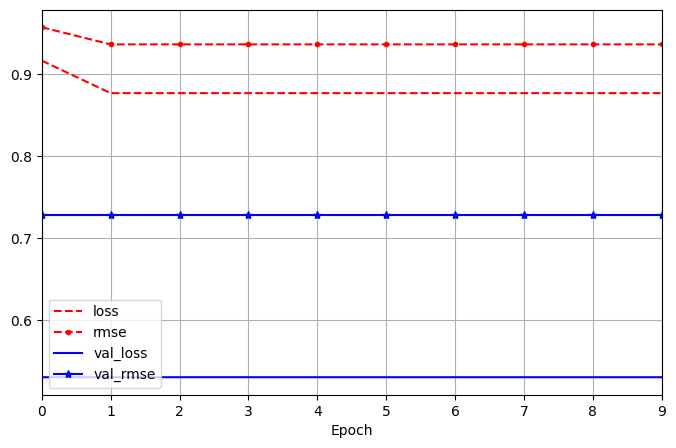

In [123]:
pd.DataFrame(history_reg.history).plot(figsize=(8, 5), xlim=[0, 9],  grid=True, xlabel="Epoch", style=["r--", "r--.", "b-", "b-*"])
plt.show()

Analizando el gráfico, podemos ver que la métrica RMSE de training está muy por encima del RMSE de testing y lo mismo sucede con la pérdida, por lo tanto contamos con overfitting. Además, no vemos que el modelo mejore a lo largo de las iteraciones